### PROBLEM STATEMENT : Businesses or companies can fall prey to default if they are not able to keep up their debt obligations. Defaults will lead to a lower credit rating for the company which in turn reduces its chances of getting credit in the future and may have to pay higher interest on existing debts as well as any new obligations. From an investor's point of view, he would want to invest in a company if it is capable of handling its financial obligations, can grow quickly, and is able to manage the growth scale.



In [741]:
# Importing the libraries
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns 
color = sns.color_palette()
from sklearn.impute import KNNImputer
import sklearn.metrics as metrics
from sklearn import metrics
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")
from scipy.stats import kurtosis 
from scipy.stats import skew 
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn import metrics
from sklearn.metrics import r2_score, mean_squared_error,mean_absolute_error
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import cross_val_score

pd.options.display.float_format = "{:,.4f}".format

# For randomized data splitting
from sklearn.model_selection import train_test_split,GridSearchCV

# To build linear regression_model
import statsmodels.api as sm

# To check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn import metrics


In [742]:
import folium

In [743]:
sns.set()
sns.set_palette(palette='deep')
import folium
from folium.plugins import FastMarkerCluster

In [744]:
# Import Dataset

df= pd.read_excel('innercity.xlsx') 

# Top 5 records of  Data


In [746]:
pd.options.display.max_columns = None
df.head()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
0,3876100940,20150427T000000,600000,4.0000,1.7500,"3,050.0000","9,440.0000",1,0,0.0000,3,8.0000,"1,800.0000","1,250.0000",1966,0,98034,47.7228,-122.1830,"2,020.0000","8,660.0000",0.0000,12490
1,3145600250,20150317T000000,190000,2.0000,1.0000,670.0000,"3,101.0000",1,0,0.0000,4,6.0000,670.0000,0.0000,1948,0,98118,47.5546,-122.2740,"1,660.0000","4,100.0000",0.0000,3771
2,7129303070,20140820T000000,735000,4.0000,2.7500,"3,040.0000","2,415.0000",2,1,4.0000,3,8.0000,"3,040.0000",0.0000,1966,0,98118,47.5188,-122.2560,"2,620.0000","2,433.0000",0.0000,5455
3,7338220280,20141010T000000,257000,3.0000,2.5000,"1,740.0000","3,721.0000",2,0,0.0000,3,8.0000,"1,740.0000",0.0000,2009,0,98002,47.3363,-122.2130,"2,030.0000","3,794.0000",0.0000,5461
4,7950300670,20150218T000000,450000,2.0000,1.0000,"1,120.0000","4,590.0000",1,0,0.0000,3,7.0000,"1,120.0000",0.0000,1924,0,98118,47.5663,-122.2850,"1,120.0000","5,100.0000",0.0000,5710


In [747]:

# Bottom 5 records of  Data
df.tail()

,cid,dayhours,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,basement,yr_built,yr_renovated,zipcode,lat,long,living_measure15,lot_measure15,furnished,total_area
21608,203600600,20150310T000000,685530,4.0000,2.5000,"3,130.0000","60,467.0000",2,0,0.0000,3,9.0000,"3,130.0000",0.0000,1996,0,98014,47.6618,-121.9620,"2,780.0000","44,224.0000",1.0000,63597
21609,625049281,20140521T000000,535000,2.0000,1.0000,"1,030.0000","4,841.0000",1,0,0.0000,3,7.0000,920.0000,110.0000,1939,0,98103,47.6860,-122.3410,"1,530.0000","4,944.0000",0.0000,5871
21610,424069018,20140905T000000,998000,3.0000,3.7500,"3,710.0000","34,412.0000",2,0,0.0000,3,10.0000,"2,910.0000",800.0000,1978,0,98075,47.5888,-122.0400,"2,390.0000","34,412.0000",1.0000,38122
21611,7258200055,20150206T000000,262000,4.0000,2.5000,"1,560.0000","7,800.0000",2,0,0.0000,3,7.0000,"1,560.0000",0.0000,1997,0,98168,47.5140,-122.3160,"1,160.0000","7,800.0000",0.0000,9360
21612,8805900430,20141229T000000,1150000,4.0000,2.5000,"1,940.0000","4,875.0000",2,0,0.0000,4,9.0000,"1,940.0000",0.0000,1925,0,98112,47.6427,-122.3040,"1,790.0000","4,875.0000",1.0000,6815


In [748]:
# Shape. of dataset
print('The number of rows in the dataset is ',df.shape[0],'\n''The number of columns in the dataset  is',df.shape[1])

The number of rows in the dataset is  21613 
The number of columns in the dataset  is 23


In [749]:
# Checking datatype of all columns
display(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cid               21613 non-null  int64  
 1   dayhours          21613 non-null  object 
 2   price             21613 non-null  int64  
 3   room_bed          21505 non-null  float64
 4   room_bath         21505 non-null  float64
 5   living_measure    21596 non-null  float64
 6   lot_measure       21571 non-null  float64
 7   ceil              21571 non-null  object 
 8   coast             21612 non-null  object 
 9   sight             21556 non-null  float64
 10  condition         21556 non-null  object 
 11  quality           21612 non-null  float64
 12  ceil_measure      21612 non-null  float64
 13  basement          21612 non-null  float64
 14  yr_built          21612 non-null  object 
 15  yr_renovated      21613 non-null  int64  
 16  zipcode           21613 non-null  int64 

None

In [750]:
# Duplicate  Value check
df.duplicated().sum()

0

In [751]:
# Null Value check
df.isna().sum()[df.isna().sum()>0]

room_bed            108
room_bath           108
living_measure       17
lot_measure          42
ceil                 42
coast                 1
sight                57
condition            57
quality               1
ceil_measure          1
basement              1
yr_built              1
living_measure15    166
lot_measure15        29
furnished            29
total_area           29
dtype: int64

In [752]:
# Junk Value check
df[df == '$'].count()[df[df == '$'].count()>0]

ceil          30
coast         30
condition     28
yr_built      14
long          34
total_area    39
dtype: int64

In [753]:
# Proportion of Junk values
proportion_of_junk_values=(df[df == '$'].count().sum())/(df.size)*100

print("Junk Values in the dataset is ", round(proportion_of_junk_values,2),"%")

Junk Values in the dataset is  0.04 %


In [754]:
# Proportion of missing values
proportion_of_nulls=(df.isnull().sum().sum())/(df.size)*100

print("Nulls in the dataset is ", round(proportion_of_nulls,2),"%")

Nulls in the dataset is  0.14 %


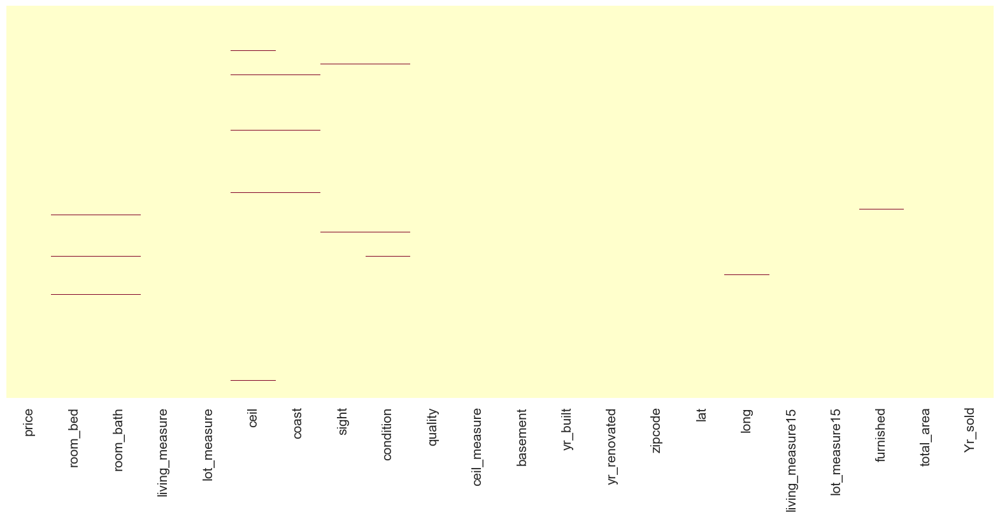

In [896]:
# Visualising missing values in  dataset before imputing
plt.figure(figsize = (20,8))
sns.heatmap(df.isnull(), cbar = False, cmap = 'YlOrRd', yticklabels = False)
plt.xticks(fontsize=15)
plt.show()

In [756]:
df.isna().sum()[df.isna().sum()>0].index

Index(['room_bed', 'room_bath', 'living_measure', 'lot_measure', 'ceil',
       'coast', 'sight', 'condition', 'quality', 'ceil_measure', 'basement',
       'yr_built', 'living_measure15', 'lot_measure15', 'furnished',
       'total_area'],
      dtype='object')

#### Descriptive statistics for the  variables

In [757]:
pd.options.display.float_format = '{:.2f}'.format   

df.describe().T

,count,mean,std,min,25%,50%,75%,max
cid,21613.00,4580301520.86,2876565571.31,1000102.00,2123049194.00,3904930410.00,7308900445.00,9900000190.00
price,21613.00,540182.16,367362.23,75000.00,321950.00,450000.00,645000.00,7700000.00
room_bed,21505.00,3.37,0.93,0.00,3.00,3.00,4.00,33.00
room_bath,21505.00,2.12,0.77,0.00,1.75,2.25,2.50,8.00
living_measure,21596.00,2079.86,918.50,290.00,1429.25,1910.00,2550.00,13540.00
lot_measure,21571.00,15104.58,41423.62,520.00,5040.00,7618.00,10684.50,1651359.00
sight,21556.00,0.23,0.77,0.00,0.00,0.00,0.00,4.00
quality,21612.00,7.66,1.18,1.00,7.00,7.00,8.00,13.00
ceil_measure,21612.00,1788.37,828.10,290.00,1190.00,1560.00,2210.00,9410.00
basement,21612.00,291.52,442.58,0.00,0.00,0.00,560.00,4820.00


In [758]:
df.describe(include=['object'])

,dayhours,ceil,coast,condition,yr_built,long,total_area
count,21613,21571,21612,21556,21612,21613.00,21584
unique,372,7,3,6,117,753.00,11145
top,20140623T000000,1,0,3,2014,-122.29,$
freq,142,10647,21421,13978,559,116.00,39


In [759]:
df['cid'].value_counts()[df['cid'].value_counts()>1].count()

176

In [760]:
df.describe()["price"]


count     21613.00
mean     540182.16
std      367362.23
min       75000.00
25%      321950.00
50%      450000.00
75%      645000.00
max     7700000.00
Name: price, dtype: float64

In [761]:
df.describe()["room_bed"]

count   21505.00
mean        3.37
std         0.93
min         0.00
25%         3.00
50%         3.00
75%         4.00
max        33.00
Name: room_bed, dtype: float64

In [762]:
df['room_bed'].value_counts(normalize=True)

3.00    0.45
4.00    0.32
2.00    0.13
5.00    0.07
6.00    0.01
1.00    0.01
7.00    0.00
8.00    0.00
0.00    0.00
9.00    0.00
10.00   0.00
33.00   0.00
11.00   0.00
Name: room_bed, dtype: float64

In [763]:
df['room_bath'].value_counts(normalize=True)

2.50   0.25
1.00   0.18
1.75   0.14
2.25   0.09
2.00   0.09
1.50   0.07
2.75   0.05
3.00   0.03
3.50   0.03
3.25   0.03
3.75   0.01
4.00   0.01
4.50   0.00
4.25   0.00
0.75   0.00
4.75   0.00
5.00   0.00
5.25   0.00
5.50   0.00
0.00   0.00
1.25   0.00
6.00   0.00
5.75   0.00
0.50   0.00
8.00   0.00
6.75   0.00
6.50   0.00
6.25   0.00
7.50   0.00
7.75   0.00
Name: room_bath, dtype: float64

In [764]:
df.describe()["room_bath"]

count   21505.00
mean        2.12
std         0.77
min         0.00
25%         1.75
50%         2.25
75%         2.50
max         8.00
Name: room_bath, dtype: float64

In [765]:
df.describe()["living_measure"]

count   21596.00
mean     2079.86
std       918.50
min       290.00
25%      1429.25
50%      1910.00
75%      2550.00
max     13540.00
Name: living_measure, dtype: float64

In [766]:
df.describe()["lot_measure"]

count     21571.00
mean      15104.58
std       41423.62
min         520.00
25%        5040.00
50%        7618.00
75%       10684.50
max     1651359.00
Name: lot_measure, dtype: float64

In [767]:
df.ceil.value_counts(normalize=True)

1     0.49
2     0.38
1.5   0.09
3     0.03
2.5   0.01
$     0.00
3.5   0.00
Name: ceil, dtype: float64

In [768]:
df.coast.value_counts(normalize=True)

0   0.99
1   0.01
$   0.00
Name: coast, dtype: float64

In [769]:
df['sight'].value_counts(normalize=True)

0.00   0.90
2.00   0.04
3.00   0.02
1.00   0.02
4.00   0.01
Name: sight, dtype: float64

In [770]:
df['condition'].value_counts(normalize=True)

3   0.65
4   0.26
5   0.08
2   0.01
1   0.00
$   0.00
Name: condition, dtype: float64

In [771]:
df['quality'].value_counts(normalize=True)

7.00    0.42
8.00    0.28
9.00    0.12
6.00    0.09
10.00   0.05
11.00   0.02
5.00    0.01
12.00   0.00
4.00    0.00
13.00   0.00
3.00    0.00
1.00    0.00
Name: quality, dtype: float64

In [772]:
df['quality'].value_counts()

7.00     8981
8.00     6067
9.00     2615
6.00     2038
10.00    1134
11.00     399
5.00      242
12.00      90
4.00       29
13.00      13
3.00        3
1.00        1
Name: quality, dtype: int64

In [773]:
df.describe()['ceil_measure']

count   21612.00
mean     1788.37
std       828.10
min       290.00
25%      1190.00
50%      1560.00
75%      2210.00
max      9410.00
Name: ceil_measure, dtype: float64

In [774]:
df.describe()['basement']

count   21612.00
mean      291.52
std       442.58
min         0.00
25%         0.00
50%         0.00
75%       560.00
max      4820.00
Name: basement, dtype: float64

In [775]:
df['yr_built'].value_counts(normalize=True)

2014   0.03
2006   0.02
2005   0.02
2004   0.02
2003   0.02
       ... 
1901   0.00
1902   0.00
1935   0.00
1934   0.00
$      0.00
Name: yr_built, Length: 117, dtype: float64

In [776]:
df['yr_renovated'].value_counts(normalize=True)

0      0.96
2014   0.00
2013   0.00
2003   0.00
2007   0.00
       ... 
1944   0.00
1948   0.00
1959   0.00
1951   0.00
1954   0.00
Name: yr_renovated, Length: 70, dtype: float64

In [777]:
df['lat'].value_counts()

47.55    17
47.68    17
47.66    17
47.53    17
47.67    16
         ..
47.62     1
47.76     1
47.29     1
47.29     1
47.39     1
Name: lat, Length: 5034, dtype: int64

In [778]:
df['long'].unique()

array([-122.183, -122.274, -122.256, -122.213, -122.285, '$', -122.333,
       -122.165, -122.15, -122.178, -121.87, -122.352, -122.122, -122.275,
       -122.234, -122.324, -122.321, -122.277, -122.196, -122.398,
       -122.019, -122.181, -122.325, -122.191, -122.026, -122.084, -122.3,
       -122.287, -122.011, -122.127, -122.281, -122.221, -121.859,
       -121.913, -122.39, -121.871, -122.013, -122.381, -122.279,
       -122.194, -122.201, -122.125, -122.379, -122.121, -122.024,
       -122.389, -122.305, -122.346, -122.375, -122.344, -122.028,
       -122.193, -122.209, -122.365, -122.28, -122.334, -122.149,
       -122.388, -122.016, -122.298, -122.153, -121.802, -121.878,
       -122.218, -122.359, -122.296, -122.361, -122.357, -122.309,
       -122.056, -121.974, -122.18, -122.331, -122.374, -121.976,
       -121.975, -122.216, -122.188, -122.391, -122.31, -122.302,
       -121.972, -122.22, -122.17, -122.101, -121.888, -122.046, -122.154,
       -122.145, -122.236, -122.168, 

In [779]:
df.describe()["living_measure15"]

count   21447.00
mean     1987.07
std       685.52
min       399.00
25%      1490.00
50%      1840.00
75%      2360.00
max      6210.00
Name: living_measure15, dtype: float64

In [780]:
df.describe()["lot_measure15"]

count    21584.00
mean     12766.54
std      27286.99
min        651.00
25%       5100.00
50%       7620.00
75%      10087.00
max     871200.00
Name: lot_measure15, dtype: float64

In [781]:
df["furnished"].value_counts(normalize=True)

0.00   0.80
1.00   0.20
Name: furnished, dtype: float64

In [782]:
df["total_area"].value_counts()

$        39
6770     19
5940     19
7330     19
9060     19
         ..
15707     1
5355      1
12215     1
46580     1
38122     1
Name: total_area, Length: 11145, dtype: int64

In [783]:
#Let's look at the distribution of price at different percentiles
print(" 5% of the properties have a price lower than ${0: .2f}".format(np.percentile(df["price"], 5)))
print("25% of the properties have a price lower than ${0: .2f}".format(np.percentile(df["price"], 25)))
print("50% of the properties have a price lower than ${0: .2f}".format(np.percentile(df["price"], 50)))
print("75% of the properties have a price lower than ${0: .2f}".format(np.percentile(df["price"], 75)))
print("90% of the properties have a price lower than ${0: .2f}".format(np.percentile(df["price"], 90)))
print("95% of the properties have a price lower than ${0: .2f}".format(np.percentile(df["price"], 95)))
print("99% of the properties have a price lower than ${0: .2f}".format(np.percentile(df["price"], 99)))

 5% of the properties have a price lower than $ 210000.00
25% of the properties have a price lower than $ 321950.00
50% of the properties have a price lower than $ 450000.00
75% of the properties have a price lower than $ 645000.00
90% of the properties have a price lower than $ 887000.00
95% of the properties have a price lower than $ 1160000.00
99% of the properties have a price lower than $ 1968800.00


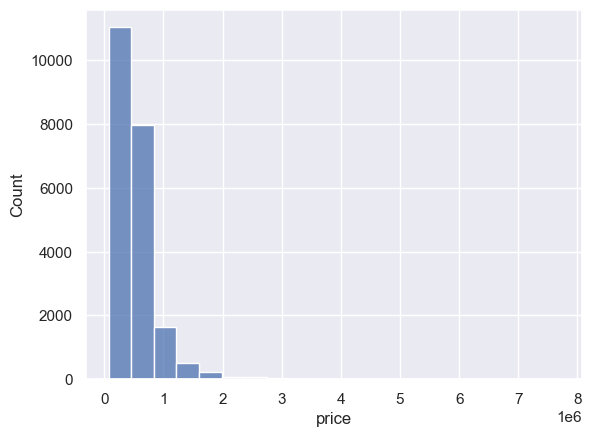

In [784]:
sns.histplot(df['price'],bins=20);
plt.show()

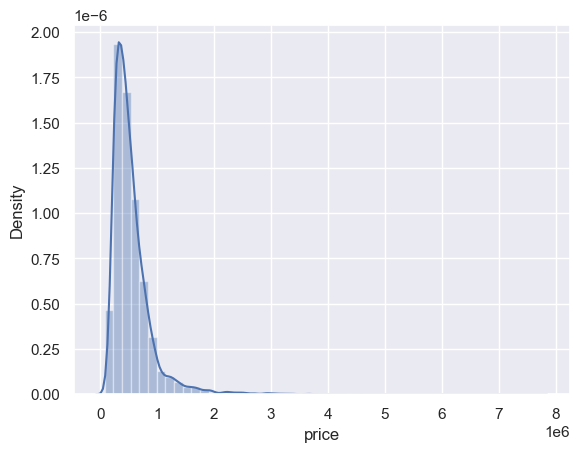

In [785]:
sns.distplot(df['price']);
plt.show()

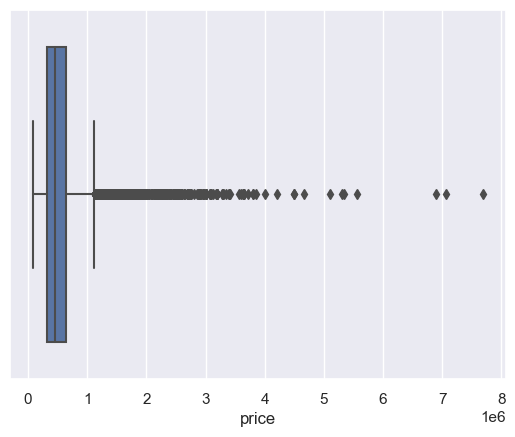

In [786]:
sns.boxplot(df['price']);
plt.show()

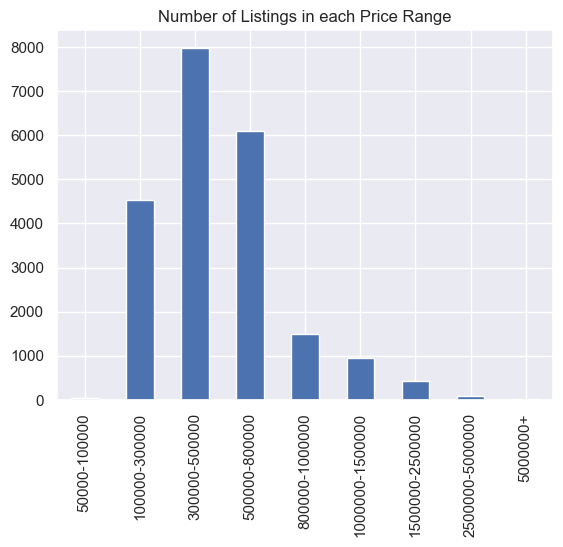

In [787]:
## Let's create a range variable to understand how many records we have in different slabs

price_range = pd.cut(df["price"], 
                     bins=[50000, 100000, 300000,500000,800000, 1000000, 1500000,2500000, 5000000,df["price"].max()], 
                     labels=["50000-100000","100000-300000", "300000-500000","500000-800000", "800000-1000000","1000000-1500000", "1500000-2500000", "2500000-5000000", "5000000+"])
df["price_range"] = price_range 
df["price_range"].value_counts().sort_index().plot(kind="bar")
plt.title("Number of Listings in each Price Range")
plt.show()

In [788]:
df.drop(['price_range'],axis=1,inplace=True)

## Transformation of Target Variable

In [789]:
from scipy import stats

_, p = stats.normaltest(df['price'])
print(p)

0.0


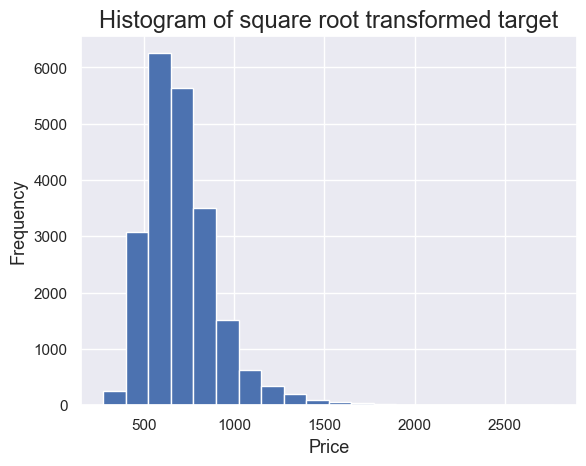

In [790]:
## Apply Square Root Scaling
y_sqrt = np.sqrt(df['price'])
plt.hist(y_sqrt,bins=20)
plt.title("Histogram of square root transformed target", size=17)
plt.xlabel("Price", size=13)
plt.ylabel("Frequency", size=13)
plt.show()

In [791]:
from scipy import stats

_, p = stats.normaltest(y_sqrt)
print(p)

0.0


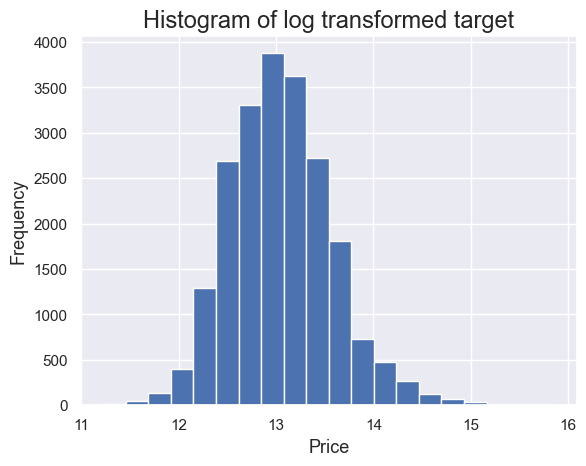

In [792]:
## Apply log  Scaling
y_log = np.log(df['price'])
plt.hist(y_log,bins=20)
plt.title("Histogram of log transformed target", size=17)
plt.xlabel("Price", size=13)
plt.ylabel("Frequency", size=13)
plt.show()

In [793]:
from scipy import stats

_, p = stats.normaltest(y_log)
print(p)

2.308725847410902e-186


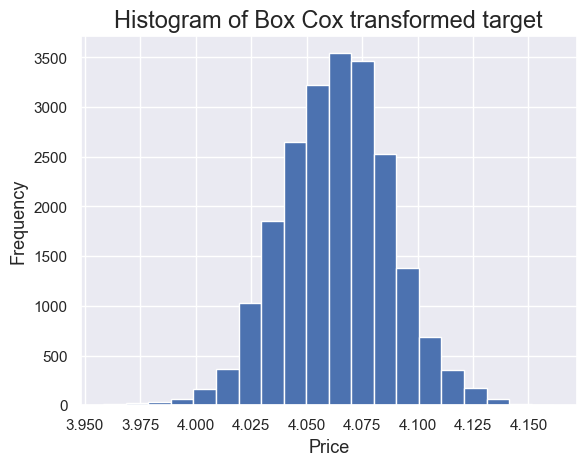

In [794]:
from scipy import stats
y_bc, lambda_bc = stats.boxcox(df['price'])
plt.hist(y_bc,bins=20)
plt.title("Histogram of Box Cox transformed target", size=17)
plt.xlabel("Price", size=13)
plt.ylabel("Frequency", size=13)
plt.show()

In [795]:
from scipy import stats

_, p = stats.normaltest(y_bc)
print(p)

1.5422148070630482e-15


In [796]:
df_long=df[df.long!='$']

## Mapping the Longitude and Longitude

In [797]:

lat = df_long['lat'].tolist()
lon = df_long['long'].tolist()
locations = list(zip(lat, lon))



map1 = folium.Map(location=[47.7228, -122.183], zoom_start=15)
FastMarkerCluster(locations).add_to(map1)
map1


In [798]:
df_num=[]
df_cat=[]
df_oth=[]
for i in df.columns:
    if df[i].dtype=='category':
        df_cat.append(i)
    elif df[i].dtype=='object':
        df_cat.append(i)
    elif df[i].dtype=='int64':
        df_num.append(i)
    elif df[i].dtype=='float64':
        df_num.append(i)
    elif df[i].dtype=='int32':
        df_num.append(i)
    else:
        df_oth.append(i)
        
print(df_num)
print(df_cat)

['cid', 'price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure', 'sight', 'quality', 'ceil_measure', 'basement', 'yr_renovated', 'zipcode', 'lat', 'living_measure15', 'lot_measure15', 'furnished']
['dayhours', 'ceil', 'coast', 'condition', 'yr_built', 'long', 'total_area']


## Univariate Analysis 

Distribution of cid
Skewness  of cid : 0.24
Kurtosis  of cid : -1.2605278706669563


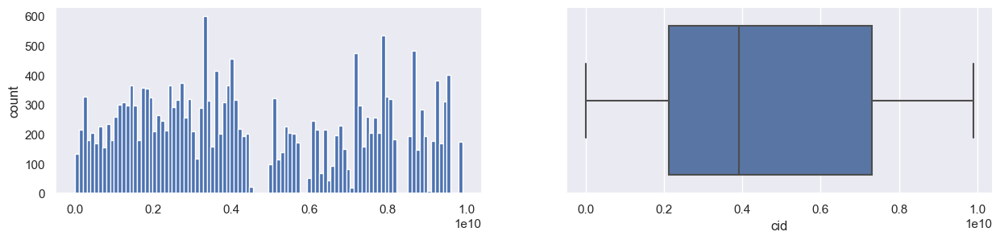

Distribution of price
Skewness  of price : 4.02
Kurtosis  of price : 34.514180829647714


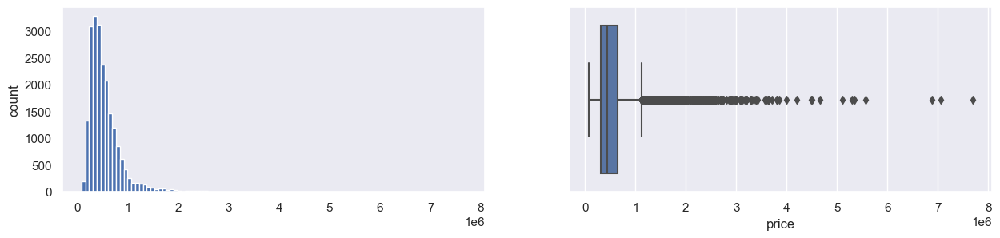

Distribution of room_bed
Skewness  of room_bed : 1.98
Kurtosis  of room_bed : nan


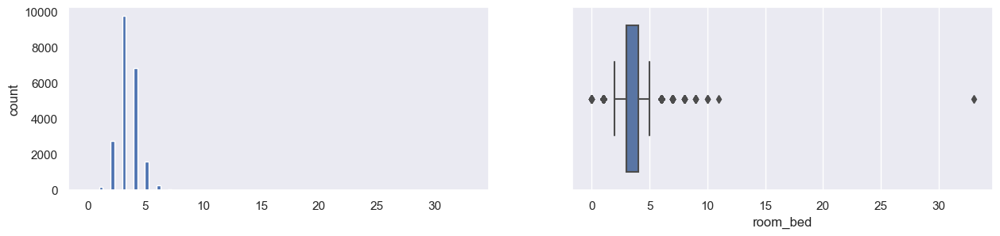

Distribution of room_bath
Skewness  of room_bath : 0.51
Kurtosis  of room_bath : nan


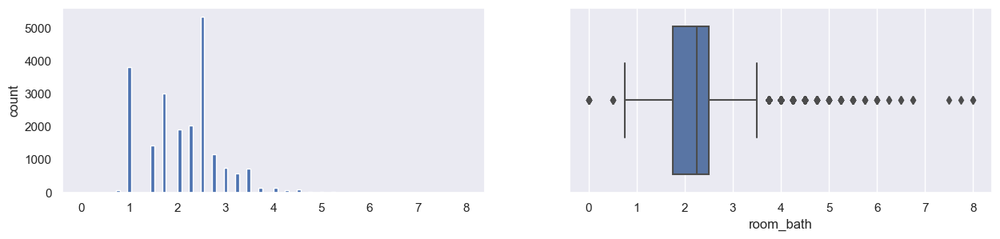

Distribution of living_measure
Skewness  of living_measure : 1.47
Kurtosis  of living_measure : nan


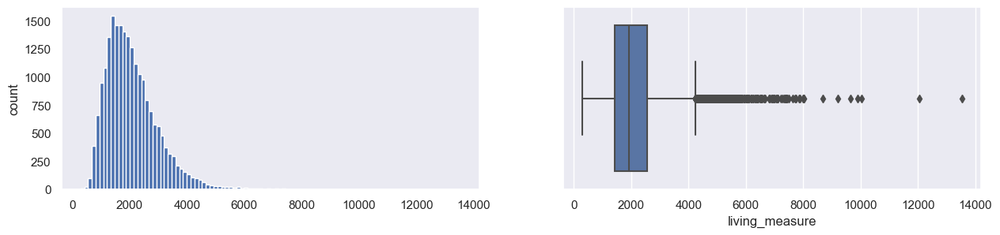

Distribution of lot_measure
Skewness  of lot_measure : 13.07
Kurtosis  of lot_measure : nan


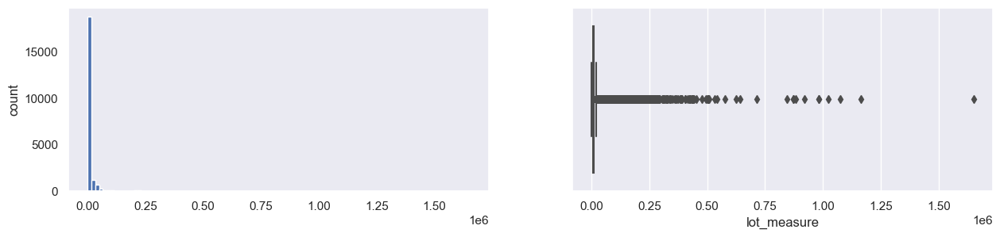

Distribution of sight
Skewness  of sight : 3.4
Kurtosis  of sight : nan


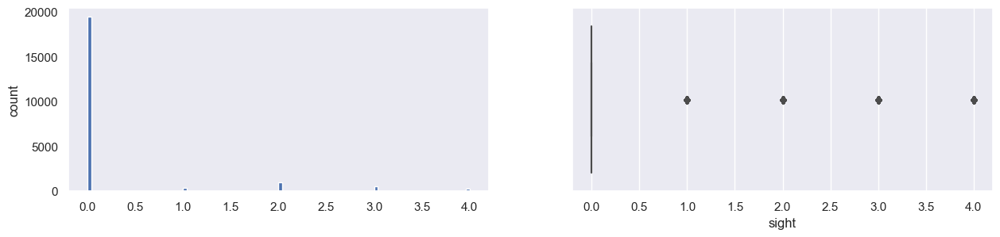

Distribution of quality
Skewness  of quality : 0.77
Kurtosis  of quality : nan


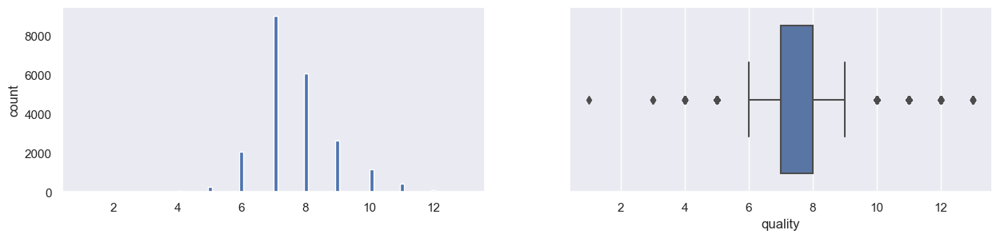

Distribution of ceil_measure
Skewness  of ceil_measure : 1.45
Kurtosis  of ceil_measure : nan


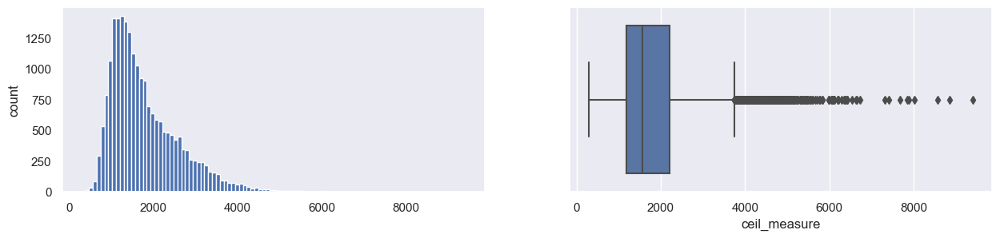

Distribution of basement
Skewness  of basement : 1.58
Kurtosis  of basement : nan


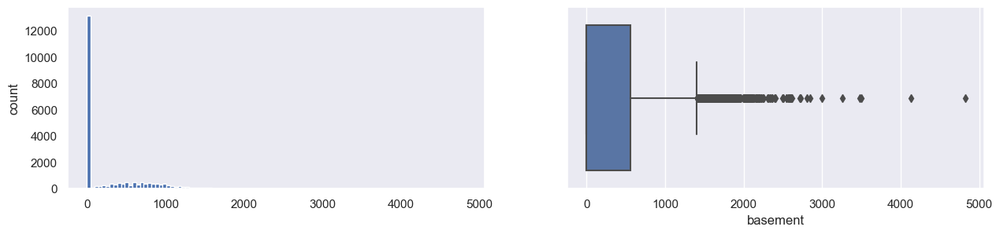

Distribution of yr_renovated
Skewness  of yr_renovated : 4.55
Kurtosis  of yr_renovated : 18.69654843341467


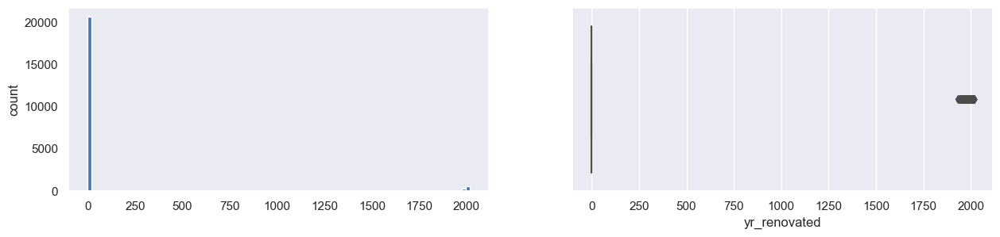

Distribution of zipcode
Skewness  of zipcode : 0.41
Kurtosis  of zipcode : -0.8535590381317446


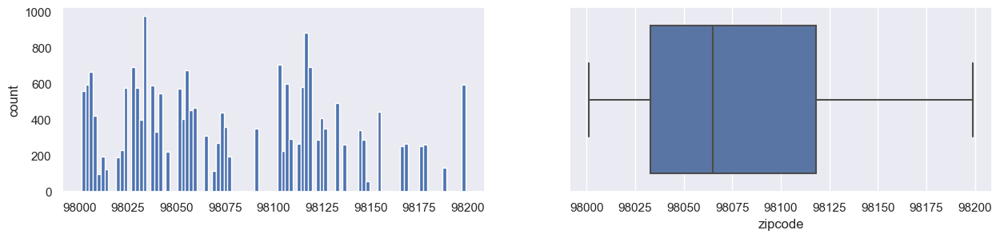

Distribution of lat
Skewness  of lat : -0.49
Kurtosis  of lat : -0.6764341498242992


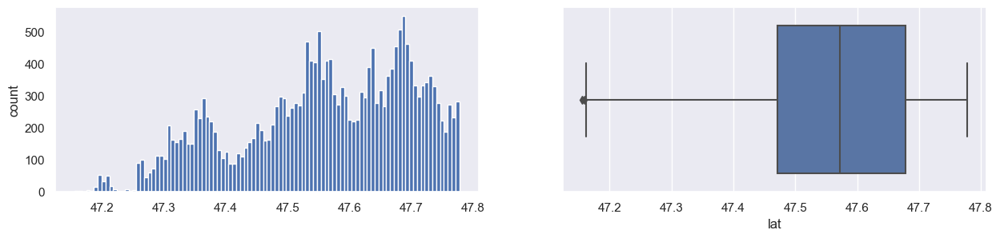

Distribution of living_measure15
Skewness  of living_measure15 : 1.11
Kurtosis  of living_measure15 : nan


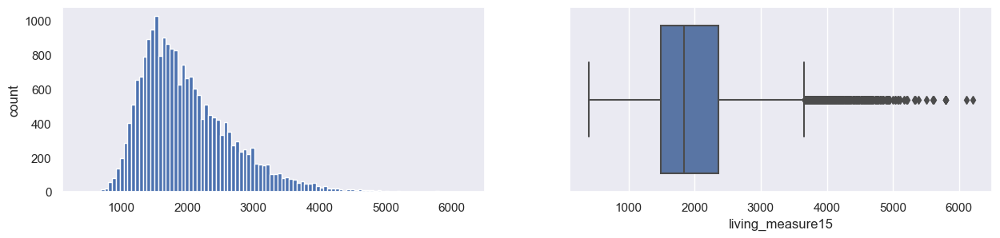

Distribution of lot_measure15
Skewness  of lot_measure15 : 9.52
Kurtosis  of lot_measure15 : nan


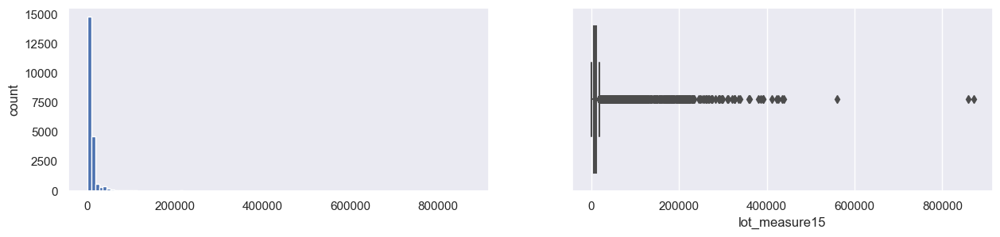

Distribution of furnished
Skewness  of furnished : 1.53
Kurtosis  of furnished : nan


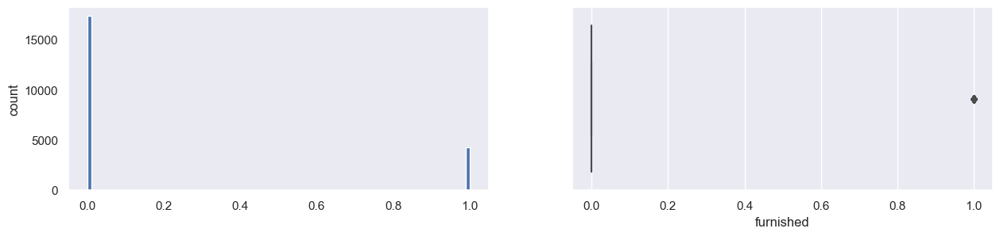

In [799]:
for col in df_num:
    print(f"Distribution of {col}")
    print(f"Skewness  of {col} : {round(df[col].skew(),2)}")
    print(f"Kurtosis  of {col} : {kurtosis(df[col], axis=0, bias=True)}")
    plt.figure(figsize=(15,3))
    plt.subplot(1,2,1)
    df[col].hist(bins=100, grid=False)
    plt.ylabel('count')
    plt.subplot(1,2,2)
    sns.boxplot(x=df[col])
    plt.show()

In [800]:
df_cat=['ceil', 'coast', 'condition','quality']

ceil


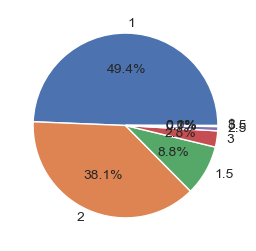

coast


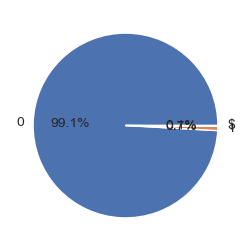

condition


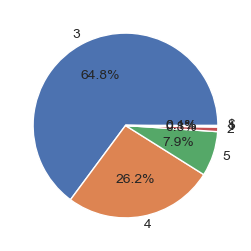

quality


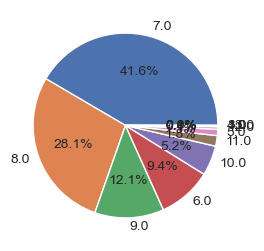

In [801]:
for col in df_cat:
    print(col)
    plt.figure(figsize=(8,3))
    labels = df[col].value_counts().keys()
    plt.pie(df[col].value_counts(), autopct="%.1f%%", labels=labels,textprops={'fontsize': 10})
    plt.xticks(rotation=90)
    plt.show()

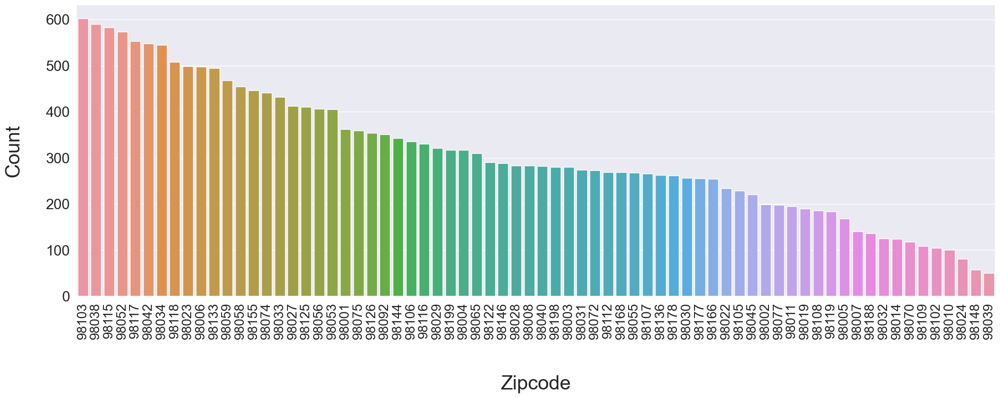

In [802]:
order = df['zipcode'].value_counts().index
plt.figure(figsize=(25,8))
sns.countplot(x=df['zipcode'],order=order)
plt.xticks(rotation=90)
plt.xlabel("Zipcode",fontsize=30,labelpad=55)
plt.ylabel("Count",fontsize=30,labelpad=35)
plt.xticks(fontsize=20)
plt.yticks(fontsize=22)
plt.show()

## Bivariate Analysis 

Property_Quality    1.00   3.00   4.00   5.00   6.00   7.00   8.00   9.00   \
Number_of_Bedrooms                                                           
0.00                    1      0      2      0      0      6      3      0   
1.00                    0      3     12     37     76     52     14      2   
2.00                    0      0     14    114    820   1199    496     78   
3.00                    0      0      1     62    852   4883   2783    825   
4.00                    0      0      0     21    233   2167   2184   1344   
5.00                    0      0      0      5     41    500    453    312   
6.00                    0      0      0      3      7     97     89     33   
7.00                    0      0      0      0      1     11     12      4   
8.00                    0      0      0      0      0      6      4      1   
9.00                    0      0      0      0      0      4      1      0   
10.00                   0      0      0      0      0      2    

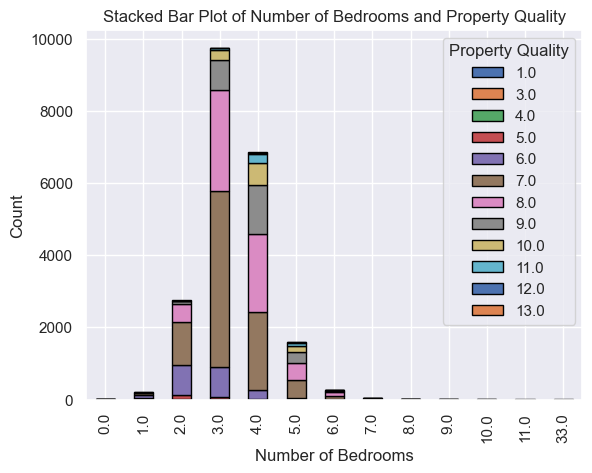

In [803]:
import matplotlib.pyplot as plt
import pandas as pd

# Example dataset
data = {'Number_of_Bedrooms': df['room_bed'].values,
        'Property_Quality': df['quality'].values}

df_cat = pd.DataFrame(data)

# Create a cross-tabulation (contingency table)
cross_tab = pd.crosstab(df_cat['Number_of_Bedrooms'], df_cat['Property_Quality'])
print(cross_tab)
# Plotting the stacked bar plot
cross_tab.plot(kind='bar', stacked=True, edgecolor='black')

# Adding labels and title
plt.xlabel('Number of Bedrooms')
plt.ylabel('Count')
plt.title('Stacked Bar Plot of Number of Bedrooms and Property Quality')

# Display the legend
plt.legend(title='Property Quality')

# Show the plot
plt.show()

Condition          1   2     3     4    5   $
Property_Quality                             
1.00               1   0     0     0    0   0
3.00               0   1     1     0    1   0
4.00               1   5    13    10    0   0
5.00               9  15    99    84   34   0
6.00              11  58  1029   685  248   3
7.00               6  75  5211  2818  827  12
8.00               2  13  4255  1390  390   8
9.00               0   2  2035   444  125   2
10.00              0   2   919   154   55   3
11.00              0   0   331    55   11   0
12.00              0   0    74    13    3   0
13.00              0   0    11     2    0   0


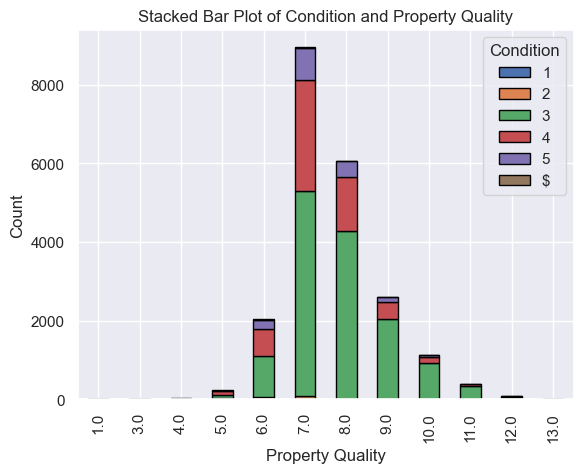

In [804]:

# Example dataset
data = {'Condition': df['condition'].values,
        'Property_Quality': df['quality'].values}

df_cat = pd.DataFrame(data)

# Create a cross-tabulation (contingency table)
cross_tab = pd.crosstab(df_cat['Property_Quality'], df_cat['Condition'])
print(cross_tab)
# Plotting the stacked bar plot
cross_tab.plot(kind='bar', stacked=True, edgecolor='black')

# Adding labels and title
plt.xlabel('Property Quality')
plt.ylabel('Count')
plt.title('Stacked Bar Plot of Condition and Property Quality')

# Display the legend
plt.legend(title='Condition')

# Show the plot
plt.show()

Number_of_Bedrooms   0.00   1.00   2.00   3.00   4.00   5.00   6.00   7.00   \
Number_of_Bathrooms                                                           
0.00                     7      3      0      0      0      0      0      0   
0.50                     0      1      2      0      1      0      0      0   
0.75                     1     27     26     16      2      0      0      0   
1.00                     1    136   1550   1769    323     43      6      1   
1.25                     0      2      3      4      0      0      0      0   
1.50                     1     12    292    825    253     48      6      2   
1.75                     0      4    304   1856    718    133     15      0   
2.00                     0      6    214   1040    522    110     24      0   
2.25                     0      4    118   1078    705    116     15      3   
2.50                     3      2    197   2344   2494    286     29      2   
2.75                     0      0     19    274    6

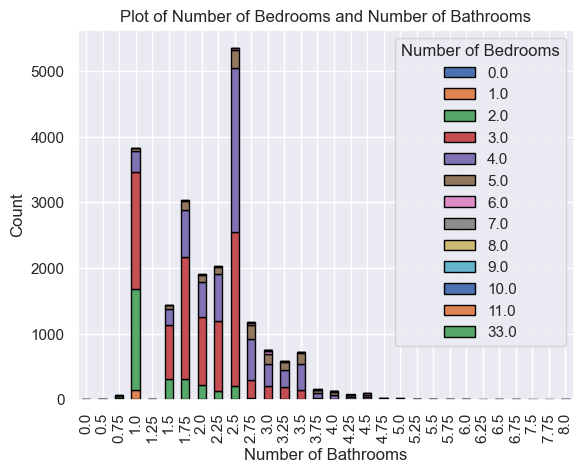

In [805]:
import matplotlib.pyplot as plt
import pandas as pd

# Example dataset
data = {'Number_of_Bedrooms': df['room_bed'].values,
        'Number_of_Bathrooms': df['room_bath'].values}

df_cat = pd.DataFrame(data)

# Create a cross-tabulation (contingency table)
cross_tab = pd.crosstab(df_cat['Number_of_Bathrooms'], df_cat['Number_of_Bedrooms'])
print(cross_tab)
# Plotting the stacked bar plot
cross_tab.plot(kind='bar', stacked=True, edgecolor='black')

# Adding labels and title
plt.xlabel('Number of Bathrooms')
plt.ylabel('Count')
plt.title('Plot of Number of Bedrooms and Number of Bathrooms')

# Display the legend
plt.legend(title='Number of Bedrooms')

# Show the plot
plt.show()

Furnished           0.00  1.00
Number_of_Bedrooms            
0.00                  12     1
1.00                 194     3
2.00                2639   104
3.00                8573  1185
4.00                4595  2244
5.00                 998   596
6.00                 196    74
7.00                  24    14
8.00                  10     3
9.00                   5     1
10.00                  2     1
11.00                  1     0
33.00                  1     0


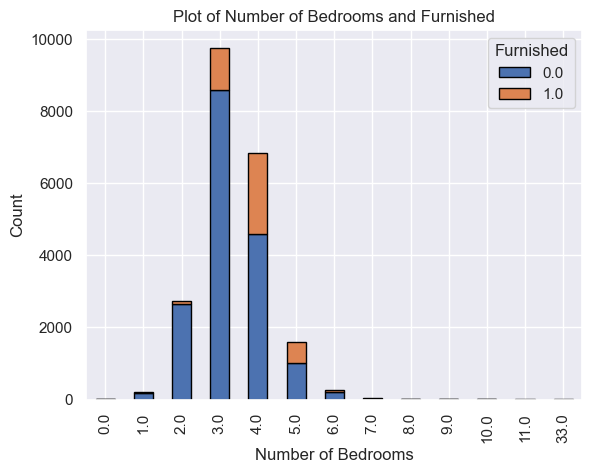

In [806]:
# Example dataset
data = {'Number_of_Bedrooms': df['room_bed'].values,
        'Furnished': df['furnished'].values}

df_cat = pd.DataFrame(data)

# Create a cross-tabulation (contingency table)
cross_tab = pd.crosstab(df_cat['Number_of_Bedrooms'], df_cat['Furnished'])
print(cross_tab)
# Plotting the stacked bar plot
cross_tab.plot(kind='bar', stacked=True, edgecolor='black')

# Adding labels and title
plt.xlabel('Number of Bedrooms')
plt.ylabel('Count')
plt.title('Plot of Number of Bedrooms and Furnished')

# Display the legend
plt.legend(title='Furnished')

# Show the plot
plt.show()

Number of Views     0.00  1.00  2.00  3.00  4.00
Number_of_Bedrooms                              
0.00                  11     0     2     0     0
1.00                 179     2     7     3     6
2.00                2529    42    97    35    38
3.00                8964   120   377   182   105
4.00                6077   121   326   211   106
5.00                1321    41   118    61    48
6.00                 215     3    22    15    13
7.00                  29     3     4     0     2
8.00                  12     0     0     1     0
9.00                   6     0     0     0     0
10.00                  2     0     1     0     0
11.00                  1     0     0     0     0
33.00                  1     0     0     0     0


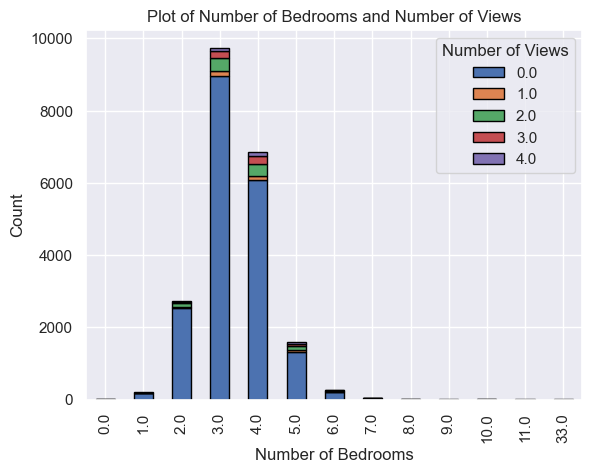

In [807]:
# Example dataset
data = {'Number_of_Bedrooms': df['room_bed'].values,
        'Number of Views': df['sight'].values}

df_cat = pd.DataFrame(data)

# Create a cross-tabulation (contingency table)
cross_tab = pd.crosstab(df_cat['Number_of_Bedrooms'], df_cat['Number of Views'])
print(cross_tab)
# Plotting the stacked bar plot
cross_tab.plot(kind='bar', stacked=True, edgecolor='black')

# Adding labels and title
plt.xlabel('Number of Bedrooms')
plt.ylabel('Count')
plt.title('Plot of Number of Bedrooms and Number of Views')

# Display the legend
plt.legend(title='Number of Views')

# Show the plot
plt.show()

Waterfront_View        0   1   $
Number_of_Bedrooms              
0.00                  13   0   0
1.00                 192   5   0
2.00                2712  31   4
3.00                9689  62  15
4.00                6806  40   8
5.00                1573  19   3
6.00                 266   4   0
7.00                  38   0   0
8.00                  13   0   0
9.00                   6   0   0
10.00                  3   0   0
11.00                  1   0   0
33.00                  1   0   0


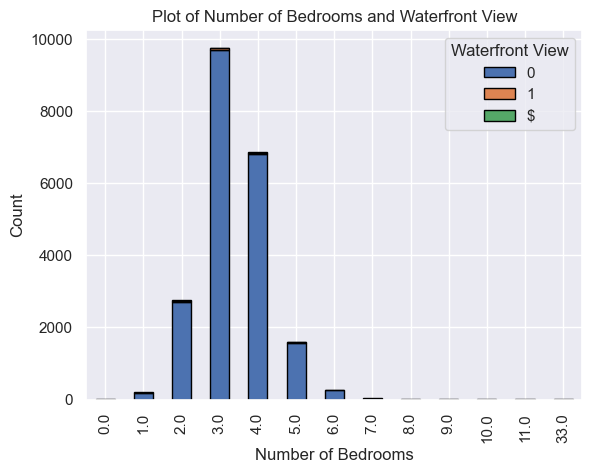

In [808]:
# Example dataset
data = {'Number_of_Bedrooms': df['room_bed'].values,
        'Waterfront_View': df['coast'].values}

df_cat = pd.DataFrame(data)

# Create a cross-tabulation (contingency table)
cross_tab = pd.crosstab(df_cat['Number_of_Bedrooms'], df_cat['Waterfront_View'])
print(cross_tab)
# Plotting the stacked bar plot
cross_tab.plot(kind='bar', stacked=True, edgecolor='black')

# Adding labels and title
plt.xlabel('Number of Bedrooms')
plt.ylabel('Count')
plt.title('Plot of Number of Bedrooms and Waterfront View')

# Display the legend
plt.legend(title='Waterfront View')

# Show the plot
plt.show()

Waterfront           0    1   $
Number_of_Views                
0.00             19412    0  25
1.00               331    1   0
2.00               950    8   1
3.00               489   18   3
4.00               183  134   1


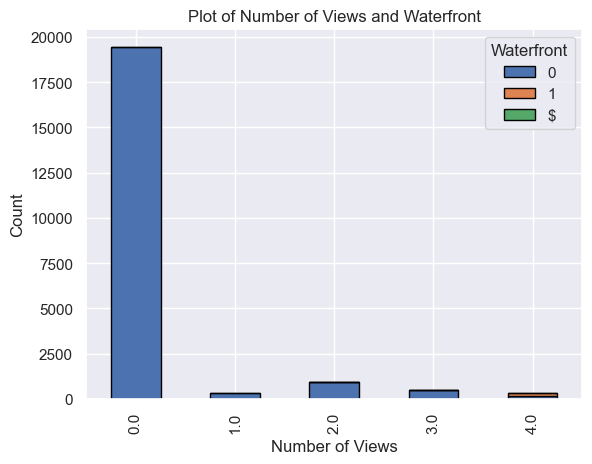

In [809]:
# Example dataset
data = {'Number_of_Views': df['sight'].values,
        'Waterfront': df['coast'].values}

df_cat = pd.DataFrame(data)

# Create a cross-tabulation (contingency table)
cross_tab = pd.crosstab(df_cat['Number_of_Views'], df_cat['Waterfront'])
print(cross_tab)
# Plotting the stacked bar plot
cross_tab.plot(kind='bar', stacked=True, edgecolor='black')

# Adding labels and title
plt.xlabel('Number of Views')
plt.ylabel('Count')
plt.title('Plot of Number of Views and Waterfront')

# Display the legend
plt.legend(title='Waterfront')

# Show the plot
plt.show()

Furnished         0.00  1.00
Number_of_Views             
0.00             16113  3295
1.00               223   109
2.00               595   364
3.00               239   271
4.00               121   197


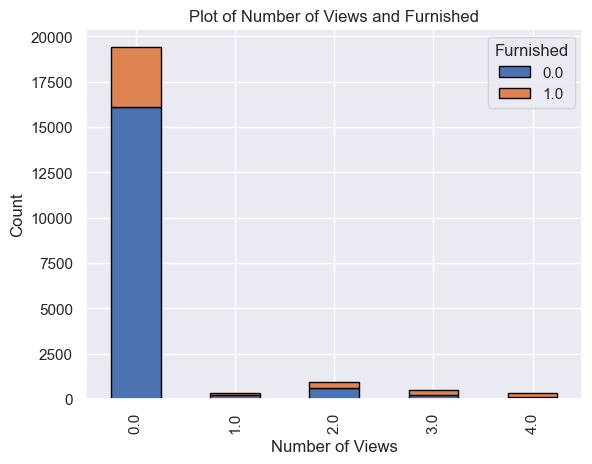

In [810]:
# Example dataset
data = {'Number_of_Views': df['sight'].values,
        'Furnished': df['furnished'].values}

df_cat = pd.DataFrame(data)

# Create a cross-tabulation (contingency table)
cross_tab = pd.crosstab(df_cat['Number_of_Views'], df_cat['Furnished'])
print(cross_tab)
# Plotting the stacked bar plot
cross_tab.plot(kind='bar', stacked=True, edgecolor='black')

# Adding labels and title
plt.xlabel('Number of Views')
plt.ylabel('Count')
plt.title('Plot of Number of Views and Furnished')

# Display the legend
plt.legend(title='Furnished')

# Show the plot
plt.show()

In [811]:
df_box= pd.read_excel('innercity.xlsx') 

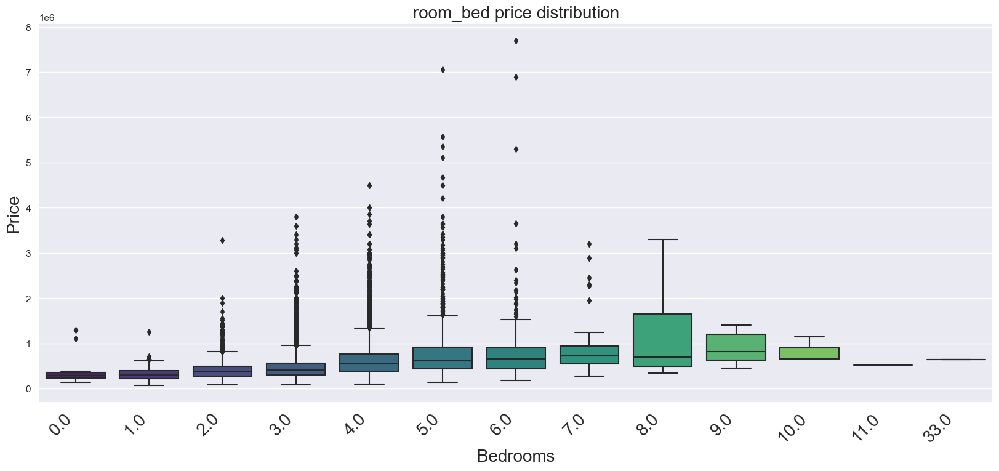

In [812]:
## Let's check if Numer of Rooms has any price impact

plt.figure(figsize=(20,8))

chart=sns.boxplot(x="room_bed", y="price", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=20)
plt.title('room_bed price distribution', fontsize=20)
chart;

plt.xlabel('Bedrooms', fontsize=20)  # Adjust the font size as needed
plt.ylabel('Price', fontsize=20)  # Adjust the font size as needed

plt.show()

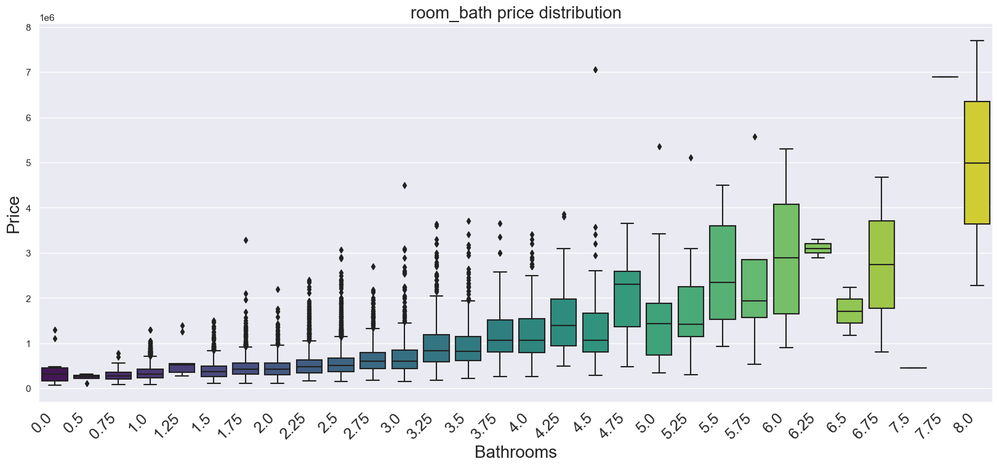

In [813]:
## Let's check if  Numer of Bathrooms has any price impact

plt.figure(figsize=(20,8))

chart=sns.boxplot(x="room_bath", y="price", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=18)
plt.title('room_bath price distribution')
chart;
plt.title('room_bath price distribution', fontsize=20)
plt.xlabel('Bathrooms', fontsize=20)  # Adjust the font size as needed
plt.ylabel('Price', fontsize=20)  # Adjust the font size as needed
plt.show()
chart;



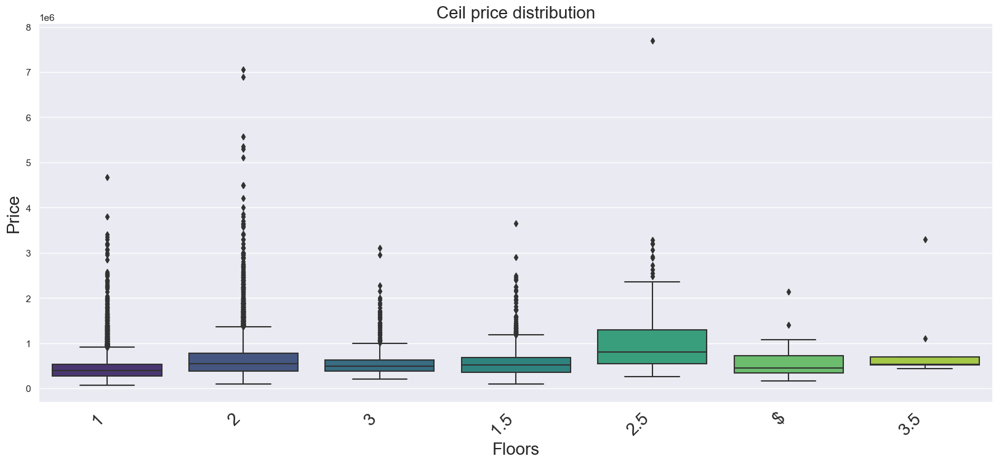

In [814]:
## Let's check if  Number of floors has any price impact

plt.figure(figsize=(20,8))

chart=sns.boxplot(x="ceil", y="price", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=20)
plt.title('Ceil price distribution', fontsize=20)
plt.xlabel('Floors', fontsize=20)  # Adjust the font size as needed
plt.ylabel('Price', fontsize=20)  # Adjust the font size as needed
plt.show()
chart;


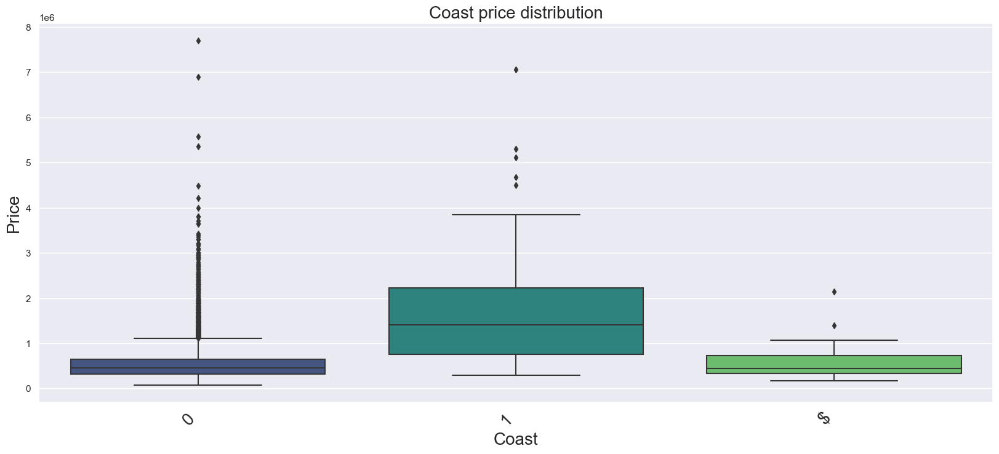

In [815]:
## Let's check if  waterfront view has any price impact

plt.figure(figsize=(20,8))

chart=sns.boxplot(x="coast", y="price", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=20)
plt.title('Coast price distribution', fontsize=20)
plt.xlabel('Coast', fontsize=20)  # Adjust the font size as needed
plt.ylabel('Price', fontsize=20)  # Adjust the font size as needed
plt.show()
chart;


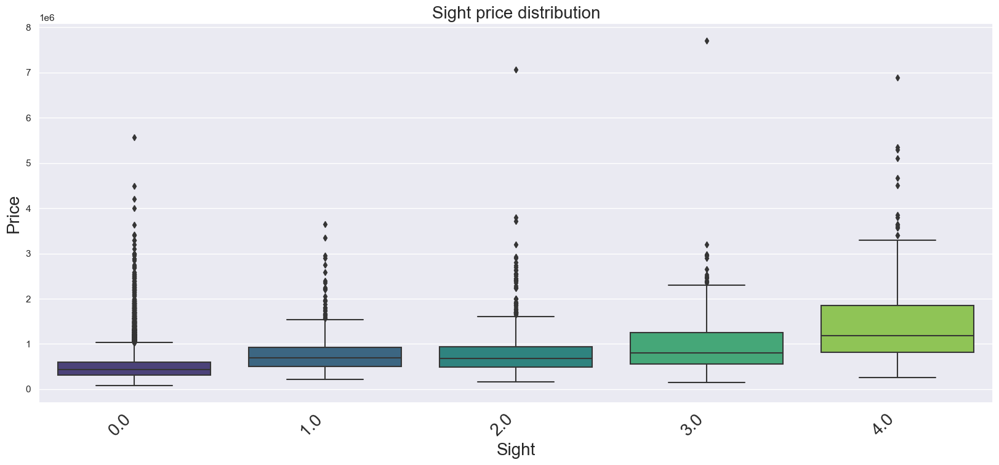

In [816]:
## Let's check if  number of  views has any price impact

plt.figure(figsize=(20,8))

chart=sns.boxplot(x="sight", y="price", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=20)
plt.title('Sight price distribution', fontsize=20)
plt.xlabel('Sight', fontsize=20)  # Adjust the font size as needed
plt.ylabel('Price', fontsize=20)  # Adjust the font size as needed
plt.show()
chart;

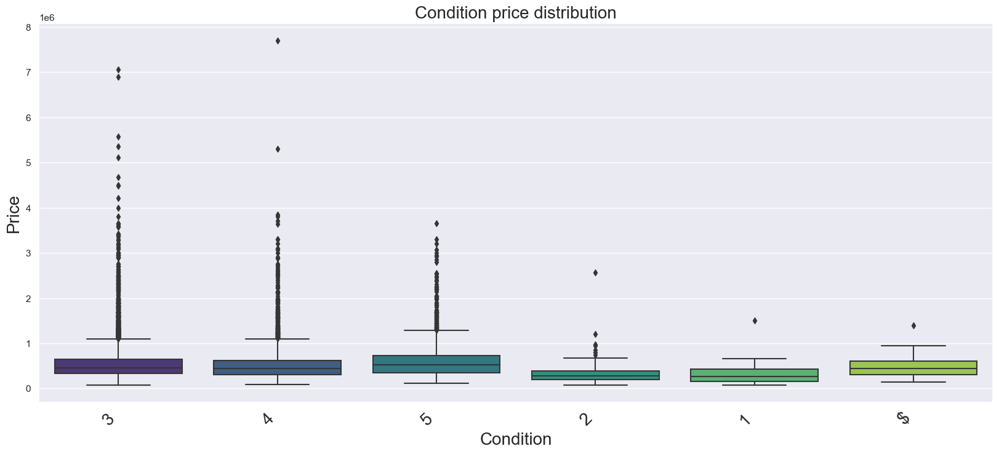

In [817]:
## Let's check if  condition has any price impact

plt.figure(figsize=(20,8))

chart=sns.boxplot(x="condition", y="price", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=20)
plt.title('Condition price distribution', fontsize=20)
plt.xlabel('Condition', fontsize=20)  # Adjust the font size as needed
plt.ylabel('Price', fontsize=20)  # Adjust the font size as needed
plt.show()
chart;

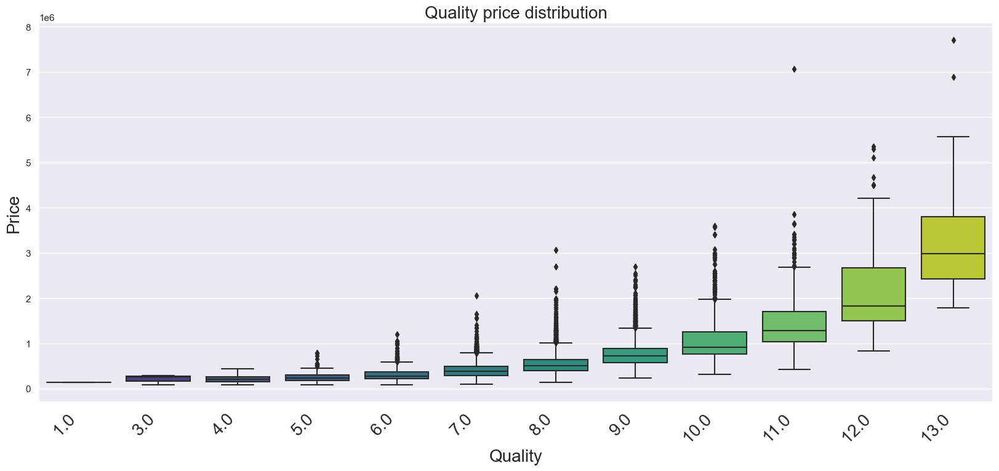

In [818]:
## Let's check if  quality has any price impact

plt.figure(figsize=(20,8))

chart=sns.boxplot(x="quality", y="price", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=20)
plt.title('Quality price distribution', fontsize=20)
plt.xlabel('Quality', fontsize=20)  # Adjust the font size as needed
plt.ylabel('Price', fontsize=20)  # Adjust the font size as needed
plt.show()
chart;

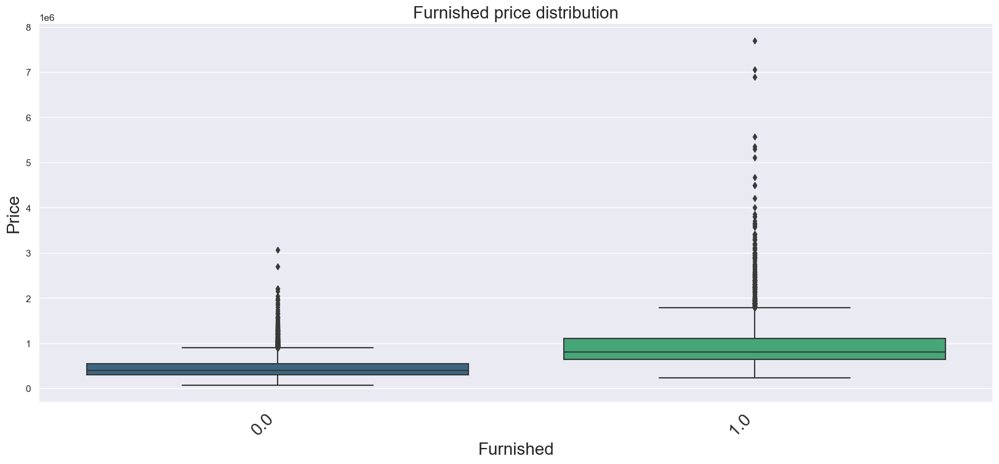

In [819]:
## Let's check if  furnished has any price impact

plt.figure(figsize=(20,8))

chart=sns.boxplot(x="furnished", y="price", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=20)
plt.title('Furnished price distribution', fontsize=20)
plt.xlabel('Furnished', fontsize=20)  # Adjust the font size as needed
plt.ylabel('Price', fontsize=20)  # Adjust the font size as needed
plt.show()
chart;

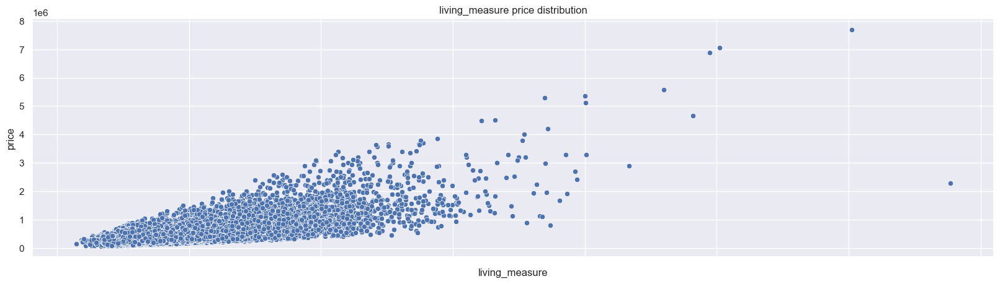

In [820]:
## Let's check if  living measure has any price impact

plt.figure(figsize=(20,5))

chart=sns.scatterplot(x="living_measure", y="price", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=18)
plt.title('living_measure price distribution')
chart;

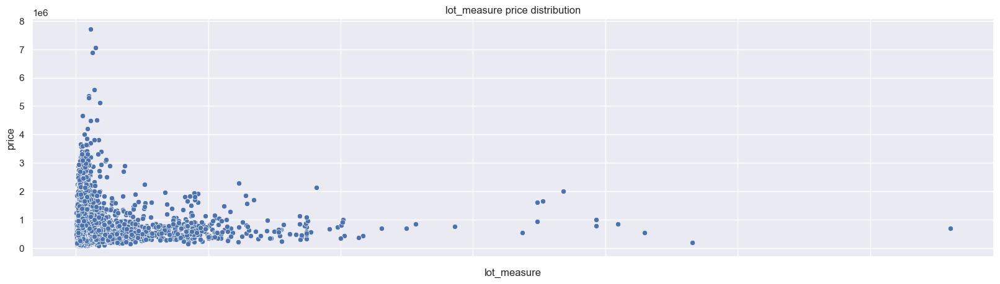

In [821]:
## Let's check if  Lot measure has any price impact

plt.figure(figsize=(20,5))

chart=sns.scatterplot(x="lot_measure", y="price", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=18)
plt.title('lot_measure price distribution')
chart;
plt.show()

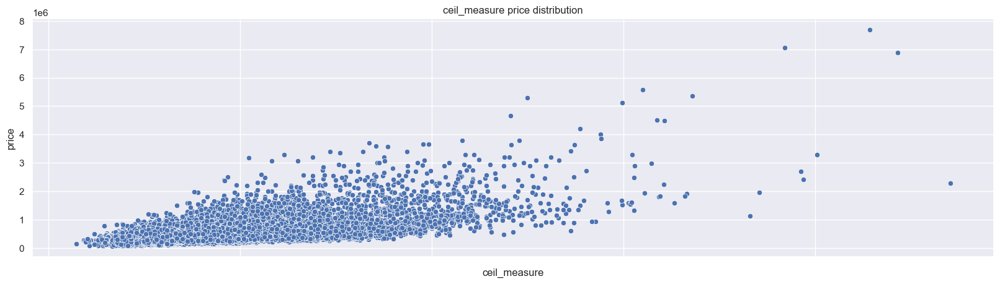

In [822]:
## Let's check if  ceil measure has any price impact

plt.figure(figsize=(20,5))

chart=sns.scatterplot(x="ceil_measure", y="price", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=18)
plt.title('ceil_measure price distribution')
chart;
plt.show()

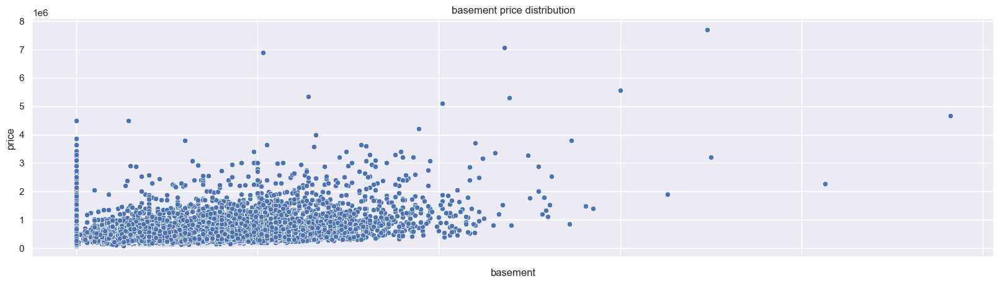

In [823]:
## Let's check if  basement measure measure has any price impact

plt.figure(figsize=(20,5))

chart=sns.scatterplot(x="basement", y="price", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=18)
plt.title('basement price distribution')
chart;
plt.show()

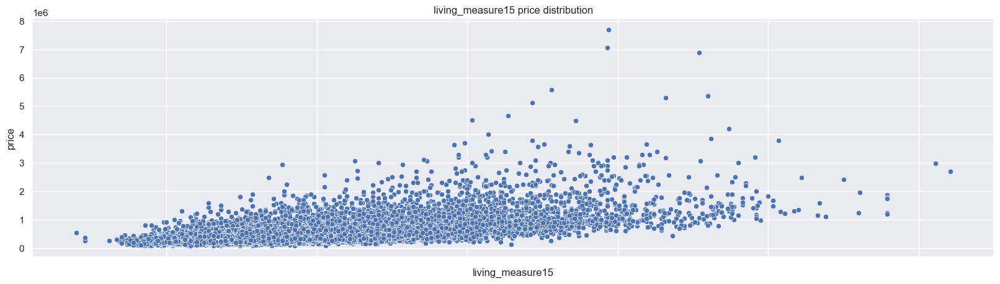

In [824]:
## Let's check if  living measure15 measure has any price impact

plt.figure(figsize=(20,5))

chart=sns.scatterplot(x="living_measure15", y="price", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=18)
plt.title('living_measure15 price distribution')
chart;
plt.show()

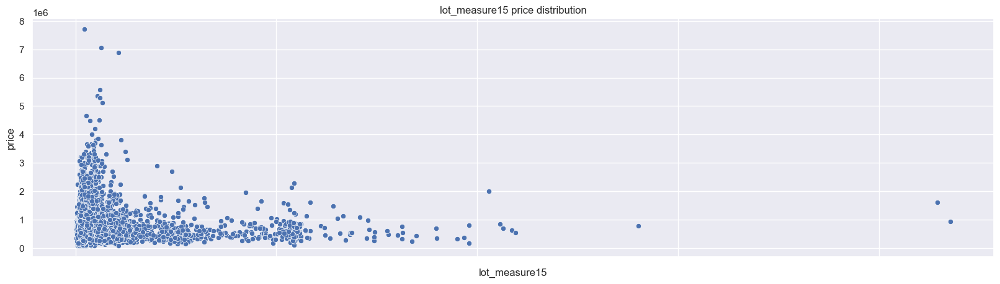

In [825]:
## Let's check if  lot measure15 measure has any price impact

plt.figure(figsize=(20,5))

chart=sns.scatterplot(x="lot_measure15", y="price", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=18)
plt.title('lot_measure15 price distribution')
chart;
plt.show()

## Imputing Missing Values and Junk in Total_area, Living measure, Lot measure,living measure 15  and Lot measure 15

In [826]:
##imputing Total area missing values 
df["total_area"] = df["total_area"].replace("$", "") # Remove dollar sign
df['total_area'] = df['total_area'].replace('', pd.NA).fillna(df['living_measure']+ df['lot_measure'])## Imputing mising values
df["total_area"] = df["total_area"].astype('float') # converting to numeric

In [827]:
df['total_area'].describe()

count     21613.00
mean      17186.87
std       41589.08
min        1423.00
25%        7035.00
50%        9575.00
75%       13000.00
max     1652659.00
Name: total_area, dtype: float64

In [828]:
#Let's look at the distribution of total area  measure at different percentiles
print(" 5% of the properties have a Total Area lower than {0: .2f} sqft".format(np.percentile(df["total_area"], 5)))
print("25% of the properties have a Total Area lower than {0: .2f} sqft".format(np.percentile(df["total_area"], 25)))
print("50% of the properties have a Total Area lower than {0: .2f} sqft".format(np.percentile(df["total_area"], 50)))
print("75% of the properties have a Total Area lower than {0: .2f} sqft".format(np.percentile(df["total_area"], 75)))
print("90% of the properties have a Total Area lower than {0: .2f} sqft".format(np.percentile(df["total_area"], 90)))
print("95% of the properties have a Total Area lower than {0: .2f} sqft".format(np.percentile(df["total_area"], 95)))
print("99% of the properties have a Total Area lower than {0: .2f} sqft".format(np.percentile(df["total_area"], 99)))

 5% of the properties have a Total Area lower than  3302.20 sqft
25% of the properties have a Total Area lower than  7035.00 sqft
50% of the properties have a Total Area lower than  9575.00 sqft
75% of the properties have a Total Area lower than  13000.00 sqft
90% of the properties have a Total Area lower than  24088.80 sqft
95% of the properties have a Total Area lower than  45885.80 sqft
99% of the properties have a Total Area lower than  214921.44 sqft


In [829]:
##imputing living measure missing values 
df['living_measure']=df['living_measure'].fillna(df["total_area"]-df["lot_measure"])

In [830]:
df['living_measure'].describe()

count   21613.00
mean     2079.90
std       918.44
min       290.00
25%      1427.00
50%      1910.00
75%      2550.00
max     13540.00
Name: living_measure, dtype: float64

In [831]:
#Let's look at the distribution of living measure at different percentiles
print(" 5% of the properties have a living measure lower than {0: .2f} sqft".format(np.percentile(df["living_measure"], 5)))
print("25% of the properties have a living measure lower than {0: .2f} sqft".format(np.percentile(df["living_measure"], 25)))
print("50% of the properties have a living measure lower than {0: .2f} sqft".format(np.percentile(df["living_measure"], 50)))
print("75% of the properties have a living measure lower than {0: .2f} sqft".format(np.percentile(df["living_measure"], 75)))
print("90% of the properties have a living measure lower than {0: .2f} sqft".format(np.percentile(df["living_measure"], 90)))
print("95% of the properties have a living measure lower than {0: .2f} sqft".format(np.percentile(df["living_measure"], 95)))
print("99% of the properties have a living measure lower than {0: .2f} sqft".format(np.percentile(df["living_measure"], 99)))

 5% of the properties have a living measure lower than  940.00 sqft
25% of the properties have a living measure lower than  1427.00 sqft
50% of the properties have a living measure lower than  1910.00 sqft
75% of the properties have a living measure lower than  2550.00 sqft
90% of the properties have a living measure lower than  3250.00 sqft
95% of the properties have a living measure lower than  3760.00 sqft
99% of the properties have a living measure lower than  4978.80 sqft


In [832]:
##imputing lot measure missing values 
df['lot_measure']=df['lot_measure'].fillna(df["total_area"]-df["living_measure"])

In [833]:
df['lot_measure'].describe()

count     21613.00
mean      15106.97
std       41420.51
min         520.00
25%        5040.00
50%        7618.00
75%       10688.00
max     1651359.00
Name: lot_measure, dtype: float64

In [834]:
#Let's look at the distribution of lot measure at different percentiles
print(" 5% of the properties have a lot measure lower than {0: .2f} sqft" .format(np.percentile(df["lot_measure"], 5)))
print("25% of the properties have a lot measure lower than {0: .2f} sqft".format(np.percentile(df["lot_measure"], 25)))
print("50% of the properties have a lot measure lower than {0: .2f} sqft".format(np.percentile(df["lot_measure"], 50)))
print("75% of the properties have a lot measure lower than {0: .2f} sqft".format(np.percentile(df["lot_measure"], 75)))
print("90% of the properties have a lot measure lower than {0: .2f} sqft".format(np.percentile(df["lot_measure"], 90)))
print("95% of the properties have a lot measure lower than {0: .2f} sqft".format(np.percentile(df["lot_measure"], 95)))
print("99% of the properties have a lot measure lower than {0: .2f} sqft".format(np.percentile(df["lot_measure"], 99)))

 5% of the properties have a lot measure lower than  1800.00 sqft
25% of the properties have a lot measure lower than  5040.00 sqft
50% of the properties have a lot measure lower than  7618.00 sqft
75% of the properties have a lot measure lower than  10688.00 sqft
90% of the properties have a lot measure lower than  21397.60 sqft
95% of the properties have a lot measure lower than  43339.20 sqft
99% of the properties have a lot measure lower than  213008.00 sqft


In [835]:
##imputing living  measure 15 missing values 
df['living_measure15'] = df['living_measure15'].fillna(df['living_measure'])


In [836]:
##imputing lot measure 15  missing values 
df['lot_measure15'] = df['lot_measure15'].fillna(df['lot_measure'])


In [837]:
cols=["ceil","coast","condition","yr_built","long"]
df[cols] = df[cols].replace("$", np.nan) # Remove dollar sign


In [838]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cid               21613 non-null  int64  
 1   dayhours          21613 non-null  object 
 2   price             21613 non-null  int64  
 3   room_bed          21505 non-null  float64
 4   room_bath         21505 non-null  float64
 5   living_measure    21613 non-null  float64
 6   lot_measure       21613 non-null  float64
 7   ceil              21541 non-null  float64
 8   coast             21582 non-null  float64
 9   sight             21556 non-null  float64
 10  condition         21528 non-null  float64
 11  quality           21612 non-null  float64
 12  ceil_measure      21612 non-null  float64
 13  basement          21612 non-null  float64
 14  yr_built          21598 non-null  float64
 15  yr_renovated      21613 non-null  int64  
 16  zipcode           21613 non-null  int64 

## Converting Datatype of variables 

In [839]:
cols1=["coast","condition",'sight','quality','furnished']
df[cols1] = df[cols1].astype('category') #  converting to category

## Data Summary after Imputing Missing Values 

In [840]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
cid,21613.00,4580301520.86,2876565571.31,1000102.00,2123049194.00,3904930410.00,7308900445.00,9900000190.00
price,21613.00,540182.16,367362.23,75000.00,321950.00,450000.00,645000.00,7700000.00
room_bed,21505.00,3.37,0.93,0.00,3.00,3.00,4.00,33.00
room_bath,21505.00,2.12,0.77,0.00,1.75,2.25,2.50,8.00
living_measure,21613.00,2079.90,918.44,290.00,1427.00,1910.00,2550.00,13540.00
lot_measure,21613.00,15106.97,41420.51,520.00,5040.00,7618.00,10688.00,1651359.00
ceil,21541.00,1.49,0.54,1.00,1.00,1.50,2.00,3.50
ceil_measure,21612.00,1788.37,828.10,290.00,1190.00,1560.00,2210.00,9410.00
basement,21612.00,291.52,442.58,0.00,0.00,0.00,560.00,4820.00
yr_built,21598.00,1971.01,29.37,1900.00,1951.00,1975.00,1997.00,2015.00


In [841]:
df.select_dtypes(include=['category']).describe().T

,count,unique,top,freq
coast,21582.00,2.00,0.00,21421.00
sight,21556.00,5.00,0.00,19437.00
condition,21528.00,5.00,3.00,13978.00
quality,21612.00,12.00,7.00,8981.00
furnished,21584.00,2.00,0.00,17338.00


## Creating New Variables 

In [842]:

df['Yr_sold'] = [x[:4] for x in df['dayhours']]

In [843]:
df['Yr_sold']=df['Yr_sold'].astype('int')

In [844]:
display(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   cid               21613 non-null  int64   
 1   dayhours          21613 non-null  object  
 2   price             21613 non-null  int64   
 3   room_bed          21505 non-null  float64 
 4   room_bath         21505 non-null  float64 
 5   living_measure    21613 non-null  float64 
 6   lot_measure       21613 non-null  float64 
 7   ceil              21541 non-null  float64 
 8   coast             21582 non-null  category
 9   sight             21556 non-null  category
 10  condition         21528 non-null  category
 11  quality           21612 non-null  category
 12  ceil_measure      21612 non-null  float64 
 13  basement          21612 non-null  float64 
 14  yr_built          21598 non-null  float64 
 15  yr_renovated      21613 non-null  int64   
 16  zipcode           2161

None

In [845]:
df.isnull().sum()[df.isnull().sum()>0]

room_bed        108
room_bath       108
ceil             72
coast            31
sight            57
condition        85
quality           1
ceil_measure      1
basement          1
yr_built         15
long             34
furnished        29
dtype: int64

## Dropping CID and Dayhours

In [846]:
df.drop(['cid','dayhours'],axis=1,inplace=True)

## Adding new columns state_name, city, county_name, latitude and logitude from US zip codes and combining two dataframes based on Zipcode

## Dropping zipcode, latitude, longitude, state name because we have derived the city name. We have dropped State name because its same for all records . These records are of Washington state 

## Univariate Analaysis after correcting the dataypes of variables and with new variables 

In [847]:
df_num=[]
df_cat=[]
df_oth=[]
for i in df.columns:
    if df[i].dtype=='category':
        df_cat.append(i)
    elif df[i].dtype=='object':
        df_cat.append(i)
    elif df[i].dtype=='int64':
        df_num.append(i)
    elif df[i].dtype=='float64':
        df_num.append(i)
    elif df[i].dtype=='int32':
        df_num.append(i)
    else:
        df_oth.append(i)
        
print(df_num)
print(df_cat)

['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure', 'ceil', 'ceil_measure', 'basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'living_measure15', 'lot_measure15', 'total_area', 'Yr_sold']
['coast', 'sight', 'condition', 'quality', 'furnished']


------""" Let's study Latitude and Longitue features 
n=1
for i in df_num:
    plt.figure(figsize=(25,15))
    plt.subplot(11,2,n)
    sns.distplot(df[i])
    plt.title("Distribution plot of " + i)
    plt.subplot(11,2,n+1)
    sns.boxplot(df[i])
    plt.title("Boxplot of " + i)
    n+=2
    

Distribution of price
Skewness  of price : 4.02
Kurtosis  of price : 34.514180829647714


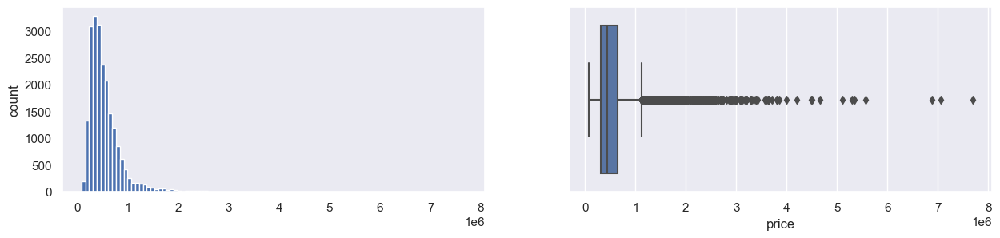

Distribution of room_bed
Skewness  of room_bed : 1.98
Kurtosis  of room_bed : nan


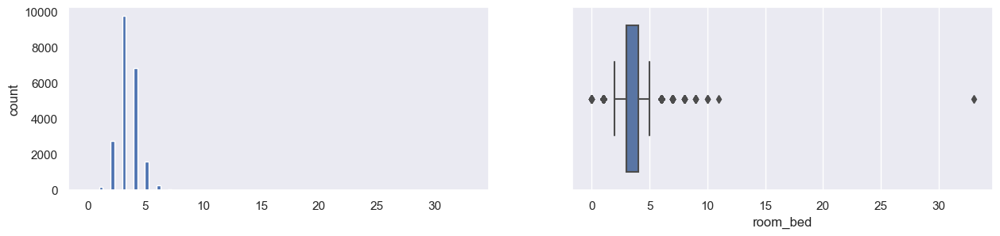

Distribution of room_bath
Skewness  of room_bath : 0.51
Kurtosis  of room_bath : nan


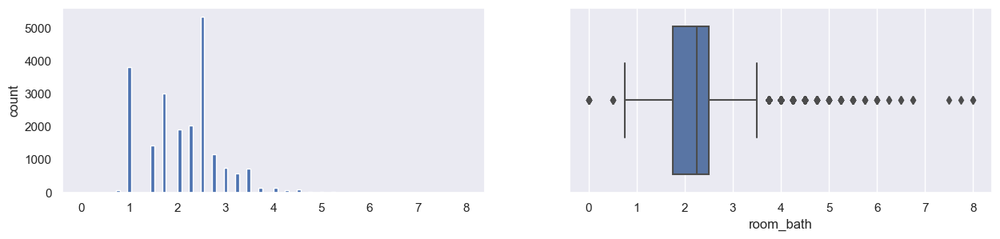

Distribution of living_measure
Skewness  of living_measure : 1.47
Kurtosis  of living_measure : 5.241602521613764


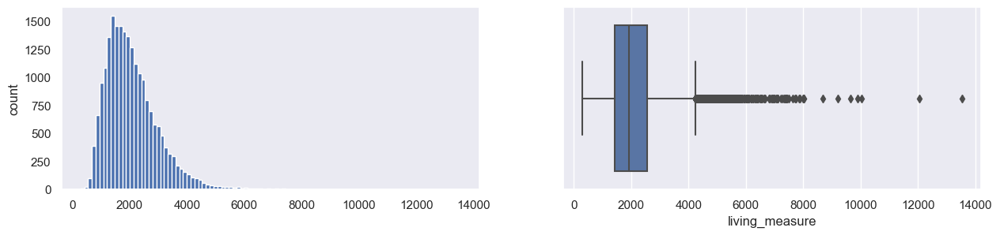

Distribution of lot_measure
Skewness  of lot_measure : 13.06
Kurtosis  of lot_measure : 285.01159582778826


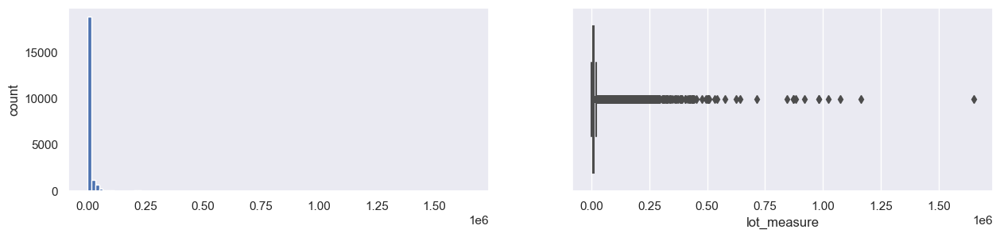

Distribution of ceil
Skewness  of ceil : 0.62
Kurtosis  of ceil : nan


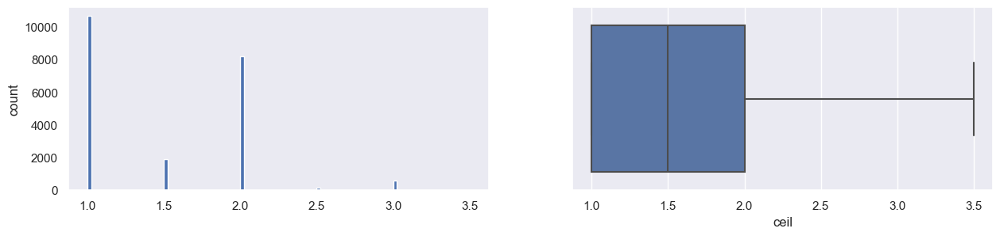

Distribution of ceil_measure
Skewness  of ceil_measure : 1.45
Kurtosis  of ceil_measure : nan


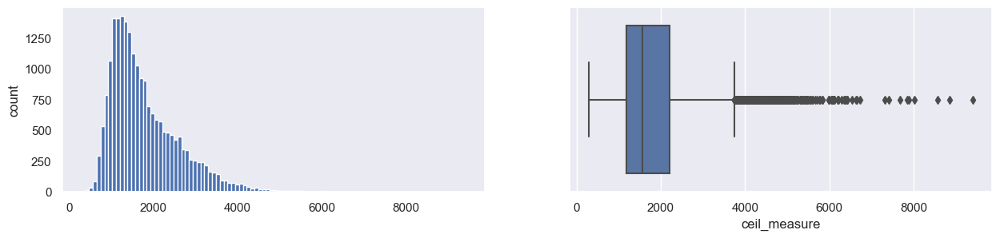

Distribution of basement
Skewness  of basement : 1.58
Kurtosis  of basement : nan


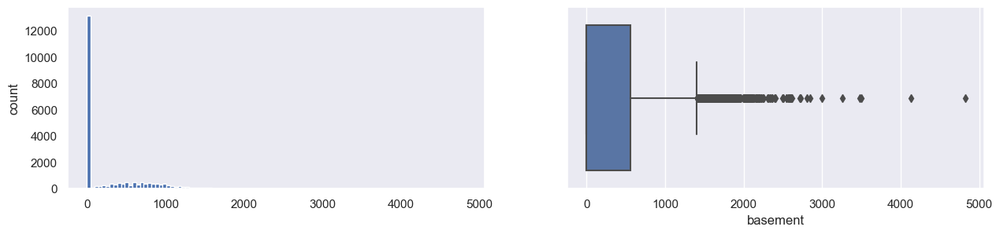

Distribution of yr_built
Skewness  of yr_built : -0.47
Kurtosis  of yr_built : nan


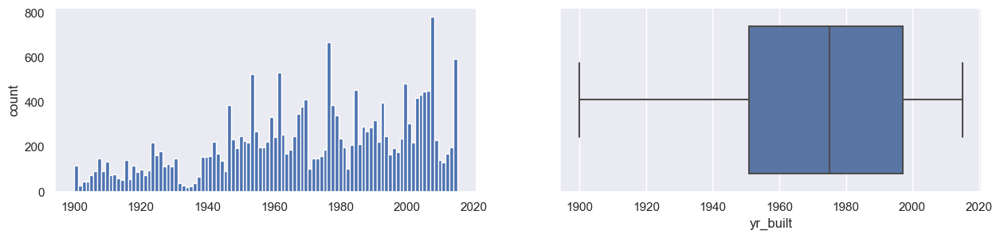

Distribution of yr_renovated
Skewness  of yr_renovated : 4.55
Kurtosis  of yr_renovated : 18.69654843341467


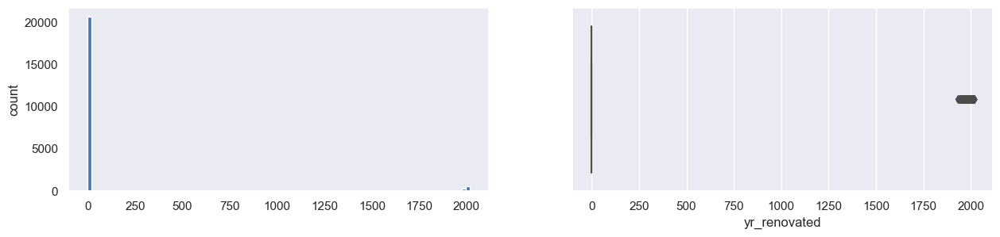

Distribution of zipcode
Skewness  of zipcode : 0.41
Kurtosis  of zipcode : -0.8535590381317446


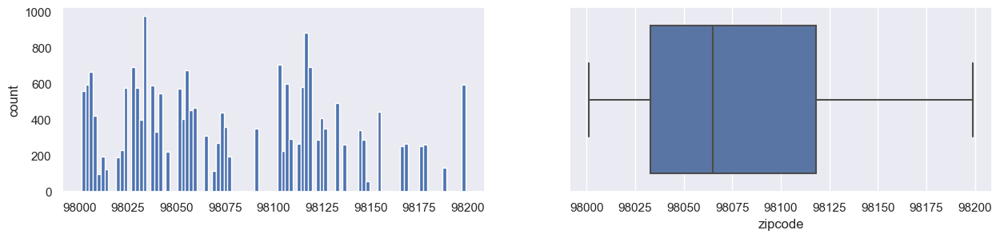

Distribution of lat
Skewness  of lat : -0.49
Kurtosis  of lat : -0.6764341498242992


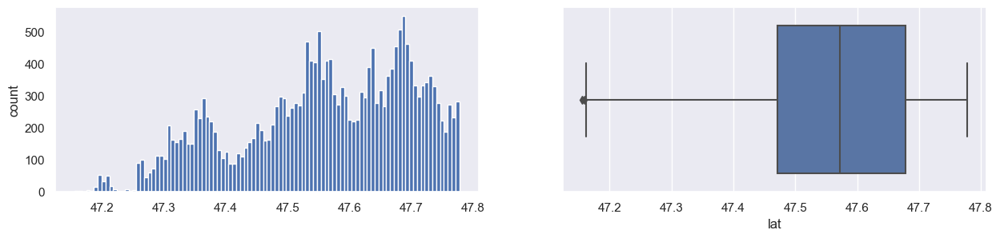

Distribution of long
Skewness  of long : 0.88
Kurtosis  of long : nan


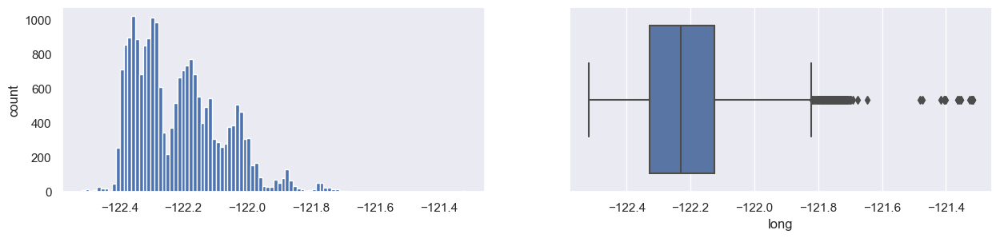

Distribution of living_measure15
Skewness  of living_measure15 : 1.11
Kurtosis  of living_measure15 : 1.6269989519724675


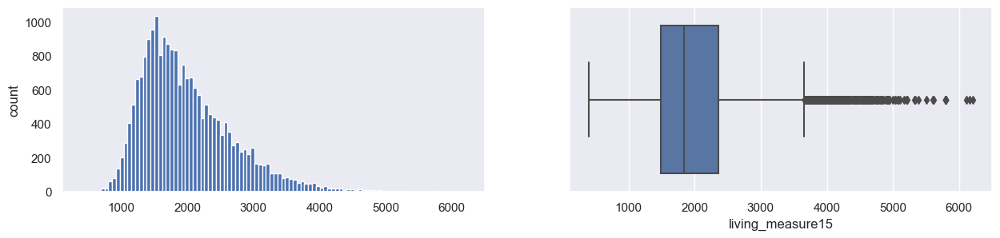

Distribution of lot_measure15
Skewness  of lot_measure15 : 9.51
Kurtosis  of lot_measure15 : 150.70274713492088


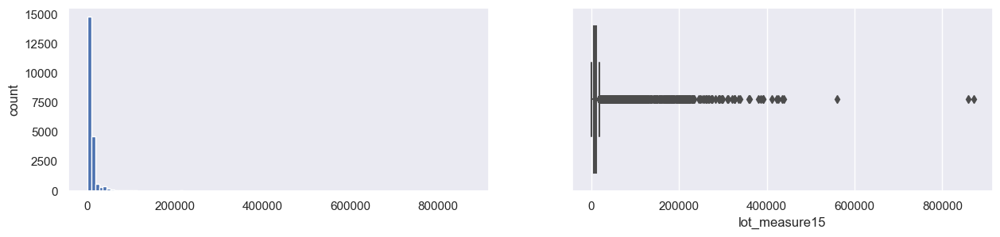

Distribution of total_area
Skewness  of total_area : 12.96
Kurtosis  of total_area : 281.1510003301337


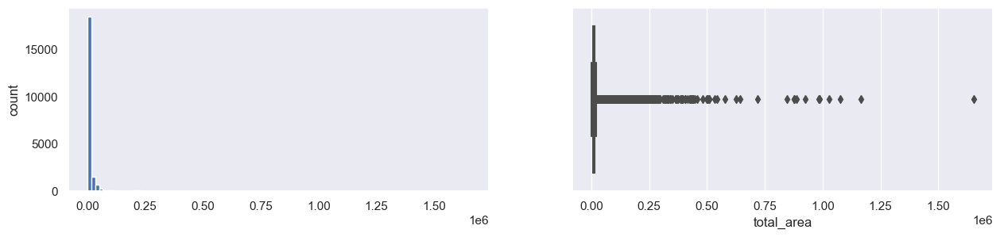

Distribution of Yr_sold
Skewness  of Yr_sold : 0.76
Kurtosis  of Yr_sold : -1.4265776299081805


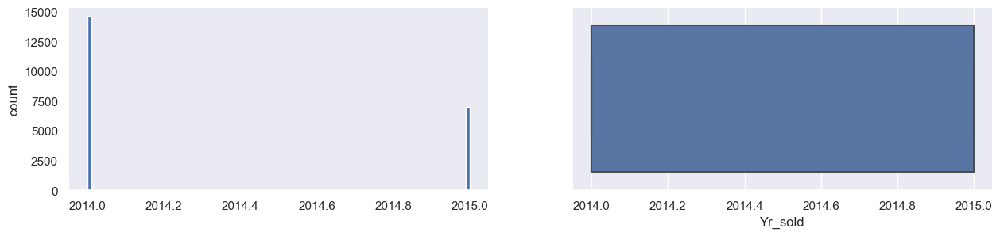

In [643]:
for col in df_num:
    print(f"Distribution of {col}")
    print(f"Skewness  of {col} : {round(df[col].skew(),2)}")
    print(f"Kurtosis  of {col} : {kurtosis(df[col], axis=0, bias=True)}")
    plt.figure(figsize=(15,3))
    plt.subplot(1,2,1)
    df[col].hist(bins=100, grid=False)
    plt.ylabel('count')
    plt.subplot(1,2,2)
    sns.boxplot(x=df[col])
    plt.show()


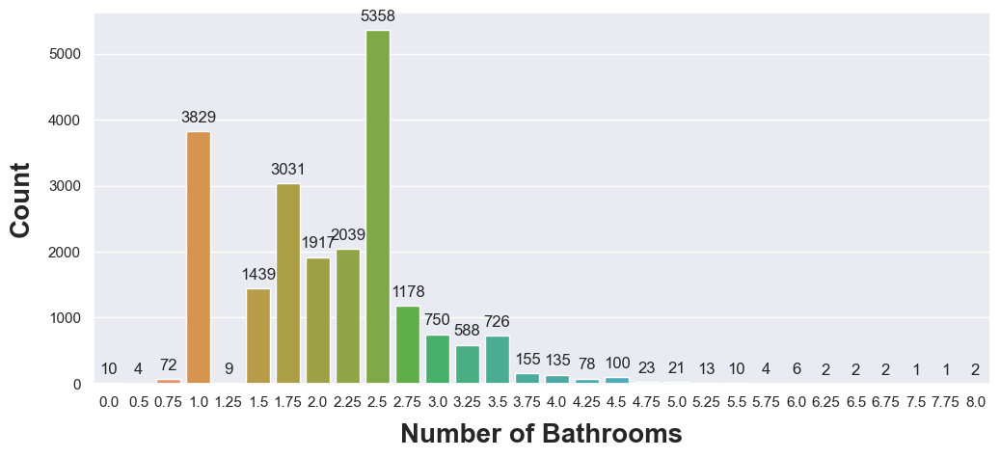

In [884]:
fig = plt.figure(1, figsize=(12,5))
ax = sns.countplot(x=df["room_bath"], data=df)
plt.xlabel('Number of Bathrooms', fontsize=20, weight = 'bold', labelpad=10)
plt.ylabel('Count', fontsize=20, weight = 'bold', labelpad=10)
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')
plt.show()

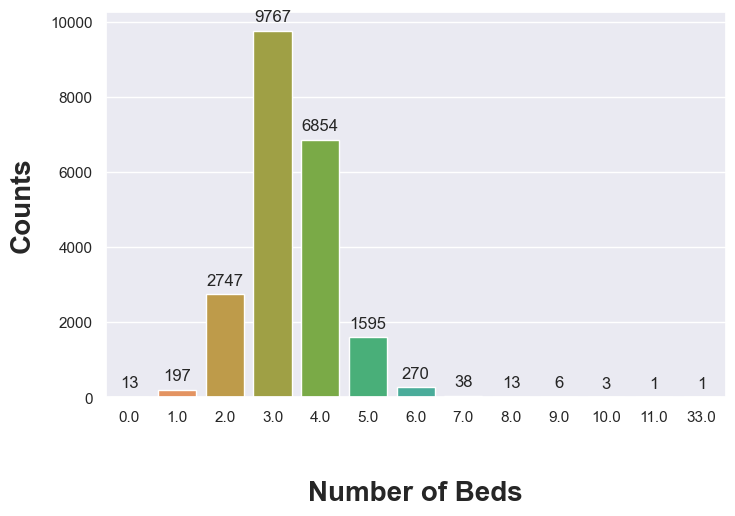

In [882]:
fig = plt.figure(1, figsize=(8,5))
ax = sns.countplot(x=df["room_bed"], data=df)
plt.xlabel('Number of Beds', fontsize=20, weight = 'bold', labelpad=40)
plt.ylabel('Counts', fontsize=20, weight = 'bold', labelpad=10)
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')
plt.show()

coast


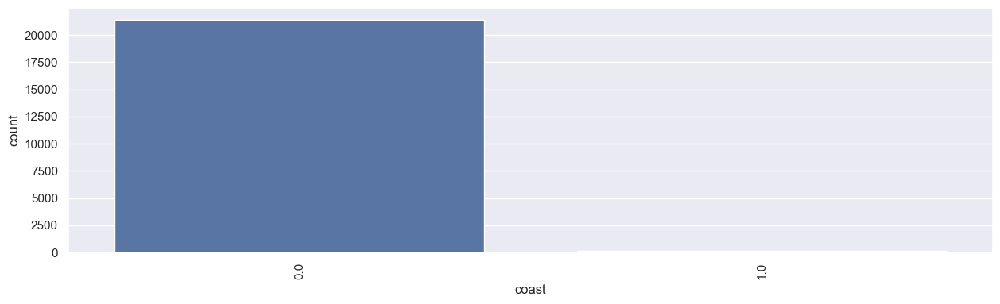

sight


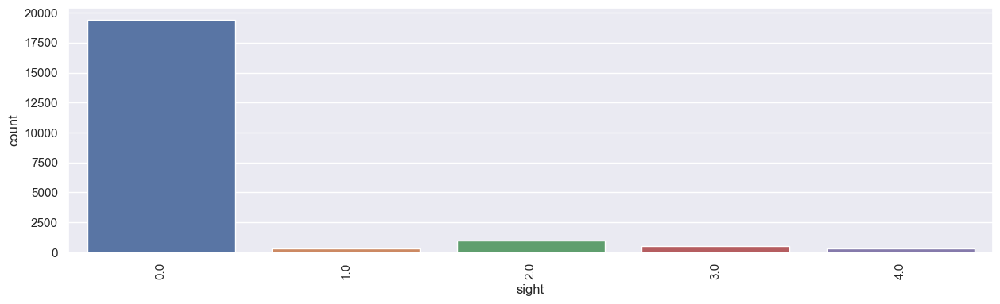

condition


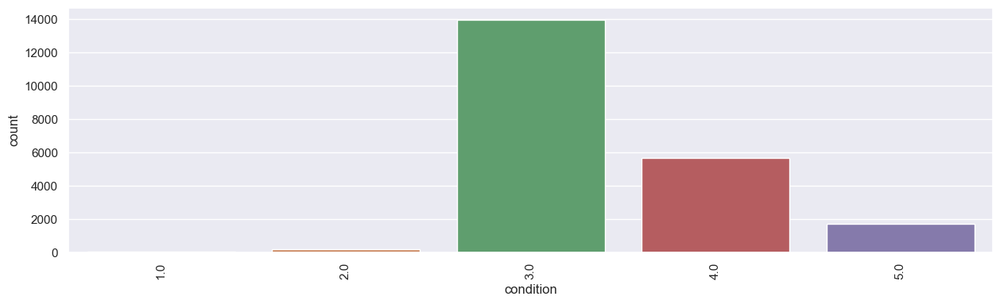

quality


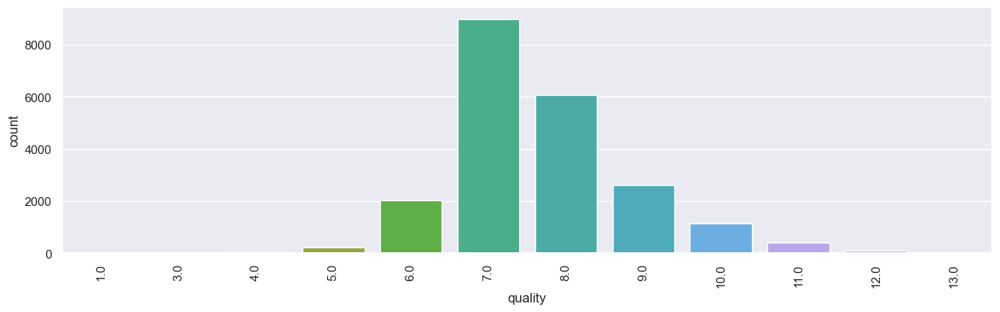

furnished


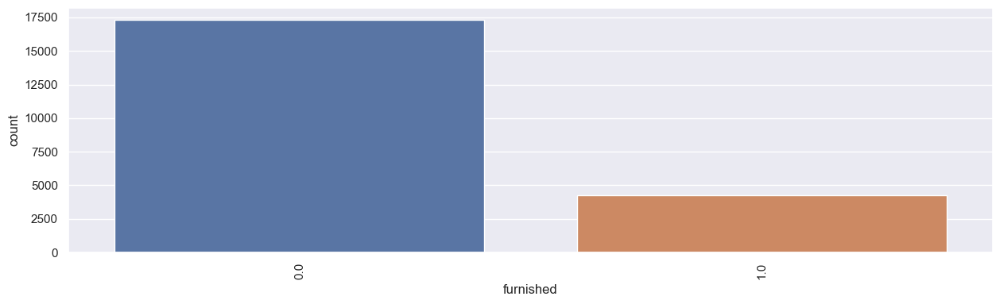

In [646]:
for col in df_cat:
    print(col)
    plt.figure(figsize=(15,4))
    plt.ylabel('count')
    sns.countplot(x=df[col])
    plt.xticks(rotation=90)
    plt.show()


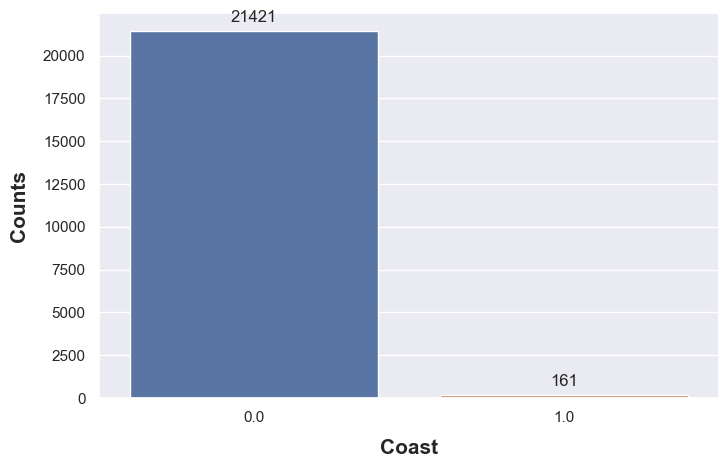

In [647]:
fig = plt.figure(1, figsize=(8,5))
ax = sns.countplot(x=df["coast"], data=df)
plt.xlabel('Coast', fontsize=15, weight = 'bold', labelpad=10)
plt.ylabel('Counts', fontsize=15, weight = 'bold', labelpad=10)
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')
plt.show()

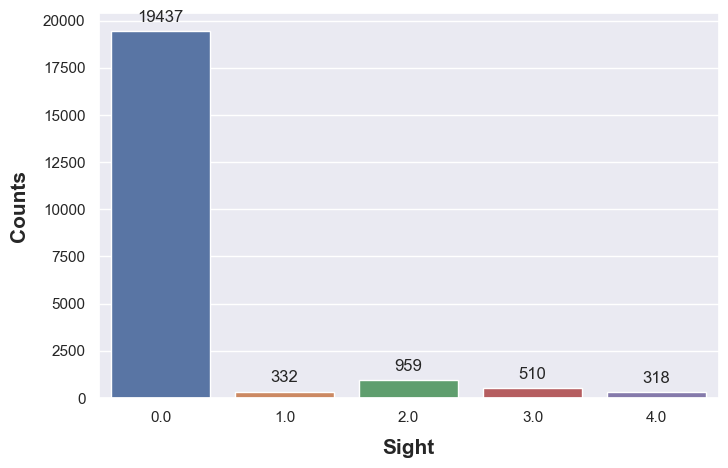

In [648]:
fig = plt.figure(1, figsize=(8,5))
ax = sns.countplot(x=df["sight"], data=df)
plt.xlabel('Sight', fontsize=15, weight = 'bold', labelpad=10)
plt.ylabel('Counts', fontsize=15, weight = 'bold', labelpad=10)
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')
plt.show()

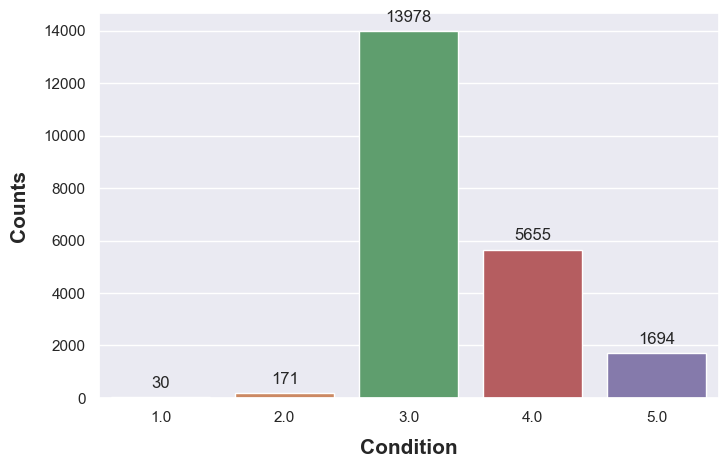

In [649]:
fig = plt.figure(1, figsize=(8,5))
ax = sns.countplot(x=df["condition"], data=df)
plt.xlabel('Condition', fontsize=15, weight = 'bold', labelpad=10)
plt.ylabel('Counts', fontsize=15, weight = 'bold', labelpad=10)
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')
plt.show()

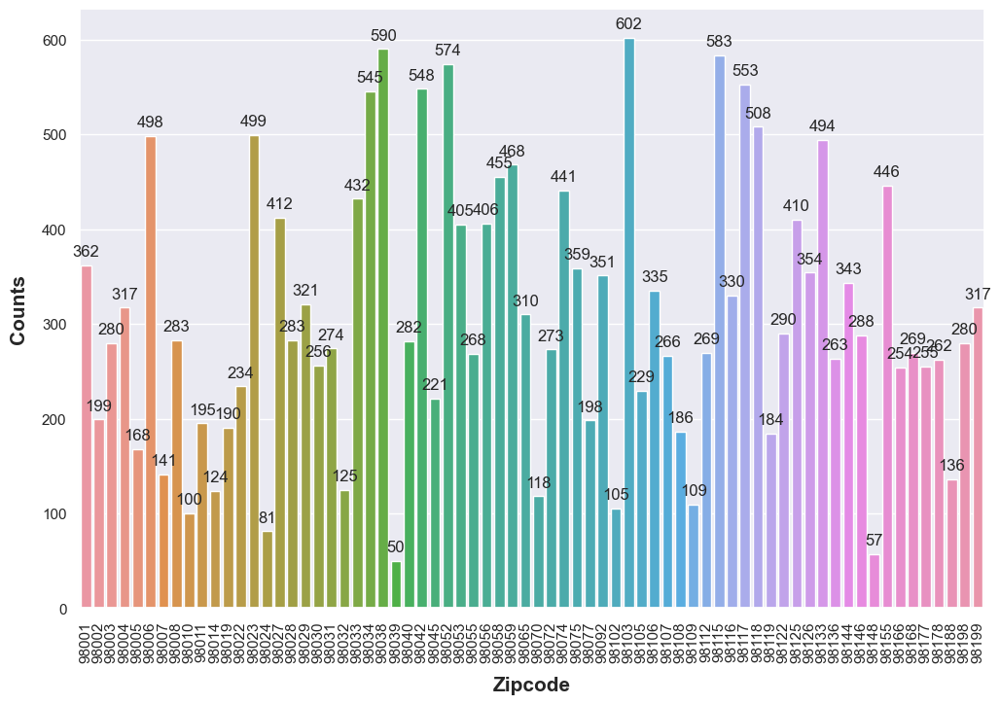

In [888]:
fig = plt.figure(1, figsize=(12,8))
ax = sns.countplot(x=df["zipcode"], data=df)
plt.xlabel('Zipcode', fontsize=15, weight = 'bold', labelpad=10)
plt.ylabel('Counts', fontsize=15, weight = 'bold', labelpad=10)
plt.xticks(rotation=90)
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')
plt.show()

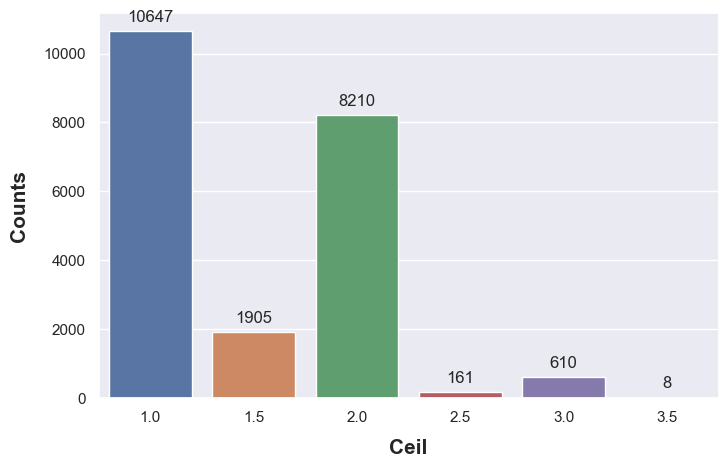

In [869]:
fig = plt.figure(1, figsize=(8,5))
ax = sns.countplot(x=df["ceil"], data=df)
plt.xlabel('Ceil', fontsize=15, weight = 'bold', labelpad=10)
plt.ylabel('Counts', fontsize=15, weight = 'bold', labelpad=10)
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')
plt.show()

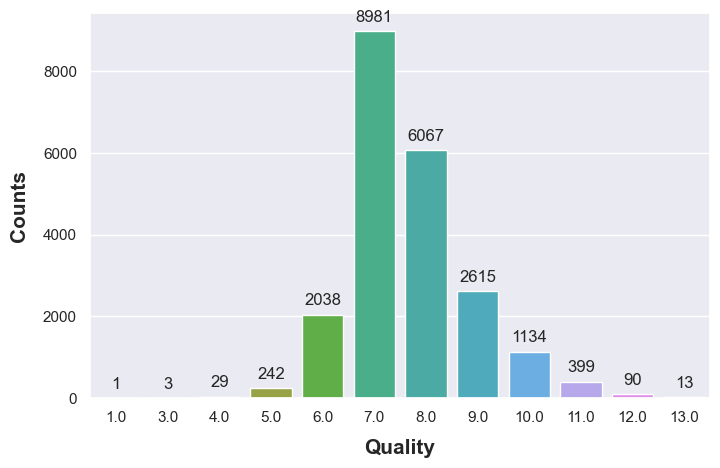

In [650]:
fig = plt.figure(1, figsize=(8,5))
ax = sns.countplot(x=df["quality"], data=df)
plt.xlabel('Quality', fontsize=15, weight = 'bold', labelpad=10)
plt.ylabel('Counts', fontsize=15, weight = 'bold', labelpad=10)
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')
plt.show()

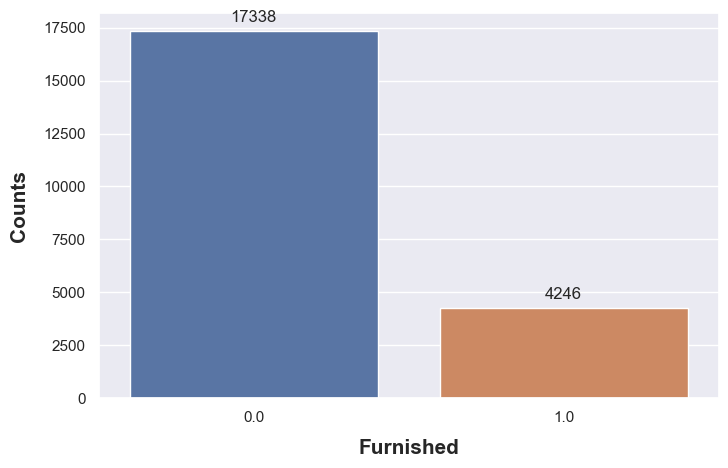

In [651]:
fig = plt.figure(1, figsize=(8,5))
ax = sns.countplot(x=df["furnished"], data=df)
plt.xlabel('Furnished', fontsize=15, weight = 'bold', labelpad=10)
plt.ylabel('Counts', fontsize=15, weight = 'bold', labelpad=10)
for p in ax.patches:
    ax.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 10), textcoords='offset points')
plt.show()

coast


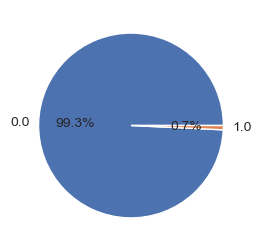

sight


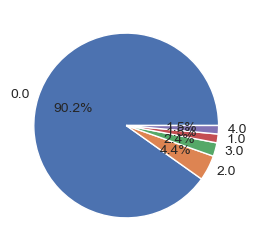

condition


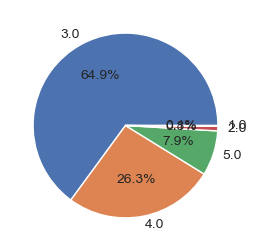

quality


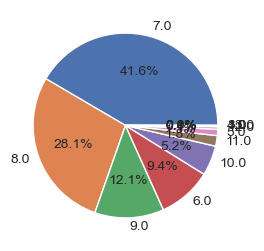

furnished


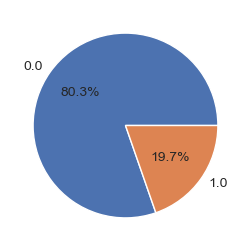

In [652]:
for col in df_cat:
    print(col)
    plt.figure(figsize=(8,3))
    labels = df[col].value_counts().keys()
    plt.pie(df[col].value_counts(), autopct="%.1f%%", labels=labels,textprops={'fontsize': 10})
    plt.xticks(rotation=90)
    plt.show()

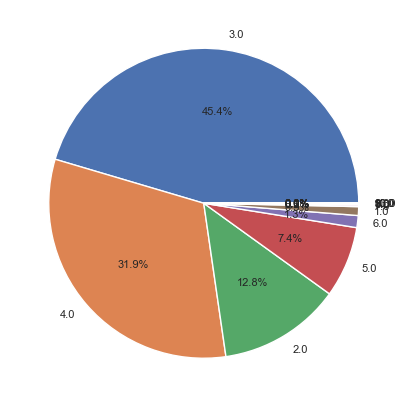

In [867]:
plt.figure(figsize=(5,10))
labels = df['room_bed'].value_counts().keys()
plt.pie(df['room_bed'].value_counts(), autopct="%.1f%%", labels=labels,textprops={'fontsize': 8})
plt.xticks(rotation=90)
plt.show()

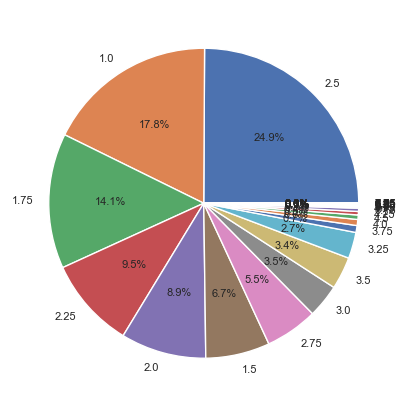

In [868]:
plt.figure(figsize=(5,10))
labels = df['room_bath'].value_counts().keys()
plt.pie(df['room_bath'].value_counts(), autopct="%.1f%%", labels=labels,textprops={'fontsize': 8})
plt.xticks(rotation=90)
plt.show()

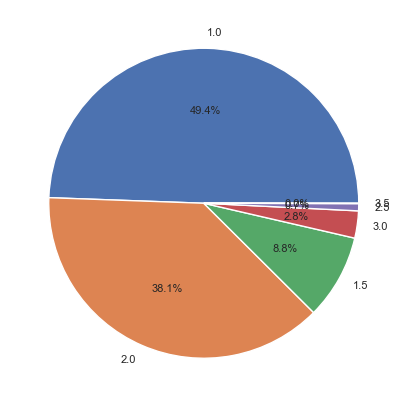

In [873]:
plt.figure(figsize=(5,10))
labels = df['ceil'].value_counts().keys()
plt.pie(df['ceil'].value_counts(), autopct="%.1f%%", labels=labels,textprops={'fontsize': 8})
plt.xticks(rotation=90)
plt.show()

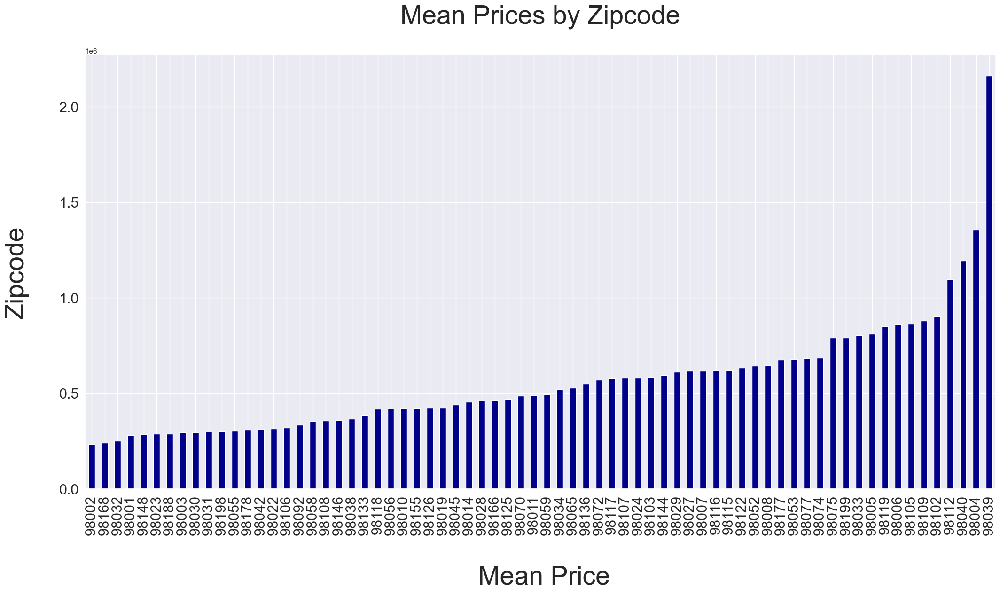

In [714]:
## Let's check the impact of cancellation policy on price

# group_by neighbourhood groups, take the median price and store new values in sub_df 
listings_grouped = pd.DataFrame(df.groupby(['zipcode'])['price'].agg(np.mean))
listings_grouped.reset_index(inplace=True)

# plot this 
listings_grouped.sort_values(by=['price'], ascending=True)\
          .plot(kind='bar', x='zipcode', y='price', 
                figsize=(25,12), legend=False, color='darkblue',fontsize=15)

plt.xlabel('\n Mean Price', fontsize=40)
plt.ylabel('Zipcode\n', fontsize=40)
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)
plt.title('Mean Prices by Zipcode\n', fontsize=40);
plt.show()

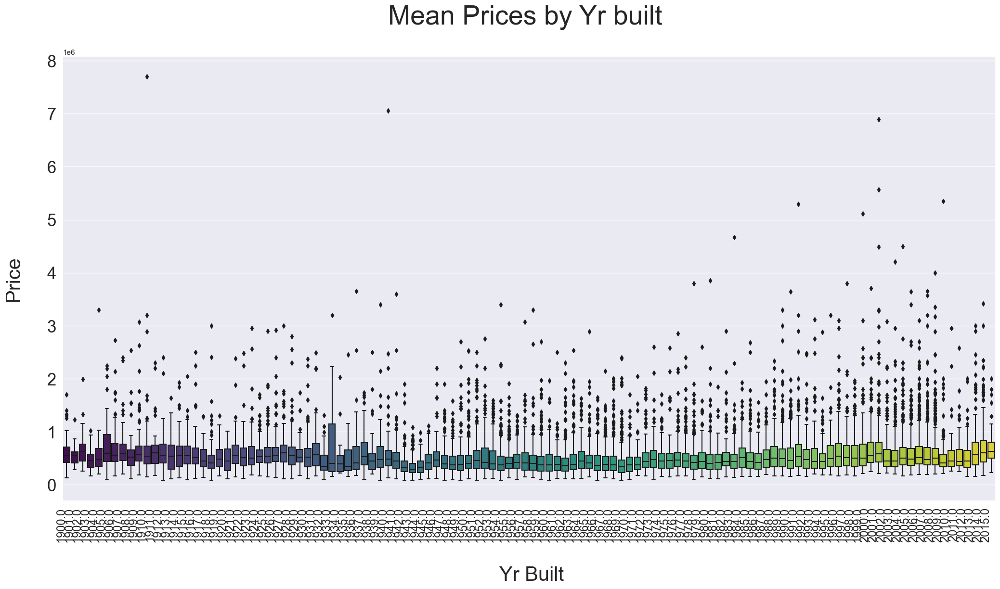

In [739]:
plt.figure(figsize=(25,12))

chart=sns.boxplot(x="yr_built", y="price", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=90, horizontalalignment='right', fontsize=10)
plt.title('Year Built price distribution')
chart;
plt.xlabel('\n Yr Built', fontsize=30)
plt.ylabel('Price\n', fontsize=30)
plt.xticks(fontsize=17)
plt.yticks(fontsize=25)
plt.title('Mean Prices by Yr built \n', fontsize=40);
plt.show()
plt.show()

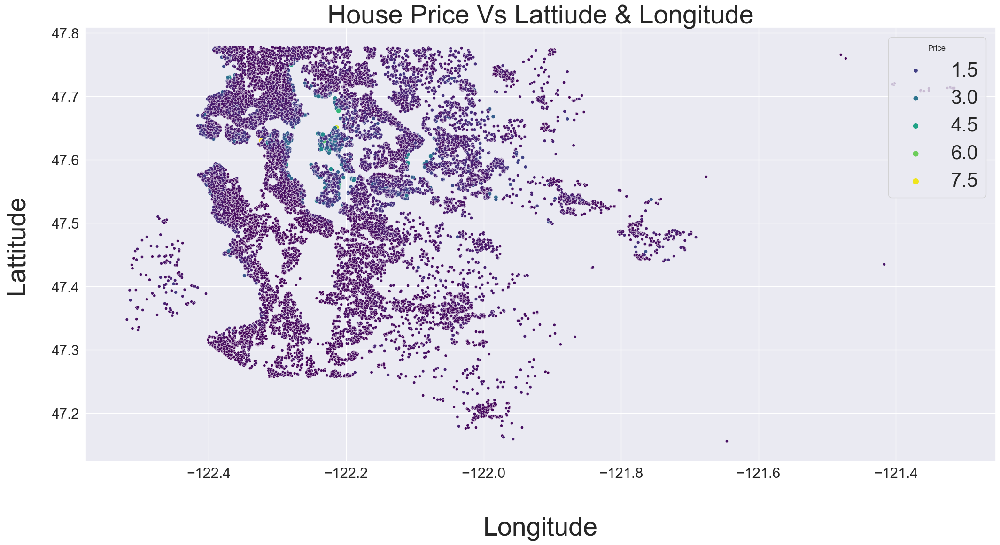

In [715]:
plt.figure(figsize=(25,12))
sns.scatterplot(data=df_long,x='long',y='lat',hue='price',size='price',palette='viridis')

plt.legend(title='Price',loc='upper right',fontsize=30)
plt.title("House Price Vs Lattiude & Longitude",fontsize=40)
plt.xlabel("Longitude",fontsize=40,labelpad=55)
plt.ylabel("Lattitude",fontsize=40,labelpad=35)
plt.xticks(fontsize=22)
plt.yticks(fontsize=22)
plt.show()


## Multivariate  Analysis 

In [656]:
## Correlation Map of Numerical ariables 

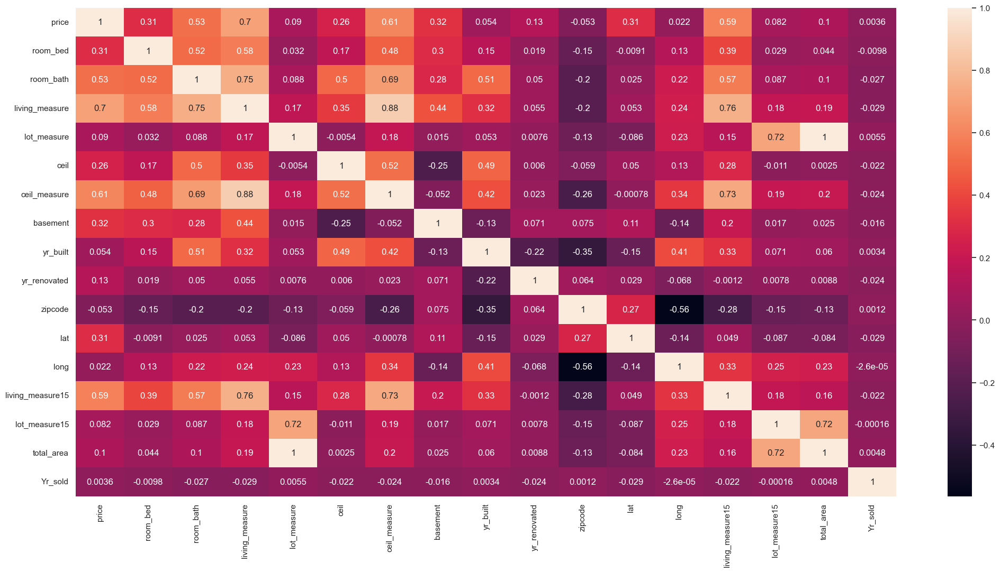

In [657]:
plt.figure(figsize=(25,12))
sns.heatmap(df.corr(),annot=True);
plt.show()

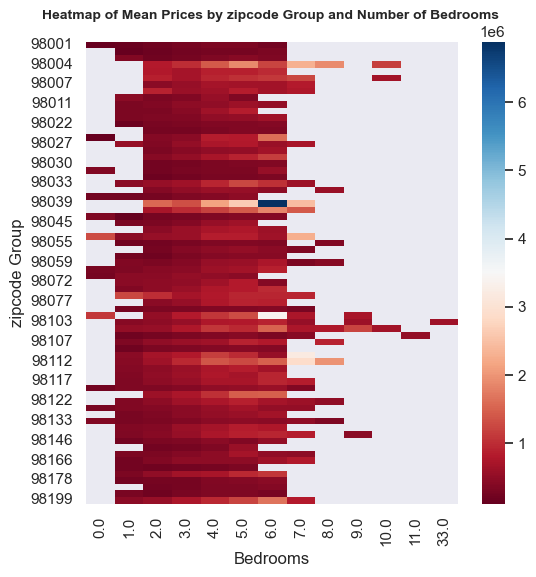

In [658]:
plt.figure(figsize=(6,6))
sns.heatmap(df.groupby(['zipcode', 'room_bed']).price.mean().unstack(), 
            cmap='RdBu', fmt=".0f")

plt.xlabel('Bedrooms')
plt.ylabel('zipcode Group')
plt.title('Heatmap of Mean Prices by zipcode Group and Number of Bedrooms \n', fontsize=10, fontweight='bold');
plt.show()

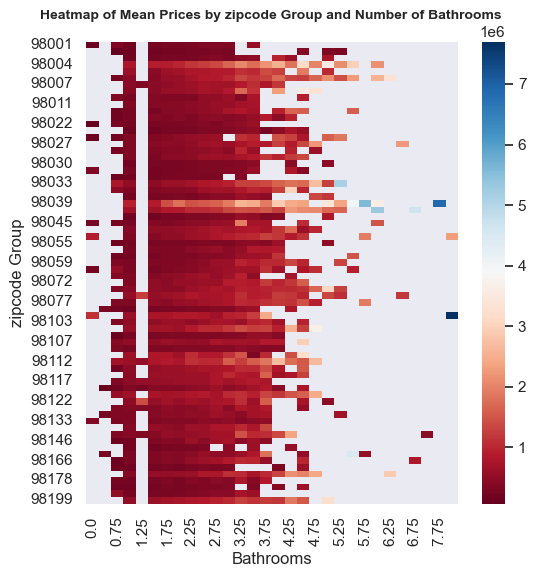

In [659]:
plt.figure(figsize=(6,6))
sns.heatmap(df.groupby(['zipcode', 'room_bath']).price.mean().unstack(), 
            cmap='RdBu', fmt=".0f")

plt.xlabel('Bathrooms')
plt.ylabel('zipcode Group')
plt.title('Heatmap of Mean Prices by zipcode Group and Number of Bathrooms \n', fontsize=10, fontweight='bold');
plt.show()

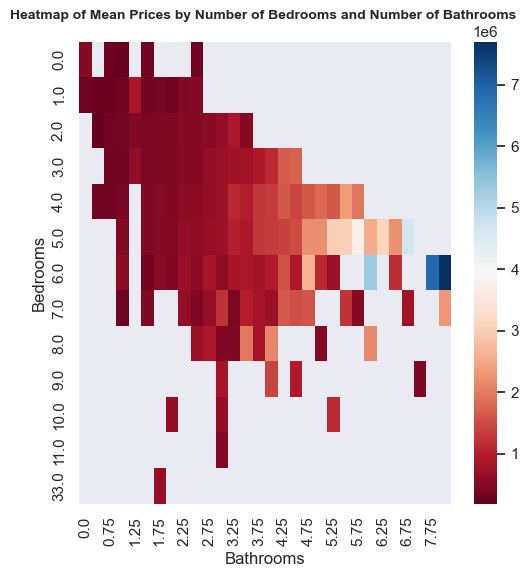

In [660]:
plt.figure(figsize=(6,6))
sns.heatmap(df.groupby(['room_bed', 'room_bath']).price.mean().unstack(), 
            cmap='RdBu', fmt=".0f")

plt.xlabel('Bathrooms')
plt.ylabel('Bedrooms')
plt.title('Heatmap of Mean Prices by Number of Bedrooms and Number of Bathrooms \n', fontsize=10, fontweight='bold');
plt.show()

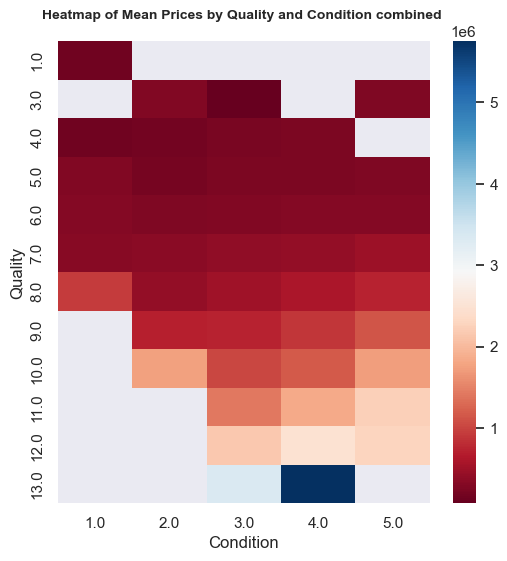

In [661]:
plt.figure(figsize=(6,6))
sns.heatmap(df.groupby(['quality', 'condition']).price.mean().unstack(), 
            cmap='RdBu', fmt=".0f")

plt.xlabel('Condition')
plt.ylabel('Quality')
plt.title('Heatmap of Mean Prices by Quality and Condition combined \n', fontsize=10, fontweight='bold');
plt.show()

## Variable Tranformation

In [662]:
#Getting the measure of how old is the house
df['years old']=int(0)
for index,row in df.iterrows():
    df.at[index,'years old']=row['Yr_sold']-row['yr_built']
    
df[['years old']].head()

,years old
0,49.00
1,67.00
2,48.00
3,5.00
4,91.00


In [663]:
#Getting the measure of is house is  renovated
df['is_renovated'] =int(0)
for index,row in df.iterrows():
    if row['yr_renovated']!=int(0):
        df.at[index,'is_renovated']=int(1)
    


In [664]:
df['basement_present'] = df['basement'].apply(lambda x: 1 if x > 0 else 0) # Indicate whether there is a basement or not

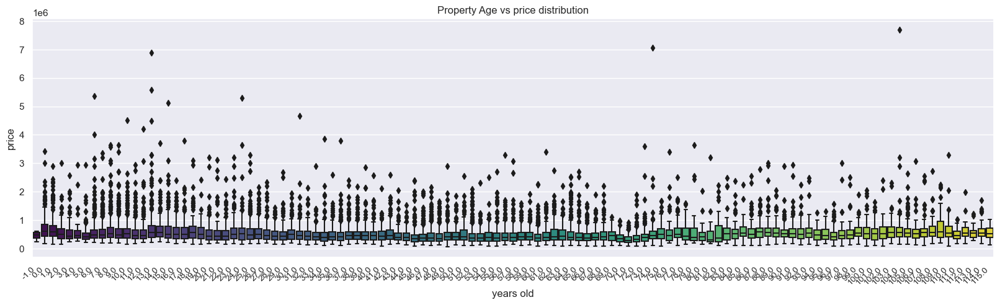

In [667]:

plt.figure(figsize=(20,5))

chart=sns.boxplot(x="years old", y="price", data=df, palette="viridis")
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=10)
plt.title('Property Age vs price distribution')
chart;
plt.show()

## Dropping Variables 

In [665]:
df.drop(['yr_renovated','total_area','yr_built','Yr_sold'],axis=1,inplace=True)

In [666]:
df.drop(['basement'],axis=1,inplace=True)

In [668]:
df.isna().sum()[df.isna().sum()>0]

room_bed        108
room_bath       108
ceil             72
coast            31
sight            57
condition        85
quality           1
ceil_measure      1
long             34
furnished        29
years old        15
dtype: int64

In [669]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   price             21613 non-null  int64   
 1   room_bed          21505 non-null  float64 
 2   room_bath         21505 non-null  float64 
 3   living_measure    21613 non-null  float64 
 4   lot_measure       21613 non-null  float64 
 5   ceil              21541 non-null  float64 
 6   coast             21582 non-null  category
 7   sight             21556 non-null  category
 8   condition         21528 non-null  category
 9   quality           21612 non-null  category
 10  ceil_measure      21612 non-null  float64 
 11  zipcode           21613 non-null  int64   
 12  lat               21613 non-null  float64 
 13  long              21579 non-null  float64 
 14  living_measure15  21613 non-null  float64 
 15  lot_measure15     21613 non-null  float64 
 16  furnished         2158

## Missing Value Imputation for categorical variables

In [670]:
df['furnished'] = df['furnished'].fillna(df['furnished'].mode()[0])

In [671]:
df['sight'] = df['sight'].fillna(df['sight'].mode()[0])

In [672]:
df['condition'] = df['condition'].fillna(df['condition'].mode()[0])

In [673]:
df['quality'] = df['quality'].fillna(df['quality'].mode()[0])

In [674]:
df['room_bed'] = df['room_bed'].fillna(df['room_bed'].mode()[0])

In [675]:
df['room_bath'] = df['room_bath'].fillna(df['room_bath'].mode()[0])

In [676]:
df['ceil'] = df['ceil'].fillna(df['ceil'].mode()[0])

In [677]:
df['coast'] = df['coast'].fillna(df['coast'].mode()[0])

In [678]:
df.isna().sum()[df.isna().sum()>0]

ceil_measure     1
long            34
years old       15
dtype: int64

In [679]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   price             21613 non-null  int64   
 1   room_bed          21613 non-null  float64 
 2   room_bath         21613 non-null  float64 
 3   living_measure    21613 non-null  float64 
 4   lot_measure       21613 non-null  float64 
 5   ceil              21613 non-null  float64 
 6   coast             21613 non-null  category
 7   sight             21613 non-null  category
 8   condition         21613 non-null  category
 9   quality           21613 non-null  category
 10  ceil_measure      21612 non-null  float64 
 11  zipcode           21613 non-null  int64   
 12  lat               21613 non-null  float64 
 13  long              21579 non-null  float64 
 14  living_measure15  21613 non-null  float64 
 15  lot_measure15     21613 non-null  float64 
 16  furnished         2161

In [680]:
df['room_bed']=df['room_bed'].astype('float')

In [681]:
df['room_bath']=df['room_bath'].astype('float')

In [682]:
df['ceil']=df['ceil'].astype('float')

In [683]:
df['sight']=df['sight'].astype('int')

In [684]:
df['condition']=df['condition'].astype('int')

In [685]:
df['quality']=df['quality'].astype('int')

In [686]:
df['furnished']=df['furnished'].astype('int')

In [687]:
df['coast']=df['coast'].astype('int')

<AxesSubplot:>

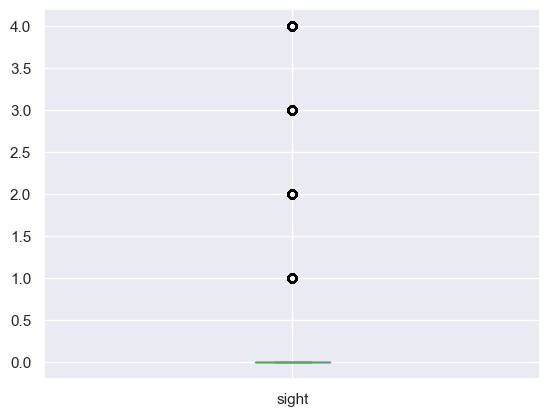

In [688]:
df['sight'].plot(kind='box')

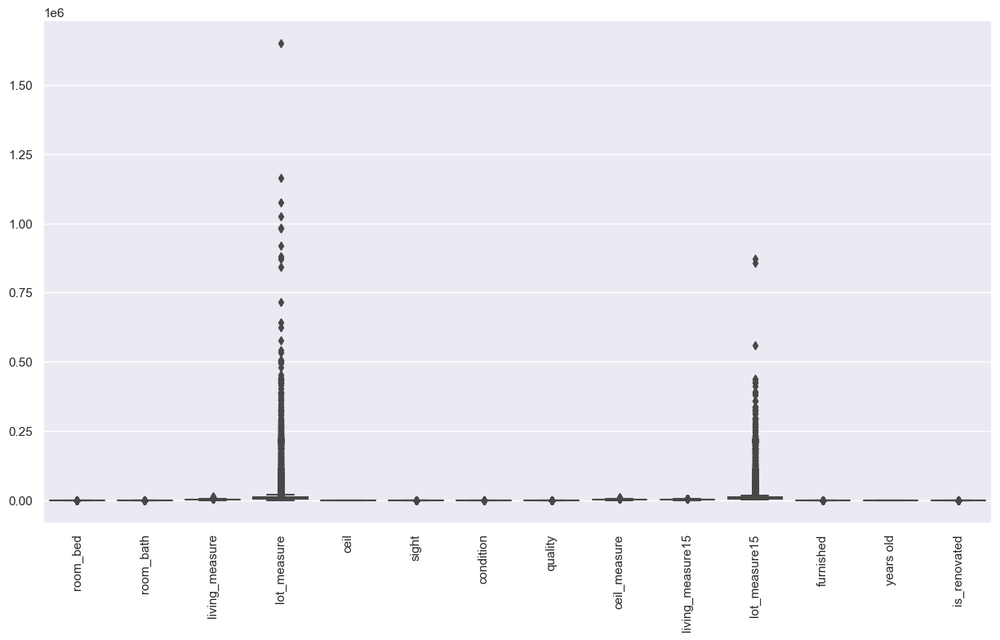

In [689]:
plt.figure(figsize=(15,8))
sns.boxplot(data=df[['room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'sight', 'condition', 'quality', 'ceil_measure',
       'living_measure15', 'lot_measure15', 'furnished', 'years old',
       'is_renovated']])
plt.xticks(rotation=90);

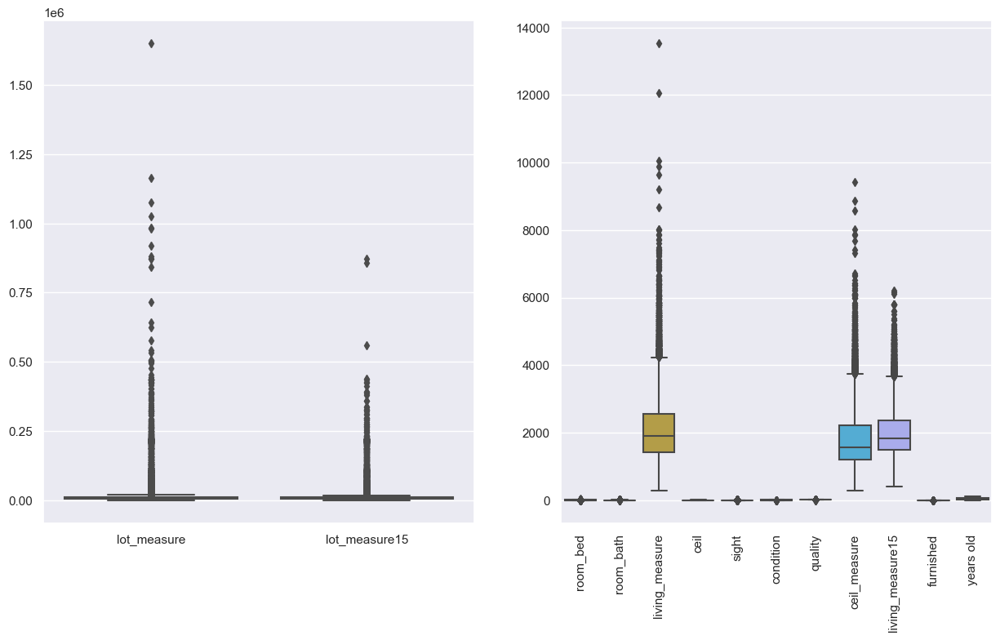

In [690]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df is your DataFrame containing numerical variables
# If not, replace df with your actual DataFrame name

# Identify variables with large and small scales
large_scale_vars = ['lot_measure','lot_measure15']
small_scale_vars = ['room_bed', 'room_bath', 'living_measure',
       'ceil', 'sight', 'condition', 'quality', 'ceil_measure',
       'living_measure15', 'furnished', 'years old']

# Create separate boxplots
fig, axes = plt.subplots(1, 2, figsize=(15, 8))

# Boxplot for variables with large scales
sns.boxplot(data=df[large_scale_vars], ax=axes[0])

# Boxplot for variables with small scales
sns.boxplot(data=df[small_scale_vars], ax=axes[1])
plt.xticks(rotation=90)
# Show the plots
plt.show()

In [691]:
df.zipcode.value_counts(normalize=True)

98103   0.03
98038   0.03
98115   0.03
98052   0.03
98117   0.03
        ... 
98102   0.00
98010   0.00
98024   0.00
98148   0.00
98039   0.00
Name: zipcode, Length: 70, dtype: float64

In [692]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   price             21613 non-null  int64  
 1   room_bed          21613 non-null  float64
 2   room_bath         21613 non-null  float64
 3   living_measure    21613 non-null  float64
 4   lot_measure       21613 non-null  float64
 5   ceil              21613 non-null  float64
 6   coast             21613 non-null  int32  
 7   sight             21613 non-null  int32  
 8   condition         21613 non-null  int32  
 9   quality           21613 non-null  int32  
 10  ceil_measure      21612 non-null  float64
 11  zipcode           21613 non-null  int64  
 12  lat               21613 non-null  float64
 13  long              21579 non-null  float64
 14  living_measure15  21613 non-null  float64
 15  lot_measure15     21613 non-null  float64
 16  furnished         21613 non-null  int32 

## KNN Imputing Missing Values for Numerical Values

In [693]:
df_imputed=df.copy()

In [694]:
from sklearn.impute import KNNImputer
import pandas as pd

# Assuming df is your DataFrame
imputer = KNNImputer(n_neighbors=5)  # You can adjust the number of neighbors
df_imputed[['ceil_measure','long','years old']] = pd.DataFrame(imputer.fit_transform(df_imputed[['ceil_measure','long','years old']]), columns=['ceil_measure','long','years old'])

In [695]:
df_imputed.isna().sum()[df_imputed.isna().sum()>0]

Series([], dtype: int64)

### EDA After Imputation

Distribution of ceil_measure
Skewness  of ceil_measure : 1.45
Kurtosis  of ceil_measure : 3.401665753958614


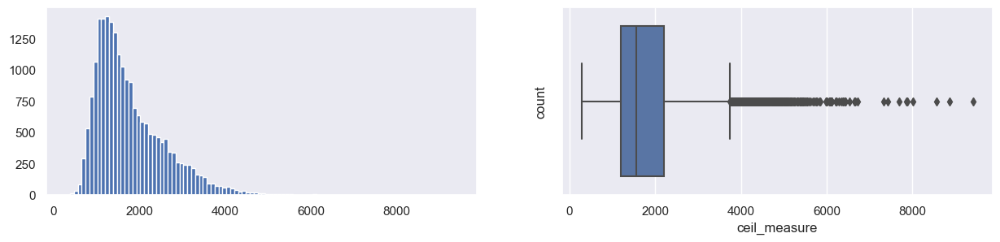

In [696]:
print(f"Distribution of ceil_measure")
print(f"Skewness  of ceil_measure : {round(df_imputed['ceil_measure'].skew(),2)}")
print(f"Kurtosis  of ceil_measure : {kurtosis(df_imputed['ceil_measure'], axis=0, bias=True)}")
plt.figure(figsize=(15,3))
plt.subplot(1,2,1)
df_imputed['ceil_measure'].hist(bins=100, grid=False)
plt.subplot(1,2,2)
sns.boxplot(x=df_imputed['ceil_measure'])
plt.ylabel('count')
plt.show()

In [697]:
df_imputed

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,zipcode,lat,long,living_measure15,lot_measure15,furnished,years old,is_renovated,basement_present
0,600000,4.00,1.75,3050.00,9440.00,1.00,0,0,3,8,1800.00,98034,47.72,-122.18,2020.00,8660.00,0,49.00,0,1
1,190000,2.00,1.00,670.00,3101.00,1.00,0,0,4,6,670.00,98118,47.55,-122.27,1660.00,4100.00,0,67.00,0,0
2,735000,4.00,2.75,3040.00,2415.00,2.00,1,4,3,8,3040.00,98118,47.52,-122.26,2620.00,2433.00,0,48.00,0,0
3,257000,3.00,2.50,1740.00,3721.00,2.00,0,0,3,8,1740.00,98002,47.34,-122.21,2030.00,3794.00,0,5.00,0,0
4,450000,2.00,1.00,1120.00,4590.00,1.00,0,0,3,7,1120.00,98118,47.57,-122.28,1120.00,5100.00,0,91.00,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,685530,4.00,2.50,3130.00,60467.00,2.00,0,0,3,9,3130.00,98014,47.66,-121.96,2780.00,44224.00,1,19.00,0,0
21609,535000,2.00,1.00,1030.00,4841.00,1.00,0,0,3,7,920.00,98103,47.69,-122.34,1530.00,4944.00,0,75.00,0,1
21610,998000,3.00,3.75,3710.00,34412.00,2.00,0,0,3,10,2910.00,98075,47.59,-122.04,2390.00,34412.00,1,36.00,0,1
21611,262000,4.00,2.50,1560.00,7800.00,2.00,0,0,3,7,1560.00,98168,47.51,-122.32,1160.00,7800.00,0,18.00,0,0


In [698]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   price             21613 non-null  int64  
 1   room_bed          21613 non-null  float64
 2   room_bath         21613 non-null  float64
 3   living_measure    21613 non-null  float64
 4   lot_measure       21613 non-null  float64
 5   ceil              21613 non-null  float64
 6   coast             21613 non-null  int32  
 7   sight             21613 non-null  int32  
 8   condition         21613 non-null  int32  
 9   quality           21613 non-null  int32  
 10  ceil_measure      21613 non-null  float64
 11  zipcode           21613 non-null  int64  
 12  lat               21613 non-null  float64
 13  long              21613 non-null  float64
 14  living_measure15  21613 non-null  float64
 15  lot_measure15     21613 non-null  float64
 16  furnished         21613 non-null  int32 

In [699]:
df_imputed['ceil'].value_counts(normalize=True)

1.00   0.50
2.00   0.38
1.50   0.09
3.00   0.03
2.50   0.01
3.50   0.00
Name: ceil, dtype: float64

In [700]:
df_imputed['room_bed'].value_counts()

3.00     9875
4.00     6854
2.00     2747
5.00     1595
6.00      270
1.00      197
7.00       38
8.00       13
0.00       13
9.00        6
10.00       3
33.00       1
11.00       1
Name: room_bed, dtype: int64

In [701]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   price             21613 non-null  int64  
 1   room_bed          21613 non-null  float64
 2   room_bath         21613 non-null  float64
 3   living_measure    21613 non-null  float64
 4   lot_measure       21613 non-null  float64
 5   ceil              21613 non-null  float64
 6   coast             21613 non-null  int32  
 7   sight             21613 non-null  int32  
 8   condition         21613 non-null  int32  
 9   quality           21613 non-null  int32  
 10  ceil_measure      21613 non-null  float64
 11  zipcode           21613 non-null  int64  
 12  lat               21613 non-null  float64
 13  long              21613 non-null  float64
 14  living_measure15  21613 non-null  float64
 15  lot_measure15     21613 non-null  float64
 16  furnished         21613 non-null  int32 

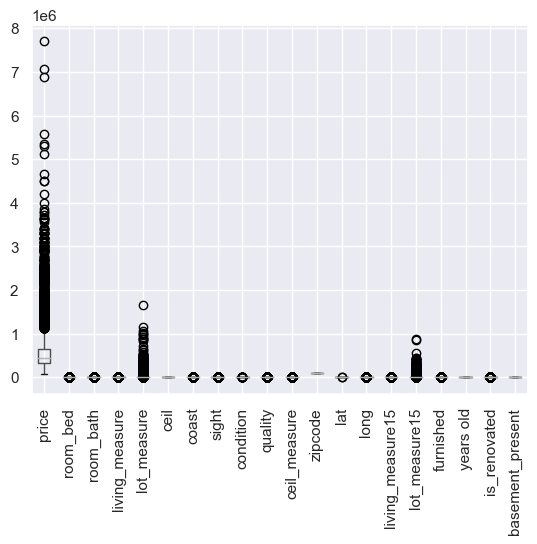

In [702]:
df_imputed.boxplot()
plt.xticks(rotation=90);

<AxesSubplot:>

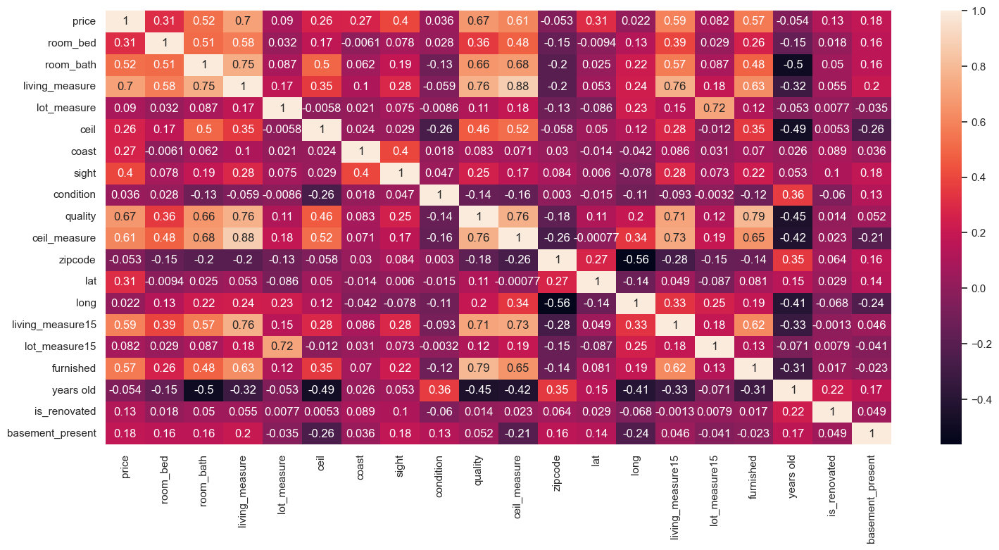

In [703]:

plt.figure(figsize=(18,8))
sns.heatmap(df_imputed.corr(),annot=True)

## Outlier Treatment

In [704]:
def treat_outlier(x):
    # taking 25,75 percentile of column
    q25=np.percentile(x,25)
    q75=np.percentile(x,75)
    #calculationg IQR range
    IQR=q75-q25
    #Calculating minimum threshold
    lower_bound=q25-(1.5*IQR)
    upper_bound=q75+(1.5*IQR)
    #Capping outliers
    return x.apply(lambda y: upper_bound if y > upper_bound else y).apply(lambda y: lower_bound if y < lower_bound else y)

In [705]:
Q1 = df_imputed.quantile(0.25)
Q3 = df_imputed.quantile(0.75)
IQR = Q3 - Q1
UL = Q3 + 1.5*IQR
LL = Q1 - 1.5*IQR

In [706]:
((df_imputed > UL) | (df_imputed < LL)).sum()[((df_imputed > UL) | (df_imputed < LL)).sum()>0]

price               1159
room_bed             542
room_bath            569
living_measure       572
lot_measure         2425
coast                161
sight               2119
condition             30
quality             1911
ceil_measure         611
lat                    2
long                 256
living_measure15     546
lot_measure15       2196
furnished           4246
is_renovated         914
dtype: int64

In [707]:
((df_imputed > UL) | (df_imputed < LL)).sum()[((df_imputed > UL) | (df_imputed < LL)).sum()>0].index

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'coast', 'sight', 'condition', 'quality', 'ceil_measure', 'lat', 'long',
       'living_measure15', 'lot_measure15', 'furnished', 'is_renovated'],
      dtype='object')

In [708]:
df_imputed.columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure',
       'zipcode', 'lat', 'long', 'living_measure15', 'lot_measure15',
       'furnished', 'years old', 'is_renovated', 'basement_present'],
      dtype='object')

In [709]:
X_list=['room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil_measure','ceil',
       'living_measure15', 'lot_measure15','years old']

In [710]:

for i in X_list:    
    df_imputed[i]=treat_outlier(df_imputed[i])

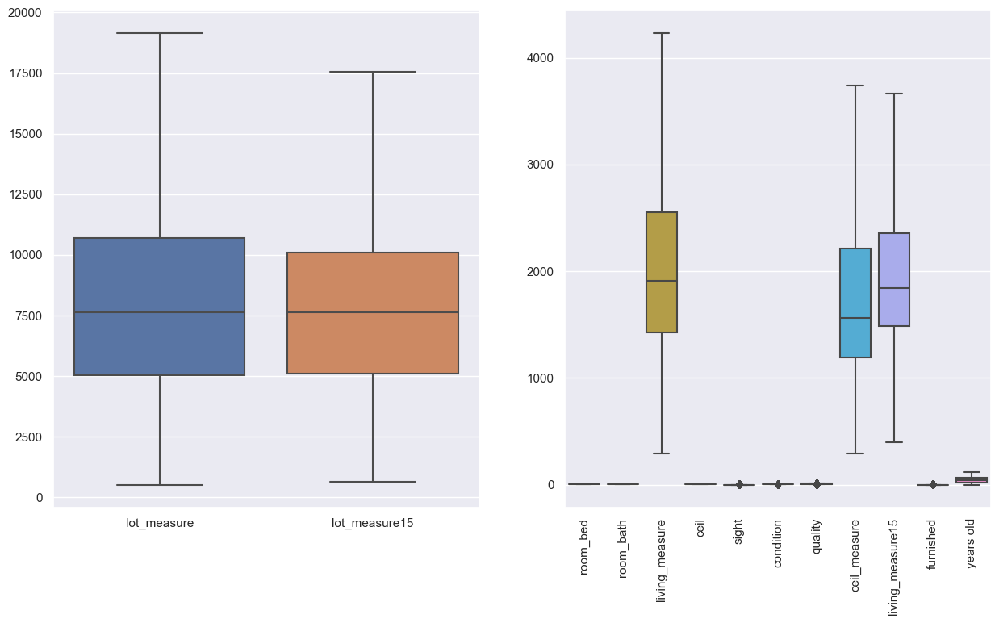

In [712]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming df is your DataFrame containing numerical variables
# If not, replace df with your actual DataFrame name

# Identify variables with large and small scales
large_scale_vars = ['lot_measure','lot_measure15']
small_scale_vars = ['room_bed', 'room_bath', 'living_measure',
       'ceil', 'sight', 'condition', 'quality', 'ceil_measure',
       'living_measure15', 'furnished', 'years old']

# Create separate boxplots
fig, axes = plt.subplots(1, 2, figsize=(15, 8))

# Boxplot for variables with large scales
sns.boxplot(data=df_imputed[large_scale_vars], ax=axes[0])

# Boxplot for variables with small scales
sns.boxplot(data=df_imputed[small_scale_vars], ax=axes[1])
plt.xticks(rotation=90)
# Show the plots
plt.show()

In [163]:
df_imputed.isnull().sum()

price               0
room_bed            0
room_bath           0
living_measure      0
lot_measure         0
ceil                0
coast               0
sight               0
condition           0
quality             0
ceil_measure        0
zipcode             0
lat                 0
long                0
living_measure15    0
lot_measure15       0
furnished           0
years old           0
is_renovated        0
basement_present    0
dtype: int64

In [165]:
df_imputed.columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure',
       'zipcode', 'lat', 'long', 'living_measure15', 'lot_measure15',
       'furnished', 'years old', 'is_renovated', 'basement_present'],
      dtype='object')

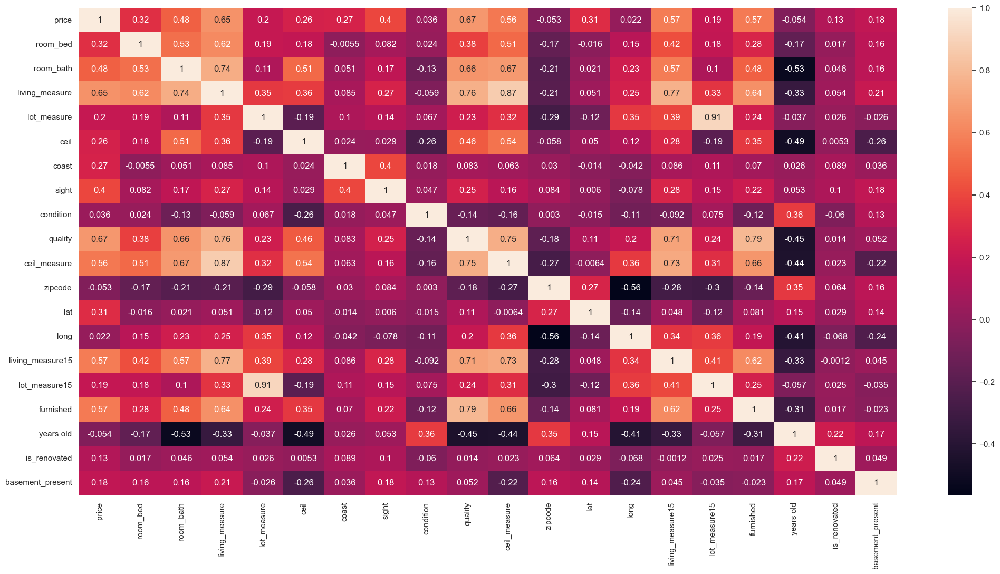

In [166]:
plt.figure(figsize=(25,12))
sns.heatmap(df_imputed[['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure',
       'zipcode', 'lat', 'long', 'living_measure15', 'lot_measure15',
       'furnished', 'years old', 'is_renovated', 'basement_present']].corr(),annot=True);

In [170]:
df_cluster=df_imputed.copy()

In [171]:
df_imputed.columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure',
       'zipcode', 'lat', 'long', 'living_measure15', 'lot_measure15',
       'furnished', 'years old', 'is_renovated', 'basement_present'],
      dtype='object')

In [172]:
df_imputed['coast']=df_imputed['coast'].astype('int')

In [173]:
df_imputed['condition']=df_imputed['condition'].astype('int')

In [174]:
df_imputed['furnished']=df_imputed['furnished'].astype('int')

In [175]:
df_imputed['is_renovated']=df_imputed['is_renovated'].astype('int')

In [176]:
df_imputed['basement_present']=df_imputed['basement_present'].astype('int')

In [177]:
df_imputed['sight']=df_imputed['sight'].astype('int')

In [178]:
df_imputed['quality']=df_imputed['quality'].astype('int')

In [179]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   price             21613 non-null  int64  
 1   room_bed          21613 non-null  float64
 2   room_bath         21613 non-null  float64
 3   living_measure    21613 non-null  float64
 4   lot_measure       21613 non-null  float64
 5   ceil              21613 non-null  float64
 6   coast             21613 non-null  int32  
 7   sight             21613 non-null  int32  
 8   condition         21613 non-null  int32  
 9   quality           21613 non-null  int32  
 10  ceil_measure      21613 non-null  float64
 11  zipcode           21613 non-null  int64  
 12  lat               21613 non-null  float64
 13  long              21613 non-null  float64
 14  living_measure15  21613 non-null  float64
 15  lot_measure15     21613 non-null  float64
 16  furnished         21613 non-null  int32 

## Encoding 

In [180]:
df_categorical=pd.get_dummies(df[['zipcode']], prefix_sep='_',columns=['zipcode'], drop_first=True)#getting dummies for numeric categorical variables

In [181]:
num=['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure', 'lat', 'long', 'living_measure15', 'lot_measure15',
       'furnished', 'years old', 'is_renovated', 'basement_present']

In [182]:
df_num=df_imputed[num]

In [184]:

df_imputed= pd.concat([df_num,df_categorical],axis=1)
df_imputed

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,lat,long,living_measure15,lot_measure15,furnished,years old,is_renovated,basement_present,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
0,600000,4.00,1.75,3050.00,9440.00,1.00,0,0,3,8,1800.00,47.72,-122.18,2020.00,8660.00,0,49.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,190000,2.00,1.00,670.00,3101.00,1.00,0,0,4,6,670.00,47.55,-122.27,1660.00,4100.00,0,67.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,735000,4.00,2.75,3040.00,2415.00,2.00,1,4,3,8,3040.00,47.52,-122.26,2620.00,2433.00,0,48.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,257000,3.00,2.50,1740.00,3721.00,2.00,0,0,3,8,1740.00,47.34,-122.21,2030.00,3794.00,0,5.00,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,450000,2.00,1.00,1120.00,4590.00,1.00,0,0,3,7,1120.00,47.57,-122.28,1120.00,5100.00,0,91.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,685530,4.00,2.50,3130.00,19160.00,2.00,0,0,3,9,3130.00,47.66,-121.96,2780.00,17565.00,1,19.00,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21609,535000,2.00,1.00,1030.00,4841.00,1.00,0,0,3,7,920.00,47.69,-122.34,1530.00,4944.00,0,75.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21610,998000,3.00,3.62,3710.00,19160.00,2.00,0,0,3,10,2910.00,47.59,-122.04,2390.00,17565.00,1,36.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21611,262000,4.00,2.50,1560.00,7800.00,2.00,0,0,3,7,1560.00,47.51,-122.32,1160.00,7800.00,0,18.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [185]:
df_imputed.columns

Index(['price', 'room_bed', 'room_bath', 'living_measure', 'lot_measure',
       'ceil', 'coast', 'sight', 'condition', 'quality', 'ceil_measure', 'lat',
       'long', 'living_measure15', 'lot_measure15', 'furnished', 'years old',
       'is_renovated', 'basement_present', 'zipcode_98002', 'zipcode_98003',
       'zipcode_98004', 'zipcode_98005', 'zipcode_98006', 'zipcode_98007',
       'zipcode_98008', 'zipcode_98010', 'zipcode_98011', 'zipcode_98014',
       'zipcode_98019', 'zipcode_98022', 'zipcode_98023', 'zipcode_98024',
       'zipcode_98027', 'zipcode_98028', 'zipcode_98029', 'zipcode_98030',
       'zipcode_98031', 'zipcode_98032', 'zipcode_98033', 'zipcode_98034',
       'zipcode_98038', 'zipcode_98039', 'zipcode_98040', 'zipcode_98042',
       'zipcode_98045', 'zipcode_98052', 'zipcode_98053', 'zipcode_98055',
       'zipcode_98056', 'zipcode_98058', 'zipcode_98059', 'zipcode_98065',
       'zipcode_98070', 'zipcode_98072', 'zipcode_98074', 'zipcode_98075',
       'zipcode_

In [186]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 88 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   price             21613 non-null  int64  
 1   room_bed          21613 non-null  float64
 2   room_bath         21613 non-null  float64
 3   living_measure    21613 non-null  float64
 4   lot_measure       21613 non-null  float64
 5   ceil              21613 non-null  float64
 6   coast             21613 non-null  int32  
 7   sight             21613 non-null  int32  
 8   condition         21613 non-null  int32  
 9   quality           21613 non-null  int32  
 10  ceil_measure      21613 non-null  float64
 11  lat               21613 non-null  float64
 12  long              21613 non-null  float64
 13  living_measure15  21613 non-null  float64
 14  lot_measure15     21613 non-null  float64
 15  furnished         21613 non-null  int32  
 16  years old         21613 non-null  float6

In [187]:
df_pca=df_imputed.copy()
df_pca

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,lat,long,living_measure15,lot_measure15,furnished,years old,is_renovated,basement_present,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
0,600000,4.00,1.75,3050.00,9440.00,1.00,0,0,3,8,1800.00,47.72,-122.18,2020.00,8660.00,0,49.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,190000,2.00,1.00,670.00,3101.00,1.00,0,0,4,6,670.00,47.55,-122.27,1660.00,4100.00,0,67.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,735000,4.00,2.75,3040.00,2415.00,2.00,1,4,3,8,3040.00,47.52,-122.26,2620.00,2433.00,0,48.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,257000,3.00,2.50,1740.00,3721.00,2.00,0,0,3,8,1740.00,47.34,-122.21,2030.00,3794.00,0,5.00,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,450000,2.00,1.00,1120.00,4590.00,1.00,0,0,3,7,1120.00,47.57,-122.28,1120.00,5100.00,0,91.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,685530,4.00,2.50,3130.00,19160.00,2.00,0,0,3,9,3130.00,47.66,-121.96,2780.00,17565.00,1,19.00,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21609,535000,2.00,1.00,1030.00,4841.00,1.00,0,0,3,7,920.00,47.69,-122.34,1530.00,4944.00,0,75.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21610,998000,3.00,3.62,3710.00,19160.00,2.00,0,0,3,10,2910.00,47.59,-122.04,2390.00,17565.00,1,36.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
21611,262000,4.00,2.50,1560.00,7800.00,2.00,0,0,3,7,1560.00,47.51,-122.32,1160.00,7800.00,0,18.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


## PCA 

In [188]:
df_pca.drop(['price'],axis=1,inplace=True)

In [189]:
from scipy.stats import zscore
df_num_scaled=df_pca.apply(zscore)
df_num_scaled.describe()

,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,lat,long,living_measure15,lot_measure15,furnished,years old,is_renovated,basement_present,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
count,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00,21613.00
mean,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-2.18,-2.05,-2.11,-1.62,-0.91,-0.09,-0.31,-3.70,-5.66,-1.94,-2.92,-2.17,-2.43,-1.75,-0.49,-1.51,-0.21,-0.80,-0.10,-0.11,-0.12,-0.09,-0.15,-0.08,-0.12,-0.07,-0.10,-0.08,-0.09,-0.10,-0.15,-0.06,-0.14,-0.12,-0.12,-0.11,-0.11,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.12,-0.16,-0.16,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.13,-0.12,-0.05,-0.15,-0.11,-0.11,-0.11,-0.11,-0.08,-0.11,-0.12
25%,-0.42,-0.49,-0.75,-0.73,-0.91,-0.09,-0.31,-0.63,-0.56,-0.76,-0.64,-0.81,-0.75,-0.73,-0.49,-0.86,-0.21,-0.80,-0.10,-0.11,-0.12,-0.09,-0.15,-0.08,-0.12,-0.07,-0.10,-0.08,-0.09,-0.10,-0.15,-0.06,-0.14,-0.12,-0.12,-0.11,-0.11,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.12,-0.16,-0.16,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.13,-0.12,-0.05,-0.15,-0.11,-0.11,-0.11,-0.11,-0.08,-0.11,-0.12
50%,-0.42,0.21,-0.18,-0.22,0.01,-0.09,-0.31,-0.63,-0.56,-0.27,0.08,-0.11,-0.21,-0.16,-

In [190]:
from sklearn.decomposition import PCA
pca=PCA(n_components=50,random_state=123)
df_num_pca=pca.fit_transform(df_num_scaled)

In [191]:
df_num_pca

array([[ 2.46930719e-01, -2.79321027e-01,  1.06810446e+00, ...,
         2.15219316e-02,  1.91736377e-01, -2.76332009e-01],
       [-3.94903301e+00,  1.15214213e-01, -3.46928363e-01, ...,
         1.00621282e-01,  1.39711607e-03, -1.68006679e-01],
       [ 2.08106473e+00, -1.81203887e+00,  2.69344828e+00, ...,
        -2.06311751e-02, -1.36997561e-01, -1.88940842e-01],
       ...,
       [ 5.17264960e+00,  6.10301540e-01,  6.16905147e-01, ...,
         5.76065676e-01,  5.20371713e-01, -2.36280015e-01],
       [-9.06955131e-01,  1.64419175e-01, -1.15608805e+00, ...,
        -1.92283890e+00,  2.20375171e-01,  6.00282260e-01],
       [ 6.94932611e-01, -2.50397771e+00,  6.12046975e-01, ...,
        -4.10046096e-01,  1.45572726e+00, -4.25488128e-01]])

In [192]:
pca.components_

array([[ 2.23426890e-01,  3.09166479e-01,  3.57320695e-01, ...,
        -1.44091234e-02, -2.27016678e-02, -1.15812567e-02],
       [-4.59140317e-02, -1.75279005e-01, -8.33436825e-02, ...,
         3.56236686e-02,  4.59600499e-02, -9.73657571e-02],
       [ 9.41215234e-02, -3.28747723e-02,  1.32613347e-01, ...,
         3.46934905e-03,  1.99103246e-02,  7.65883005e-02],
       ...,
       [-1.11988373e-03, -6.61927839e-03,  1.55550316e-03, ...,
         8.36119711e-02,  3.02942629e-02, -6.64298570e-02],
       [ 9.94484831e-05, -2.75873376e-03,  5.58184514e-03, ...,
         2.01227137e-03, -4.62447867e-02,  9.82403960e-03],
       [ 7.08670621e-04, -5.26572464e-03, -6.73891640e-03, ...,
        -4.62566784e-02, -7.79496658e-02, -6.68047941e-02]])

In [193]:
pca.explained_variance_

array([6.18368172, 2.67066747, 2.43465245, 1.84354288, 1.44562972,
       1.30112945, 1.17939295, 1.1333883 , 1.08959762, 1.05467559,
       1.04530471, 1.03022398, 1.02750093, 1.02545253, 1.02459739,
       1.02429518, 1.02256142, 1.02159057, 1.02096888, 1.02041378,
       1.01960018, 1.01913018, 1.01890937, 1.0185878 , 1.01787066,
       1.01724651, 1.01688776, 1.01674651, 1.01519887, 1.01500969,
       1.01463618, 1.01430946, 1.01413888, 1.01405967, 1.01356934,
       1.0134478 , 1.01306314, 1.01293111, 1.01232751, 1.01203229,
       1.01117739, 1.01084626, 1.01016869, 1.00967498, 1.00922364,
       1.00904872, 1.00834431, 1.00790873, 1.00753731, 1.0071812 ])

In [194]:
pca_ratio=pca.explained_variance_ratio_
pca_ratio

array([0.07107351, 0.03069591, 0.02798322, 0.02118917, 0.01661566,
       0.01495482, 0.01355561, 0.01302685, 0.01252353, 0.01212215,
       0.01201444, 0.01184111, 0.01180981, 0.01178627, 0.01177644,
       0.01177296, 0.01175304, 0.01174188, 0.01173473, 0.01172835,
       0.011719  , 0.0117136 , 0.01171106, 0.01170736, 0.01169912,
       0.01169195, 0.01168782, 0.0116862 , 0.01166841, 0.01166624,
       0.01166195, 0.01165819, 0.01165623, 0.01165532, 0.01164968,
       0.01164829, 0.01164387, 0.01164235, 0.01163541, 0.01163202,
       0.01162219, 0.01161838, 0.0116106 , 0.01160492, 0.01159973,
       0.01159772, 0.01158963, 0.01158462, 0.01158035, 0.01157626])

In [195]:
np.cumsum(pca_ratio)

array([0.07107351, 0.10176942, 0.12975264, 0.1509418 , 0.16755747,
       0.18251229, 0.1960679 , 0.20909475, 0.22161828, 0.23374043,
       0.24575487, 0.25759598, 0.26940578, 0.28119205, 0.29296849,
       0.30474145, 0.31649449, 0.32823636, 0.33997109, 0.35169945,
       0.36341845, 0.37513204, 0.3868431 , 0.39855047, 0.41024959,
       0.42194154, 0.43362936, 0.44531556, 0.45698397, 0.46865021,
       0.48031216, 0.49197035, 0.50362658, 0.5152819 , 0.52693158,
       0.53857987, 0.55022373, 0.56186608, 0.57350149, 0.58513351,
       0.5967557 , 0.60837408, 0.61998468, 0.6315896 , 0.64318934,
       0.65478706, 0.66637669, 0.67796131, 0.68954166, 0.70111792])

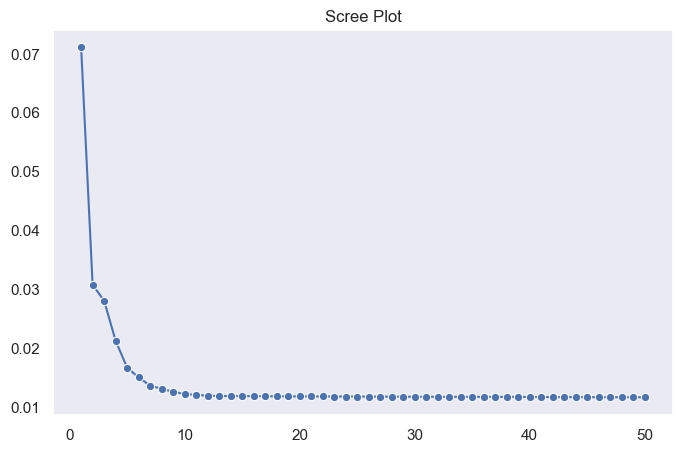

In [196]:
plt.figure(figsize=(8,5))
sns.lineplot(y=pca_ratio,x=np.arange(1,len(pca_ratio)+1),marker='o')
plt.title("Scree Plot")
plt.grid()

<AxesSubplot:>

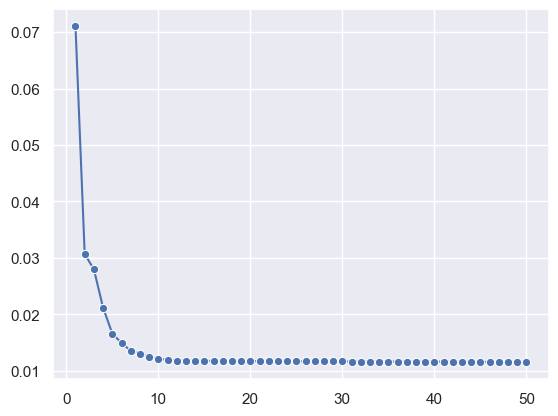

In [197]:
sns.lineplot(y=pca_ratio,x=np.arange(1,len(pca_ratio)+1),marker='o')

In [198]:
df_num_pca_loadings=pd.DataFrame(pca.components_,columns=list(df_pca.columns))

In [199]:
df_num_pca_loadings

,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,lat,long,living_measure15,lot_measure15,furnished,years old,is_renovated,basement_present,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
0,0.22,0.31,0.36,0.18,0.19,0.04,0.10,-0.07,0.34,0.36,0.00,0.19,0.34,0.18,0.30,-0.22,0.00,-0.01,-0.03,-0.01,0.05,0.03,0.06,0.01,0.00,0.01,0.01,0.02,0.02,-0.00,-0.01,0.01,0.04,0.00,0.03,-0.00,-0.00,-0.02,0.02,-0.01,0.03,0.03,0.06,0.01,0.02,0.04,0.05,-0.02,-0.00,0.00,0.03,0.04,-0.00,0.03,0.06,0.08,0.05,0.02,-0.00,-0.05,-0.01,-0.05,-0.03,-0.03,-0.01,0.01,-0.04,-0.03,-0.05,-0.05,-0.01,-0.02,-0.03,-0.05,-0.05,-0.03,-0.03,-0.04,-0.01,-0.03,-0.01,-0.04,0.00,-0.03,-0.01,-0.02,-0.01
1,-0.05,-0.18,-0.08,0.43,-0.28,0.02,-0.04,0.10,-0.16,-0.05,-0.30,0.29,0.00,0.44,-0.11,0.02,-0.04,-0.13,0.05,0.05,0.01,0.03,0.02,0.01,0.03,0.09,-0.02,0.09,0.03,0.14,0.05,0.07,0.04,-0.01,-0.04,0.03,0.04,0.04,-0.02,-0.02,0.06,0.01,0.01,0.09,0.13,-0.02,0.02,0.02,0.02,0.07,0.04,0.01,0.08,0.04,0.01,0.01,0.06,0.07,-0.08,-0.15,-0.07,-0.04,-0.10,-0.03,-0.07,-0.10,-0.09,-0.08,-0.11,-0.03,-0.10,-0.09,-0.04,-0.04,-0.05,-0.05,-0.08,0.02,0.02,-0.00,0.05,0.06,-0.03,0.03,0.04,0.05,-0.10
2,0.09,-0.03,0.13,0.22,-0.27,0.19,0.30,0.25,0.06,-0.05,0.21,-0.28,0.10,0.22,0.07,0.35,0.15,0.34,-0.05,-0.02,0.08,0.06,0.08,0.00,0.04,-0.02,0.01,-0.02,-0.05,-0.04,-0.01,-0.00,-0.03,0.03,-0.13,-0.07,-0.05,-0.00,0.03,0.03,-0.17,0.05,0.11,-0.10,-0.08,-0.02,-0.07,-0.04,-0.03,-0.04,-0.06,-0.13,0.09,0.04,-0.03,-0.02,0.04,-0.07,-0.00,-0.02,0.05,-0.02,-0.01,-0.00,0.02,0.04,0.06,0.05,0.05,0.01,0.03,-0.01,0.04,0.02,0.03,0.03,0.01,0.03,-0.01,0.08,0.09,0.01,0.11,0.03,0.00,0.02,0.08
3,0.09,0.10,0.06,-0.10,0.06,0.15,0.21,0.05,0.03,0.02,-0.58,-0.23,-0.01,-0.11,0.02,-0.01,0.08,0.09,0.10,0.15,-0.03,-0.03,0.02,-0.03,-0.04,0.02,-0.10,-0.14,-0.16,0.12,0.22,-0.06,-0.00,-0.12,-0.02,0.08,0.07,0.06,-0.08,-0.14,0.10,-0.00,0.05,0.09,-0.09,-0.12,-0.15,0.04,0.02,0.05,0.03,-0.04,0.09,-0.16,-0.09,-0.04,-0.15,0.14,0.01,-0.03,0.01,0.05,-0.00,0.03,0.02,0.03,-0.06,0.08,-0.04,0.03,0.04,0.02,-0.09,0.06,-0.11,0.07,0.04,0.05,0.03,-0.15,0.10,0.01,-0.05,0.04,0.04,0.12,0.03
4,-0.33,-0.10,-0.12,0.03,0.18,0.48,0.36,-0.28,0.02,0.02,0.06,-0.01,-0.03,0.04,0.07,-0.05,0.17,-0.27,-0.06,-0.05,-0.07,-0.12,-0.09,-0.07,-0.04,0.01,-0.01,0.08,0.05,0.02,-0.08,0.02,-0.07,0.00,0.04,-0.03,-0.08,-0.05,-0.01,-0.01,0.01,-0.01,-0.01,-0.05,0.07,-0.04,0.11,-0.00,-0.05,-0.09,-0.07,0.05,0.30,0.00,0.06,0.05,0.01,-0.02,0.00,0.07,-0.07,-0.01,0.06,-0.06,0.00,-0.06,-0.06,0.03,-0.01,0.00,0.02,0.03,0.07,0.03,-0.00,0.08,0.00,0.10,0.00,0.02,0.08,0.02,0.04,0.04,-0.02,0.07,-0.02
5,0.04,0.04,0.03,-0.12,-0.03,0.12,0.22,0.17,-0.06,-0.06,-0.01,0.39,0.00,-0.13,-0.06,0.14,0.13,0.19,0.03,-0.16,-0.10,-0.04,0.07,0.04,0.17,0.02,-0.06,0.08,0.06,0.21,-0.27,0.07,0.12,-0.12,0.11,-0.05,-0.01,-0.02,0.01,-0.02,0.09,-0.04,0.03,-0.00,0.26,-0.00,-0.07,-0.01,0.05,0.02,-0.10,0.27,-0.14,-0.11,0.01,0.01,-0.14,-0.12,-0.00,-0.01,0.11,-0.08,-0.04,0.02,0.05,0.04,0.12,0.02,-0.02,0.11,0.05,0.08,-0.01,-0.02,-0.14,0.01,0.12,-0.08,-0.07,-0.11,-0.05,-0.11,-0.06,0.09,-0.07,-

In [200]:
#Create a dataframe containing the loadings or coefficients of all PCs
df_extracted_loadings = pd.DataFrame(pca.components_.T, 
                                     columns = ['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18','PC19','PC20','PC21','PC22','PC23','PC24','PC25','PC26','PC27','PC28','PC29','PC30','PC31','PC32','PC33','PC34','PC35','PC36','PC37','PC38','PC39','PC40','PC41','PC42','PC43','PC44','PC45','PC46','PC47','PC48','PC49','PC50'],
                                    index = df_pca.columns)

In [201]:
df_extracted_loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40,PC41,PC42,PC43,PC44,PC45,PC46,PC47,PC48,PC49,PC50
room_bed,0.22,-0.05,0.09,0.09,-0.33,0.04,-0.11,0.06,0.27,-0.08,0.02,0.02,0.05,0.01,0.00,0.01,-0.02,0.01,0.01,0.01,0.00,0.00,-0.01,0.00,-0.01,0.01,-0.00,0.00,0.01,0.01,-0.00,-0.01,-0.00,-0.01,-0.01,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.01,-0.00,0.00,-0.01,-0.00,0.00,-0.00,0.00,0.00
room_bath,0.31,-0.18,-0.03,0.10,-0.10,0.04,-0.13,0.00,0.12,0.08,-0.00,0.01,0.00,0.02,-0.01,-0.02,0.02,0.00,-0.00,-0.01,-0.01,-0.00,-0.01,-0.00,-0.00,0.01,0.00,0.00,-0.00,0.01,-0.00,0.00,-0.02,-0.01,0.01,0.00,0.00,0.00,0.01,0.00,-0.01,0.01,0.00,0.00,0.01,0.01,0.00,-0.01,-0.00,-0.01
living_measure,0.36,-0.08,0.13,0.06,-0.12,0.03,-0.02,-0.02,0.06,-0.02,-0.00,-0.03,-0.01,-0.00,-0.01,-0.01,0.01,-0.01,0.00,0.01,0.00,-0.01,-0.01,0.01,-0.01,0.00,0.00,-0.00,0.01,-0.01,0.00,-0.00,-0.00,-0.01,0.01,-0.00,-0.00,-0.01,-0.00,0.01,-0.01,0.01,-0.00,0.00,-0.00,0.00,-0.00,0.00,0.01,-0.01
lot_measure,0.18,0.43,0.22,-0.10,0.03,-0.12,0.02,-0.03,0.01,0.05,0.01,-0.01,0.01,0.00,-0.00,0.00,-0.01,-0.00,-0.01,0.00,-0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.01,0.00,0.00,0.00,0.00,-0.01,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.01,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00,0.01,-0.00
ceil,0.19,-0.28,-0.27,0.06,0.18,-0.03,0.11,0.09,0.06,0.12,0.04,-0.03,0.02,0.01,-0.01,0.02,-0.02,-0.01,-0.00,0.00,0.00,0.00,-0.01,0.00,0.01,-0.00,0.00,-0.01,0.01,0.01,0.00,0.01,0.01,-0.01,0.01,0.01,0.00,-0.00,0.01,0.00,0.00,-0.00,0.00,-0.01,0.00,-0.00,0.00,0.00,-0.01,0.01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
zipcode_98177,0.00,-0.03,0.11,-0.05,0.04,-0.06,-0.02,-0.06,0.00,0.02,-0.35,-0.10,0.06,-0.03,-0.04,0.02,-0.00,-0.02,0.02,-0.04,0.15,-0.04,-0.14,0.09,0.13,0.09,-0.06,0.05,0.08,0.19,-0.03,0.03,0.04,0.11,-0.26,0.13,-0.25,-0.25,-0.20,-0.21,-0.07,0.02,-0.09,-0.10,0.25,0.23,0.03,0.00,-0.10,0.11
zipcode_98178,-0.03,0.03,0.03,0.04,0.04,0.09,-0.14,-0.10,0.06,-0.16,0.11,-0.00,-0.00,-0.04,0.04,0.00,-0.08,0.09,0.07,-0.05,0.04,-0.10,0.16,0.10,-0.12,0.04,-0.09,-0.06,0.02,0.03,0.12,-0.03,0.20,-0.04,0.14,0.01,-0.22,-0.13,0.37,-0.20,-0.27,0.15,0.07,0.14,-0.10,0.02,0.04,0.08,0.01,0.01
zipcode_98188,-0.01,0.04,0.00,0.04,-0.02,-0.07,0.04,-0.02,0.06,-0.08,0.03,-0.04,0.09,-0.02,-0.00,-0.02,-0.08,-0.08,0.05,-0.08,0.03,0.09,-0.03,-0.01,-0.12,0.10,-0.00,0.04,0.07,-0.07,0.02,-0.00,0.05,-0.09,0.07,-0.08,0.00,0.09,0.07,-0.09,-0.15,-0.04,0.20,-0.15,-0.13,0.38,-0.16,0.08,0.00,-0.05
zipcode_98198,-0.02,0.05,0.02,0.12,0.07,-0.01,-0.11,0.05,-0.03,-0.10,-0.08,0.01,0.02,0.04,-0.00,-0.07,-0.02,0.03,0.04,0.02,0.06,-0.05,0.03,0.07,-0.06,0.05,-0.11,-0.11,-0.12,-0.25,0.13,-0.12,-0.06,0.31,0.10,0.28,0.11,0.21,-0.16,-0.18,0.36,-0.06,0.01,0.16,0.02,0.06,-0.06,0.03,-0.05,-0.08


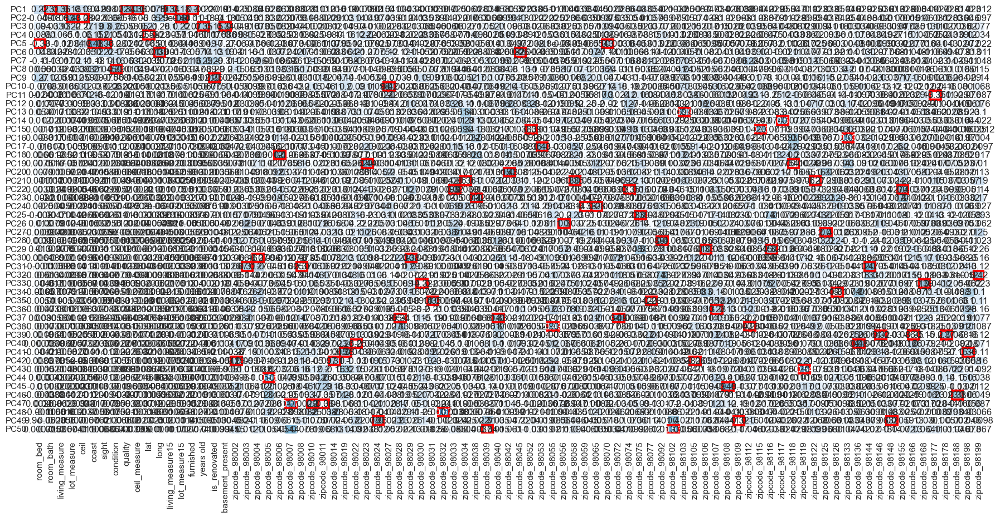

In [202]:
from matplotlib.patches import Rectangle
fig,ax = plt.subplots(figsize=(22, 10), facecolor='w', edgecolor='k')
ax = sns.heatmap(df_num_pca_loadings, annot=True, vmax=1.0, vmin=0, cmap='Blues', cbar=False, fmt='.2g', ax=ax,
                 yticklabels=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15','PC16','PC17','PC18','PC19','PC20','PC21','PC22','PC23','PC24','PC25','PC26','PC27','PC28','PC29','PC30','PC31','PC32','PC33','PC34','PC35','PC36','PC37','PC38','PC39','PC40','PC41','PC42','PC43','PC44','PC45','PC46','PC47','PC48','PC49','PC50'])

column_max = df_num_pca_loadings.abs().idxmax(axis=0)

for col, variable in enumerate(df_num_pca_loadings.columns):
    position = df_num_pca_loadings.index.get_loc(column_max[variable])
    ax.add_patch(Rectangle((col, position),1,1, fill=False, edgecolor='red', lw=3))

## Train test Split

In [203]:
X = df_imputed.drop(['price'], axis = 1)
Y = np.log(df_imputed['price'])

In [204]:
X_train, X_test, y_train, y_test = train_test_split(
    X, Y, test_size=0.30, random_state=1
)

## Scaling Variable 

In [205]:
from sklearn.preprocessing import StandardScaler #Scale train and test separately
scaler = StandardScaler()
scaled_predictors_train = pd.DataFrame(scaler.fit_transform(X_train), columns = X_train.columns)
scaled_predictors_test= pd.DataFrame(scaler.transform(X_test), columns = X_test.columns)

In [206]:
scaled_predictors_train.reset_index(drop=True, inplace=True)

In [207]:
scaled_predictors_test.reset_index(drop=True, inplace=True)

In [208]:
X_train=scaled_predictors_train

In [209]:
X_test=scaled_predictors_test

In [210]:
y_train.reset_index(drop=True, inplace=True)

In [211]:
y_test.reset_index(drop=True, inplace=True)

In [212]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15129 entries, 0 to 15128
Data columns (total 87 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   room_bed          15129 non-null  float64
 1   room_bath         15129 non-null  float64
 2   living_measure    15129 non-null  float64
 3   lot_measure       15129 non-null  float64
 4   ceil              15129 non-null  float64
 5   coast             15129 non-null  float64
 6   sight             15129 non-null  float64
 7   condition         15129 non-null  float64
 8   quality           15129 non-null  float64
 9   ceil_measure      15129 non-null  float64
 10  lat               15129 non-null  float64
 11  long              15129 non-null  float64
 12  living_measure15  15129 non-null  float64
 13  lot_measure15     15129 non-null  float64
 14  furnished         15129 non-null  float64
 15  years old         15129 non-null  float64
 16  is_renovated      15129 non-null  float6

In [213]:
X_train

,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,lat,long,living_measure15,lot_measure15,furnished,years old,is_renovated,basement_present,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
0,-1.60,0.55,-0.27,-1.16,0.94,-0.08,-0.31,-0.62,-0.56,0.08,-0.06,1.54,-0.19,-1.29,-0.50,-1.17,-0.21,-0.80,-0.10,-0.12,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,8.25,-0.11,-0.12,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
1,-1.60,-1.52,-0.81,-0.57,-0.91,-0.08,-0.31,-0.62,-0.56,-0.51,0.92,-1.26,-0.67,-0.97,-0.50,1.80,4.70,-0.80,-0.10,-0.12,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,6.14,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
2,-1.60,-1.52,-1.11,-0.35,0.01,-0.08,-0.31,-0.62,-1.41,-0.84,1.33,-0.70,-1.27,-0.32,-0.50,0.91,-0.21,-0.80,-0.10,-0.12,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,6.80,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
3,-0.42,0.20,-0.29,0.93,-0.91,-0.08,-0.31,-0.62,0.29,-0.72,0.21,1.15,0.12,1.54,-0.50,-0.18,-0.21,1.24,-0.10,-0.12,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,7.48,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
4,-0.42,-0.83,-0.48,-0.29,-0.91,-0.08,-0.31,-0.62,-0.56,-1.04,-0.46,-0.75,-0.31,-0.05,-0.50,0.30,-0.21,1.24,-0.10,-0.12,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,8.73,-0.11,-0.10,-0.08,-0.11,-0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [214]:
X_test

,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,lat,long,living_measure15,lot_measure15,furnished,years old,is_renovated,basement_present,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
0,-0.42,0.89,-0.13,0.71,-0.91,-0.08,-0.31,-0.62,-0.56,-0.68,1.29,-0.31,-0.15,0.85,-0.50,0.50,-0.21,1.24,-0.10,-0.12,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,8.64,-0.12,-0.11,-0.12,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
1,0.75,0.55,0.33,2.08,0.94,-0.08,-0.31,-2.16,0.29,0.74,-1.53,0.87,0.78,2.13,-0.50,-0.25,-0.21,-0.80,-0.10,-0.12,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,6.12,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
2,0.75,0.55,1.55,-0.20,0.94,-0.08,-0.31,-0.62,1.14,2.08,-0.89,0.73,1.67,-0.40,2.01,-1.03,-0.21,-0.80,-0.10,-0.12,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,6.87,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
3,0.75,0.89,0.30,-0.73,0.01,-0.08,-0.31,2.45,0.29,-0.38,-0.07,-0.38,-1.34,-0.76,-0.50,2.14,-0.21,1.24,-0.10,-0.12,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,6.47,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
4,-1.60,-1.52,-1.50,-0.43,-0.91,-0.08,-0.31,0.91,-1.41,-1.27,1.45,-1.02,-1.16,-0.30,-0.50,0.60,-0.21,-0.80,-0.10,-0.12,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,6.49,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [215]:
y_train

0       13.17
1       12.68
2       12.69
3       13.15
4       12.32
         ... 
15124   12.80
15125   12.94
15126   13.21
15127   12.59
15128   13.46
Name: price, Length: 15129, dtype: float64

In [216]:
y_test

0      12.87
1      12.58
2      13.03
3      13.17
4      12.59
        ... 
6479   12.64
6480   12.72
6481   12.60
6482   13.04
6483   12.92
Name: price, Length: 6484, dtype: float64

In [216]:

df_final=pd.concat([X,Y],axis=1)
df_final

,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,lat,long,living_measure15,lot_measure15,furnished,years old,is_renovated,basement_present,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199,price
0,4.00,1.75,3050.00,9440.00,1.00,0,0,3,8,1800.00,47.72,-122.18,2020.00,8660.00,0,49.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13.30
1,2.00,1.00,670.00,3101.00,1.00,0,0,4,6,670.00,47.55,-122.27,1660.00,4100.00,0,67.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12.15
2,4.00,2.75,3040.00,2415.00,2.00,1,4,3,8,3040.00,47.52,-122.26,2620.00,2433.00,0,48.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13.51
3,3.00,2.50,1740.00,3721.00,2.00,0,0,3,8,1740.00,47.34,-122.21,2030.00,3794.00,0,5.00,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,12.46
4,2.00,1.00,1120.00,4590.00,1.00,0,0,3,7,1120.00,47.57,-122.28,1120.00,5100.00,0,91.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13.02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,4.00,2.50,3130.00,19160.00,2.00,0,0,3,9,3130.00,47.66,-121.96,2780.00,17565.00,1,19.00,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13.44
21609,2.00,1.00,1030.00,4841.00,1.00,0,0,3,7,920.00,47.69,-122.34,1530.00,4944.00,0,75.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13.19
21610,3.00,3.62,3710.00,19160.00,2.00,0,0,3,10,2910.00,47.59,-122.04,2390.00,17565.00,1,36.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,13.81
21611,4.00,2.50,1560.00,7800.00,2.00,0,0,3,7,1560.00,47.51,-122.32,1160.00,7800.00,0,18.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,12.48


## Clustering 

In [220]:
from sklearn.cluster import KMeans

In [221]:
## df_cluster.drop('city',axis=1,inplace=True)

In [222]:
from sklearn.preprocessing import StandardScaler #Scale train and test separately
scaler = StandardScaler()
df_cluster1 = pd.DataFrame(scaler.fit_transform(df_cluster))


In [223]:
from sklearn.preprocessing import StandardScaler #Scale train and test separately
scaler = StandardScaler()
df_cluster1 = pd.DataFrame(scaler.fit_transform(df_cluster))

In [224]:
wss =[] 
for i in range(1,11):
    KM = KMeans(n_clusters=i)
    KM.fit(df_cluster1)
    wss.append(KM.inertia_)

In [225]:
wss

[432259.9999999999,
 339481.2582161553,
 304571.63525447034,
 279654.53844648367,
 255446.78028762565,
 241251.79283526333,
 225167.59196309975,
 213632.16876493715,
 204529.02630063126,
 195207.36801120415]

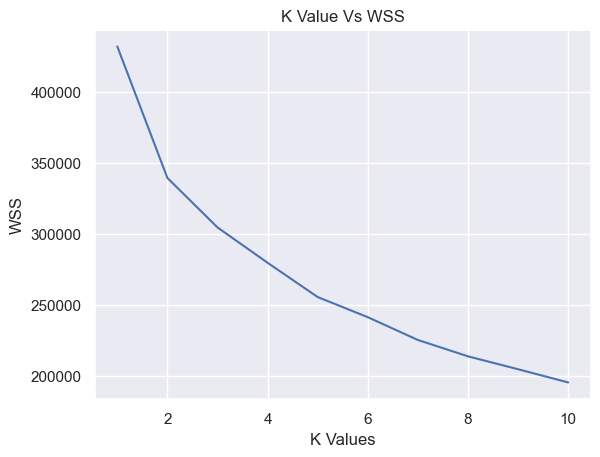

In [226]:
plt.plot(range(1,11), wss);
plt.xlabel('K Values')
plt.ylabel('WSS')
plt.title('K Value Vs WSS')
plt.show()

In [227]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [228]:
from sklearn.metrics import silhouette_samples, silhouette_score
ss={}
for i in range(2,11):
    k_means=KMeans(n_clusters=i,random_state=42)
    k_means.fit(df_cluster)
    y=k_means.labels_
    s=silhouette_score(df_cluster,y)
    ss[i]=round(s,5)
    print("The Average Silhouette Score for {}clusters is {}".format(i,round(s,5)))

The Average Silhouette Score for 2clusters is 0.75087
The Average Silhouette Score for 3clusters is 0.60746
The Average Silhouette Score for 4clusters is 0.59113
The Average Silhouette Score for 5clusters is 0.55596
The Average Silhouette Score for 6clusters is 0.55659
The Average Silhouette Score for 7clusters is 0.54056
The Average Silhouette Score for 8clusters is 0.53507
The Average Silhouette Score for 9clusters is 0.53562
The Average Silhouette Score for 10clusters is 0.52546


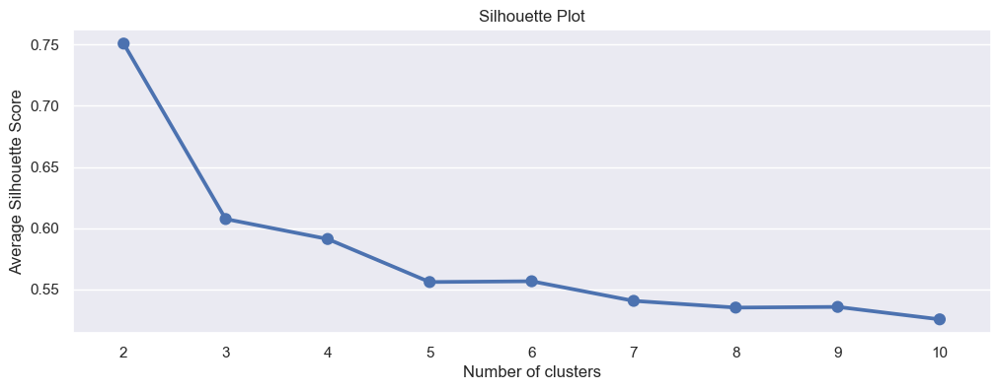

In [229]:
fig,ax =plt.subplots(figsize=(12,4))
sns.pointplot(list(ss.keys()),list(ss.values()))
ax.set_title('Silhouette Plot')
ax.set_xlabel('Number of clusters')
ax.set_ylabel('Average Silhouette Score')
plt.show()

In [230]:
k_means = KMeans(n_clusters =2,random_state=123)
k_means.fit(df_cluster1)
labels=k_means.labels_

In [231]:
df_cluster['Cluster'] = labels
df_cluster.head().T

,0,1,2,3,4
price,600000.00,190000.00,735000.00,257000.00,450000.00
room_bed,4.00,2.00,4.00,3.00,2.00
room_bath,1.75,1.00,2.75,2.50,1.00
living_measure,3050.00,670.00,3040.00,1740.00,1120.00
lot_measure,9440.00,3101.00,2415.00,3721.00,4590.00
ceil,1.00,1.00,2.00,2.00,1.00
coast,0.00,0.00,1.00,0.00,0.00
sight,0.00,0.00,4.00,0.00,0.00
condition,3.00,4.00,3.00,3.00,3.00
quality,8.00,6.00,8.00,8.00,7.00


## Cluster Profiling

In [232]:
df_cluster.groupby('Cluster').agg({'price':'mean', 'living_measure':'mean', 'lot_measure':'mean', 'quality':'mean','room_bath':'mean','room_bed':'mean','ceil':'mean','condition':'mean','years old':'mean'})



,price,living_measure,lot_measure,quality,room_bath,room_bed,ceil,condition,years old
Cluster,,,,,,,,,
0,419399.24,1676.66,7672.14,7.14,1.85,3.15,1.36,3.47,49.95
1,864873.85,3083.41,11482.38,9.04,2.77,3.92,1.85,3.25,25.48


In [233]:

df_cluster

,price,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,zipcode,lat,long,living_measure15,lot_measure15,furnished,years old,is_renovated,basement_present,Cluster
0,600000,4.00,1.75,3050.00,9440.00,1.00,0,0,3,8,1800.00,98034,47.72,-122.18,2020.00,8660.00,0,49.00,0,1,0
1,190000,2.00,1.00,670.00,3101.00,1.00,0,0,4,6,670.00,98118,47.55,-122.27,1660.00,4100.00,0,67.00,0,0,0
2,735000,4.00,2.75,3040.00,2415.00,2.00,1,4,3,8,3040.00,98118,47.52,-122.26,2620.00,2433.00,0,48.00,0,0,1
3,257000,3.00,2.50,1740.00,3721.00,2.00,0,0,3,8,1740.00,98002,47.34,-122.21,2030.00,3794.00,0,5.00,0,0,0
4,450000,2.00,1.00,1120.00,4590.00,1.00,0,0,3,7,1120.00,98118,47.57,-122.28,1120.00,5100.00,0,91.00,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,685530,4.00,2.50,3130.00,19160.00,2.00,0,0,3,9,3130.00,98014,47.66,-121.96,2780.00,17565.00,1,19.00,0,0,1
21609,535000,2.00,1.00,1030.00,4841.00,1.00,0,0,3,7,920.00,98103,47.69,-122.34,1530.00,4944.00,0,75.00,0,1,0
21610,998000,3.00,3.62,3710.00,19160.00,2.00,0,0,3,10,2910.00,98075,47.59,-122.04,2390.00,17565.00,1,36.00,0,1,1
21611,262000,4.00,2.50,1560.00,7800.00,2.00,0,0,3,7,1560.00,98168,47.51,-122.32,1160.00,7800.00,0,18.00,0,0,0


## Modelling

In [235]:
X_train.shape

(15129, 87)

In [236]:
X_train.head().T

,0,1,2,3,4
room_bed,-1.60,-1.60,-1.60,-0.42,-0.42
room_bath,0.55,-1.52,-1.52,0.20,-0.83
living_measure,-0.27,-0.81,-1.11,-0.29,-0.48
lot_measure,-1.16,-0.57,-0.35,0.93,-0.29
ceil,0.94,-0.91,0.01,-0.91,-0.91
...,...,...,...,...,...
zipcode_98177,-0.11,-0.11,-0.11,-0.11,-0.11
zipcode_98178,-0.10,-0.10,-0.10,-0.10,-0.10
zipcode_98188,-0.08,-0.08,-0.08,-0.08,-0.08
zipcode_98198,-0.11,-0.11,-0.11,-0.11,-0.11


In [237]:
X_test.shape

(6484, 87)

In [238]:
X_test

,room_bed,room_bath,living_measure,lot_measure,ceil,coast,sight,condition,quality,ceil_measure,lat,long,living_measure15,lot_measure15,furnished,years old,is_renovated,basement_present,zipcode_98002,zipcode_98003,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98032,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
0,-0.42,0.89,-0.13,0.71,-0.91,-0.08,-0.31,-0.62,-0.56,-0.68,1.29,-0.31,-0.15,0.85,-0.50,0.50,-0.21,1.24,-0.10,-0.12,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,8.64,-0.12,-0.11,-0.12,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
1,0.75,0.55,0.33,2.08,0.94,-0.08,-0.31,-2.16,0.29,0.74,-1.53,0.87,0.78,2.13,-0.50,-0.25,-0.21,-0.80,-0.10,-0.12,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,6.12,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
2,0.75,0.55,1.55,-0.20,0.94,-0.08,-0.31,-0.62,1.14,2.08,-0.89,0.73,1.67,-0.40,2.01,-1.03,-0.21,-0.80,-0.10,-0.12,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,6.87,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
3,0.75,0.89,0.30,-0.73,0.01,-0.08,-0.31,2.45,0.29,-0.38,-0.07,-0.38,-1.34,-0.76,-0.50,2.14,-0.21,1.24,-0.10,-0.12,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,6.47,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
4,-1.60,-1.52,-1.50,-0.43,-0.91,-0.08,-0.31,0.91,-1.41,-1.27,1.45,-1.02,-1.16,-0.30,-0.50,0.60,-0.21,-0.80,-0.10,-0.12,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.08,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,6.49,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [239]:
y_train.shape

(15129,)

In [240]:
y_train

0       13.17
1       12.68
2       12.69
3       13.15
4       12.32
         ... 
15124   12.80
15125   12.94
15126   13.21
15127   12.59
15128   13.46
Name: price, Length: 15129, dtype: float64

In [241]:
y_test.shape

(6484,)

In [242]:
y_test

0      12.87
1      12.58
2      13.03
3      13.17
4      12.59
        ... 
6479   12.64
6480   12.72
6481   12.60
6482   13.04
6483   12.92
Name: price, Length: 6484, dtype: float64

## OLS Modelling 

In [243]:
X_train_lr=sm.add_constant(X_train)# This adds the constant term beta0 to the Simple Linear Regression.


In [244]:
olsmod = sm.OLS(y_train, X_train_lr)
olsres = olsmod.fit()

In [245]:
# let's print the regression summary
print(olsres.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.881
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     1281.
Date:                Fri, 26 Jan 2024   Prob (F-statistic):               0.00
Time:                        20:50:49   Log-Likelihood:                 4294.1
No. Observations:               15129   AIC:                            -8412.
Df Residuals:                   15041   BIC:                            -7741.
Df Model:                          87                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.0482      0.001  

In [246]:
# let's check the VIF of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train_lr.values, i) for i in range(X_train_lr.shape[1])],
    index=X_train_lr.columns,
);
print("VIF values: \n\n{}\n".format(vif_series1.sort_values(ascending=False)));

VIF values: 

lat              65.33
long             32.19
zipcode_98034    17.21
living_measure   17.02
ceil_measure     16.84
                  ... 
condition         1.33
zipcode_98148     1.26
coast             1.23
is_renovated      1.18
const             1.00
Length: 88, dtype: float64



In [247]:
X_train1 = X_train_lr.drop(['lat'], axis=1)
olsmod_1 = sm.OLS(y_train, X_train1)
olsres_1 = olsmod_1.fit()
print(
    "R-squared:",
    np.round(olsres_1.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_1.rsquared_adj, 3),
)

R-squared: 0.881 
Adjusted R-squared: 0.88


In [248]:
# let's check the VIF of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series1 = pd.Series(
    [variance_inflation_factor(X_train1.values, i) for i in range(X_train1.shape[1])],
    index=X_train1.columns,
);
print("VIF values: \n\n{}\n".format(vif_series1.sort_values(ascending=False)));

VIF values: 

long             32.09
living_measure   17.02
ceil_measure     16.84
lot_measure15     6.76
lot_measure       6.23
                  ... 
coast             1.22
zipcode_98039     1.19
is_renovated      1.18
zipcode_98148     1.14
const             1.00
Length: 87, dtype: float64



In [249]:
X_train2 = X_train1.drop(['long'], axis=1)
olsmod_2 = sm.OLS(y_train, X_train2)
olsres_2 = olsmod_2.fit()
print(
    "R-squared:",
    np.round(olsres_2.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_2.rsquared_adj, 3),
)

R-squared: 0.88 
Adjusted R-squared: 0.88


In [250]:
print(olsres_2.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.880
Model:                            OLS   Adj. R-squared:                  0.880
Method:                 Least Squares   F-statistic:                     1302.
Date:                Fri, 26 Jan 2024   Prob (F-statistic):               0.00
Time:                        20:51:13   Log-Likelihood:                 4247.1
No. Observations:               15129   AIC:                            -8322.
Df Residuals:                   15043   BIC:                            -7667.
Df Model:                          85                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.0482      0.001  

In [251]:
# let's check the VIF of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series2 = pd.Series(
    [variance_inflation_factor(X_train2.values, i) for i in range(X_train2.shape[1])],
    index=X_train2.columns,
);
print("VIF values: \n\n{}\n".format(vif_series2.sort_values(ascending=False)));

VIF values: 

living_measure   17.02
ceil_measure     16.84
lot_measure15     6.74
lot_measure       6.23
quality           5.09
                  ... 
coast             1.22
zipcode_98039     1.18
is_renovated      1.18
zipcode_98148     1.13
const             1.00
Length: 86, dtype: float64



In [252]:
X_train3 = X_train2.drop(['living_measure'], axis=1)
olsmod_3 = sm.OLS(y_train, X_train3)
olsres_3 = olsmod_3.fit()
print(
    "R-squared:",
    np.round(olsres_3.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_3.rsquared_adj, 3),
)

R-squared: 0.878 
Adjusted R-squared: 0.878


In [253]:
print(olsres_3.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.878
Model:                            OLS   Adj. R-squared:                  0.878
Method:                 Least Squares   F-statistic:                     1293.
Date:                Fri, 26 Jan 2024   Prob (F-statistic):               0.00
Time:                        20:51:26   Log-Likelihood:                 4120.4
No. Observations:               15129   AIC:                            -8071.
Df Residuals:                   15044   BIC:                            -7423.
Df Model:                          84                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.0482      0.002  

In [254]:
# let's check the VIF of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series3 = pd.Series(
    [variance_inflation_factor(X_train3.values, i) for i in range(X_train3.shape[1])],
    index=X_train3.columns,
);
print("VIF values: \n\n{}\n".format(vif_series3.sort_values(ascending=False)));

VIF values: 

lot_measure15      6.74
lot_measure        6.21
ceil_measure       5.75
quality            5.08
living_measure15   3.38
                   ... 
coast              1.22
zipcode_98039      1.18
is_renovated       1.18
zipcode_98148      1.13
const              1.00
Length: 85, dtype: float64



In [255]:
X_train4 = X_train3.drop(['lot_measure15'], axis=1)
olsmod_4 = sm.OLS(y_train, X_train4)
olsres_4 = olsmod_4.fit()
print(
    "R-squared:",
    np.round(olsres_4.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_4.rsquared_adj, 3),
)

R-squared: 0.878 
Adjusted R-squared: 0.878


In [256]:
print(olsres_4.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.878
Model:                            OLS   Adj. R-squared:                  0.878
Method:                 Least Squares   F-statistic:                     1308.
Date:                Fri, 26 Jan 2024   Prob (F-statistic):               0.00
Time:                        20:51:39   Log-Likelihood:                 4120.4
No. Observations:               15129   AIC:                            -8073.
Df Residuals:                   15045   BIC:                            -7432.
Df Model:                          83                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.0482      0.002  

In [257]:
# let's check the VIF of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series4 = pd.Series(
    [variance_inflation_factor(X_train4.values, i) for i in range(X_train4.shape[1])],
    index=X_train4.columns,
);
print("VIF values: \n\n{}\n".format(vif_series4.sort_values(ascending=False)));

VIF values: 

ceil_measure       5.75
quality            5.08
living_measure15   3.34
room_bath          3.29
years old          3.17
                   ... 
coast              1.22
zipcode_98039      1.18
is_renovated       1.18
zipcode_98148      1.13
const              1.00
Length: 84, dtype: float64



In [258]:
X_train5 = X_train4.drop(['ceil_measure'], axis=1)
olsmod_5 = sm.OLS(y_train, X_train5)
olsres_5 = olsmod_5.fit()
print(
    "R-squared:",
    np.round(olsres_5.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_5.rsquared_adj, 3),
)

R-squared: 0.86 
Adjusted R-squared: 0.859


In [259]:
# let's check the VIF of the predictors
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series5 = pd.Series(
    [variance_inflation_factor(X_train5.values, i) for i in range(X_train5.shape[1])],
    index=X_train5.columns,
);
print("VIF values: \n\n{}\n".format(vif_series5.sort_values(ascending=False)));

VIF values: 

quality            4.73
years old          3.12
room_bath          3.04
living_measure15   2.95
furnished          2.85
                   ... 
coast              1.22
zipcode_98039      1.18
is_renovated       1.18
zipcode_98148      1.13
const              1.00
Length: 83, dtype: float64



In [260]:
print(olsres_5.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.860
Model:                            OLS   Adj. R-squared:                  0.859
Method:                 Least Squares   F-statistic:                     1129.
Date:                Fri, 26 Jan 2024   Prob (F-statistic):               0.00
Time:                        20:52:03   Log-Likelihood:                 3070.4
No. Observations:               15129   AIC:                            -5975.
Df Residuals:                   15046   BIC:                            -5342.
Df Model:                          82                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.0482      0.002  

In [261]:
X_train6 = X_train5.drop(['zipcode_98003'], axis=1)
olsmod_6 = sm.OLS(y_train, X_train6)
olsres_6 = olsmod_6.fit()
print(
    "R-squared:",
    np.round(olsres_6.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_6.rsquared_adj, 3),
)

R-squared: 0.86 
Adjusted R-squared: 0.859


In [262]:
print(olsres_6.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.860
Model:                            OLS   Adj. R-squared:                  0.859
Method:                 Least Squares   F-statistic:                     1143.
Date:                Fri, 26 Jan 2024   Prob (F-statistic):               0.00
Time:                        20:52:03   Log-Likelihood:                 3070.2
No. Observations:               15129   AIC:                            -5976.
Df Residuals:                   15047   BIC:                            -5351.
Df Model:                          81                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.0482      0.002  

In [263]:
X_train7 = X_train6.drop(['zipcode_98002'], axis=1)
olsmod_7 = sm.OLS(y_train, X_train7)
olsres_7 = olsmod_7.fit()
print(
    "R-squared:",
    np.round(olsres_7.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_7.rsquared_adj, 3),
)

R-squared: 0.86 
Adjusted R-squared: 0.859


In [264]:
print(olsres_7.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.860
Model:                            OLS   Adj. R-squared:                  0.859
Method:                 Least Squares   F-statistic:                     1157.
Date:                Fri, 26 Jan 2024   Prob (F-statistic):               0.00
Time:                        20:52:03   Log-Likelihood:                 3069.9
No. Observations:               15129   AIC:                            -5978.
Df Residuals:                   15048   BIC:                            -5360.
Df Model:                          80                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.0482      0.002  

In [265]:
X_train8 = X_train7.drop(['zipcode_98032'], axis=1)
olsmod_8 = sm.OLS(y_train, X_train8)
olsres_8 = olsmod_8.fit()
print(
    "R-squared:",
    np.round(olsres_8.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_8.rsquared_adj, 3),
)

R-squared: 0.86 
Adjusted R-squared: 0.859


In [266]:
print(olsres_8.summary())

                            OLS Regression Results                            
Dep. Variable:                  price   R-squared:                       0.860
Model:                            OLS   Adj. R-squared:                  0.859
Method:                 Least Squares   F-statistic:                     1172.
Date:                Fri, 26 Jan 2024   Prob (F-statistic):               0.00
Time:                        20:52:04   Log-Likelihood:                 3069.3
No. Observations:               15129   AIC:                            -5979.
Df Residuals:                   15049   BIC:                            -5369.
Df Model:                          79                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               13.0482      0.002  

In [267]:
from statsmodels.formula.api import ols

In [268]:
import pylab
import scipy.stats as stats


In [269]:
price_df_pred = pd.DataFrame()

price_df_pred["Actual Values"] = y_train.values.flatten()  # actual values
price_df_pred["Fitted Values"] = olsres_8.fittedvalues.values  # predicted values
price_df_pred["Residuals"] = olsres_8.resid.values  # residuals

price_df_pred.head(10)

,Actual Values,Fitted Values,Residuals
0,13.17,12.93,0.25
1,12.68,13.11,-0.44
2,12.69,12.44,0.25
3,13.15,13.16,-0.01
4,12.32,12.42,-0.09
5,14.39,14.03,0.37
6,14.22,13.88,0.34
7,12.91,13.04,-0.13
8,12.49,12.37,0.12
9,12.82,12.70,0.12


In [270]:
X_traincols=X_train8.columns

In [271]:
X_traincols

Index(['const', 'room_bed', 'room_bath', 'lot_measure', 'ceil', 'coast',
       'sight', 'condition', 'quality', 'living_measure15', 'furnished',
       'years old', 'is_renovated', 'basement_present', 'zipcode_98004',
       'zipcode_98005', 'zipcode_98006', 'zipcode_98007', 'zipcode_98008',
       'zipcode_98010', 'zipcode_98011', 'zipcode_98014', 'zipcode_98019',
       'zipcode_98022', 'zipcode_98023', 'zipcode_98024', 'zipcode_98027',
       'zipcode_98028', 'zipcode_98029', 'zipcode_98030', 'zipcode_98031',
       'zipcode_98033', 'zipcode_98034', 'zipcode_98038', 'zipcode_98039',
       'zipcode_98040', 'zipcode_98042', 'zipcode_98045', 'zipcode_98052',
       'zipcode_98053', 'zipcode_98055', 'zipcode_98056', 'zipcode_98058',
       'zipcode_98059', 'zipcode_98065', 'zipcode_98070', 'zipcode_98072',
       'zipcode_98074', 'zipcode_98075', 'zipcode_98077', 'zipcode_98092',
       'zipcode_98102', 'zipcode_98103', 'zipcode_98105', 'zipcode_98106',
       'zipcode_98107', 'zipcod

In [272]:
X_test_lr1=X_test.drop(['lat',
'long',
'living_measure',
'lot_measure15',
'ceil_measure',
'zipcode_98003',
'zipcode_98002',
'zipcode_98032'],axis=1)

In [273]:
X_test_lr1=sm.add_constant(X_test_lr1)

In [274]:
X_test_lr1

,const,room_bed,room_bath,lot_measure,ceil,coast,sight,condition,quality,living_measure15,furnished,years old,is_renovated,basement_present,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
0,1.00,-0.42,0.89,0.71,-0.91,-0.08,-0.31,-0.62,-0.56,-0.15,-0.50,0.50,-0.21,1.24,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,8.64,-0.12,-0.11,-0.12,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
1,1.00,0.75,0.55,2.08,0.94,-0.08,-0.31,-2.16,0.29,0.78,-0.50,-0.25,-0.21,-0.80,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.14,-0.16,-0.17,-0.05,-0.11,6.12,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
2,1.00,0.75,0.55,-0.20,0.94,-0.08,-0.31,-0.62,1.14,1.67,2.01,-1.03,-0.21,-0.80,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,6.87,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
3,1.00,0.75,0.89,-0.73,0.01,-0.08,-0.31,2.45,0.29,-1.34,-0.50,2.14,-0.21,1.24,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,6.47,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
4,1.00,-1.60,-1.52,-0.43,-0.91,-0.08,-0.31,0.91,-1.41,-1.16,-0.50,0.60,-0.21,-0.80,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,6.49,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6479,1.00,-0.42,-0.49,2.08,-0.91,-0.08,-0.31,-0.62,-0.56,0.19,-0.50,-0.11,-0.21,-0.80,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-

In [275]:
X_train8

,const,room_bed,room_bath,lot_measure,ceil,coast,sight,condition,quality,living_measure15,furnished,years old,is_renovated,basement_present,zipcode_98004,zipcode_98005,zipcode_98006,zipcode_98007,zipcode_98008,zipcode_98010,zipcode_98011,zipcode_98014,zipcode_98019,zipcode_98022,zipcode_98023,zipcode_98024,zipcode_98027,zipcode_98028,zipcode_98029,zipcode_98030,zipcode_98031,zipcode_98033,zipcode_98034,zipcode_98038,zipcode_98039,zipcode_98040,zipcode_98042,zipcode_98045,zipcode_98052,zipcode_98053,zipcode_98055,zipcode_98056,zipcode_98058,zipcode_98059,zipcode_98065,zipcode_98070,zipcode_98072,zipcode_98074,zipcode_98075,zipcode_98077,zipcode_98092,zipcode_98102,zipcode_98103,zipcode_98105,zipcode_98106,zipcode_98107,zipcode_98108,zipcode_98109,zipcode_98112,zipcode_98115,zipcode_98116,zipcode_98117,zipcode_98118,zipcode_98119,zipcode_98122,zipcode_98125,zipcode_98126,zipcode_98133,zipcode_98136,zipcode_98144,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
0,1.00,-1.60,0.55,-1.16,0.94,-0.08,-0.31,-0.62,-0.56,-0.19,-0.50,-1.17,-0.21,-0.80,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,8.25,-0.11,-0.12,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
1,1.00,-1.60,-1.52,-0.57,-0.91,-0.08,-0.31,-0.62,-0.56,-0.67,-0.50,1.80,4.70,-0.80,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,6.14,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
2,1.00,-1.60,-1.52,-0.35,0.01,-0.08,-0.31,-0.62,-1.41,-1.27,-0.50,0.91,-0.21,-0.80,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,6.80,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
3,1.00,-0.42,0.20,0.93,-0.91,-0.08,-0.31,-0.62,0.29,0.12,-0.50,-0.18,-0.21,1.24,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,7.48,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,-0.11,-0.11,-0.10,-0.08,-0.11,-0.12
4,1.00,-0.42,-0.83,-0.29,-0.91,-0.08,-0.31,-0.62,-0.56,-0.31,-0.50,0.30,-0.21,1.24,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-0.10,-0.17,-0.14,-0.11,-0.14,-0.15,-0.15,-0.12,-0.07,-0.11,-0.14,-0.13,-0.10,-0.13,-0.07,-0.17,-0.10,-0.13,-0.11,-0.09,-0.07,-0.11,-0.17,-0.13,-0.16,-0.15,-0.09,-0.12,-0.14,-0.13,-0.15,-0.11,-0.12,-0.11,-0.05,-0.15,-0.11,8.73,-0.11,-0.10,-0.08,-0.11,-0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15124,1.00,1.92,1.24,-1.13,0.94,-0.08,-0.31,-0.62,-0.56,-0.47,-0.50,-0.93,-0.21,-0.80,-0.12,-0.09,-0.15,-0.08,-0.11,-0.07,-0.09,-0.08,-0.09,-0.10,-0.16,-0.06,-0.14,-0.12,-0.12,-0.11,-0.12,-0.14,-0.16,-0.17,-0.05,-0.11,-0.16,-

In [276]:
y_pred_test = olsres_8.predict(X_test_lr1)


In [277]:
y_pred_train = olsres_8.predict(X_train8)

In [278]:
rmse1 = np.sqrt(mean_squared_error(y_train, y_pred_train))
rmse1

0.19754038877436458

In [279]:
# let's check the RMSE on the test data
rmse2 = np.sqrt(mean_squared_error(y_test, y_pred_test))
rmse2

0.19928350263593797

In [280]:
olsmod_10 = sm.OLS(y_test, X_test_lr1)
olsres_10 = olsmod_10.fit()
print(
    "R-squared:",
    np.round(olsres_10.rsquared, 3),
    "\nAdjusted R-squared:",
    np.round(olsres_10.rsquared_adj, 3),
)

R-squared: 0.858 
Adjusted R-squared: 0.857


In [281]:
regression_model = LinearRegression()
regression_model.fit(X_train8, y_train)

LinearRegression()

In [282]:
print('The coefficient of determination R^2 of the prediction on Train set',regression_model.score(X_train8, y_train))

The coefficient of determination R^2 of the prediction on Train set 0.8601766779579169


In [283]:
print('The coefficient of determination R^2 of the prediction on Test set',regression_model.score(X_test_lr1, y_test))

The coefficient of determination R^2 of the prediction on Test set 0.8550073336962918


In [284]:
print("The Root Mean Square Error (RMSE) of the model is for testing set is",np.sqrt(mean_squared_error(y_test,regression_model.predict(X_test_lr1))))

The Root Mean Square Error (RMSE) of the model is for testing set is 0.19928350263593791


In [285]:
print("The Root Mean Square Error (RMSE) of the model is for training set is",np.sqrt(mean_squared_error(y_train,regression_model.predict(X_train8))))

The Root Mean Square Error (RMSE) of the model is for training set is 0.19754038877436458


### Residual PLots

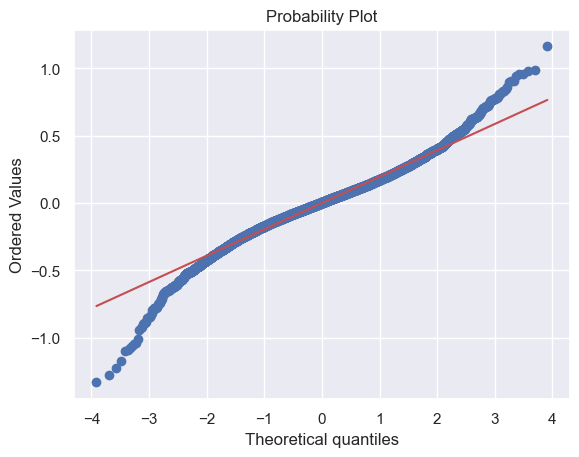

In [286]:

stats.probplot(price_df_pred["Residuals"], dist="norm", plot=pylab)
plt.show()


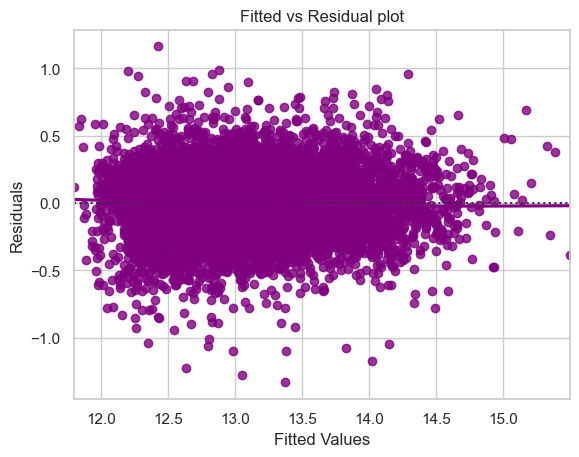

In [287]:
# let us plot the fitted values vs residuals
sns.set_style("whitegrid")
sns.residplot(
    data=price_df_pred, x="Fitted Values", y="Residuals", color="purple", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

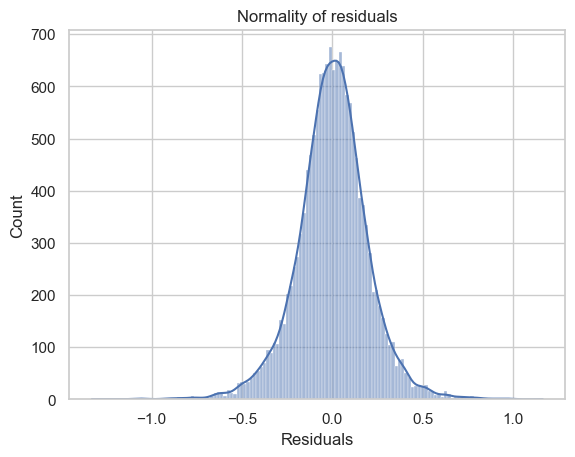

In [288]:
sns.histplot(price_df_pred["Residuals"], kde=True)
plt.title("Normality of residuals")
plt.show()


The Shapiro-Wilk test can also be used for checking the normality. The null and alternate hypotheses of the test are as follows:

Null hypothesis - Data is normally distributed.
Alternate hypothesis - Data is not normally distributed.
sta

In [289]:
stats.shapiro(price_df_pred["Residuals"])

ShapiroResult(statistic=0.9792096018791199, pvalue=6.974262456944615e-42)

Heteroscedasticity

The null and alternate hypotheses of the goldfeldquandt test are as follows:

Null hypothesis : Residuals are homoscedastic
Alternate hypothesis : Residuals have hetroscedasticity

In [290]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip


In [291]:
name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(price_df_pred["Residuals"], X_train8)
lzip(name, test)


[('F statistic', 0.9467400944390056), ('p-value', 0.9910390758884714)]

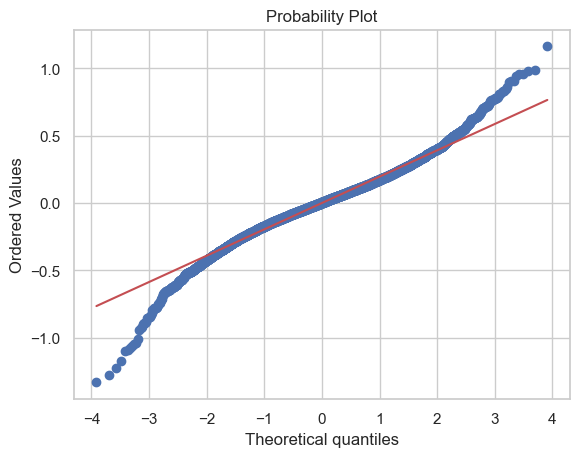

In [292]:
import pylab
import scipy.stats as stats

stats.probplot(price_df_pred["Residuals"], dist="norm", plot=pylab)
plt.show()


Q-Q Plot

### Linear Coefficinets from OLS Model

In [293]:
olsres_8.params.sort_values(ascending=False)

const           13.05
quality          0.15
zipcode_98115    0.13
zipcode_98004    0.13
zipcode_98103    0.13
                 ... 
zipcode_98188    0.01
zipcode_98030    0.01
zipcode_98022    0.01
zipcode_98092    0.00
zipcode_98023   -0.01
Length: 80, dtype: float64

In [294]:
# Let us write the equation of linear regression
Equation = "price="
print(Equation, end=" ")
for i in range(len(X_train8.columns)):
    if i == 0:
        print(olsres_8.params[i], "+", end=" ")
    elif i != len(X_train8.columns) - 1:
        print(
            olsres_8.params[i],
            "* (",
            X_train8.columns[i],
            ")",
            "+",
            end="  ",
        )
    else:
        print(olsres_8.params[i], "* (", X_train8.columns[i], ")")


price= 13.048161214389463 + 0.03088232900719387 * ( room_bed ) +  0.07821892598107728 * ( room_bath ) +  0.046313186377569204 * ( lot_measure ) +  0.010949903496800535 * ( ceil ) +  0.040533201399220536 * ( coast ) +  0.0450261219130884 * ( sight ) +  0.0328959420917967 * ( condition ) +  0.15295131795429207 * ( quality ) +  0.10049307879300473 * ( living_measure15 ) +  0.012019742155220461 * ( furnished ) +  0.031001224119803772 * ( years old ) +  0.015228249547542993 * ( is_renovated ) +  0.007788372314868848 * ( basement_present ) +  0.1303719209457837 * ( zipcode_98004 ) +  0.05656317241059215 * ( zipcode_98005 ) +  0.08747794672174236 * ( zipcode_98006 ) +  0.049803239717505665 * ( zipcode_98007 ) +  0.07299230469493362 * ( zipcode_98008 ) +  0.01785959176109616 * ( zipcode_98010 ) +  0.04105457787233378 * ( zipcode_98011 ) +  0.0260615302201489 * ( zipcode_98014 ) +  0.031504342768336954 * ( zipcode_98019 ) +  0.00594273261152079 * ( zipcode_98022 ) +  -0.005425618352092501 * ( z

## LR Model

In [219]:
def calculate_mape(actual, forecast):
    if len(actual) != len(forecast):
        raise ValueError("Lengths of actual and forecast lists must be the same.")
    n = len(actual)
    mape = sum([abs((actual[i] - forecast[i]) / actual[i]) for i in range(n)]) / n * 100
    return mape

In [220]:
pd.options.display.float_format = "{:,.4f}".format

## Linear Regression

In [237]:
LR1 = LinearRegression()
LR1.fit(X_train, y_train)
#predicting result over test data
y_LR1_predtr= LR1.predict(X_train)
y_LR1_predvl= LR1.predict(X_test)
LR1.coef_
#Model score and Deduction for each Model in a DataFrame
LR1_trscore=r2_score(y_train,y_LR1_predtr)
LR1_trRMSE=np.sqrt(mean_squared_error(y_train, y_LR1_predtr))
LR1_trMSE=mean_squared_error(y_train, y_LR1_predtr)
LR1_trMAE=mean_absolute_error(y_train, y_LR1_predtr)
LR1_trMAPE=calculate_mape(y_train, y_LR1_predtr)
LR1_vlscore=r2_score(y_test,y_LR1_predvl)
LR1_vlRMSE=np.sqrt(mean_squared_error(y_test, y_LR1_predvl))
LR1_vlMSE=mean_squared_error(y_test, y_LR1_predvl)
LR1_vlMAE=mean_absolute_error(y_test, y_LR1_predvl)
LR1_vlMAPE=calculate_mape(y_test, y_LR1_predvl)

lr_df=pd.DataFrame({'Method':['Linear Reg Model1'],'Val Score':LR1_vlscore,'RMSE_vl': LR1_vlRMSE, 'MSE_vl': LR1_vlMSE, 'MAE_vl': LR1_vlMAE,'MAPE_vl': LR1_vlMAPE,'train Score':LR1_trscore,'RMSE_tr': LR1_trRMSE, 'MSE_tr': LR1_trMSE, 'MAE_tr': LR1_trMAE, 'MAPE_tr': LR1_trMAPE})
#Compa_df = Compa_df[['Method', 'Test Score', 'RMSE', 'MSE', 'MAE']]
lr_df.round(4)



,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,Linear Reg Model1,0.8750,0.1850,0.0342,0.1366,1.0504,0.8811,0.1822,0.0332,0.1343,1.0316


In [238]:
coeff=LR1.coef_

In [239]:
LR1.intercept_

13.04816121438947

In [240]:
coeff

array([-0.00599774,  0.03367578,  0.09818274,  0.02808415, -0.01481253,
        0.03953127,  0.04619736,  0.03397006,  0.10684115,  0.09140783,
        0.0748381 , -0.05940879,  0.04939332,  0.00305273, -0.00561307,
        0.01205837,  0.01427874,  0.01697057,  0.00177847,  0.00033137,
        0.11618152,  0.05004855,  0.0809448 ,  0.04373283,  0.06411758,
        0.02399481,  0.02264355,  0.02428091,  0.02224914,  0.02348116,
       -0.00962161,  0.03112785,  0.06516457,  0.02254567,  0.07157331,
        0.0078127 ,  0.00927795, -0.00359762,  0.08761441,  0.05610531,
        0.04027819,  0.05662737,  0.08356709,  0.01761419,  0.04793841,
        0.08093494,  0.06673999,  0.01151873,  0.03455413,  0.02319137,
        0.04305982,  0.05506401,  0.01594001,  0.03340859,  0.06748281,
        0.06480536,  0.02808619,  0.01027213,  0.05468548,  0.09946306,
        0.07653282,  0.02489041,  0.06932067,  0.02219257,  0.05662475,
        0.09714713,  0.10148753,  0.07239119,  0.09288667,  0.05

In [241]:
coeff=[-0.00599774,  0.03367578,  0.09818274,  0.02808415, -0.01481253,
        0.03953127,  0.04619736,  0.03397006,  0.10684115,  0.09140783,
        0.0748381 , -0.05940879,  0.04939332,  0.00305273, -0.00561307,
        0.01205837,  0.01427874,  0.01697057,  0.00177847,  0.00033137,
        0.11618152,  0.05004855,  0.0809448 ,  0.04373283,  0.06411758,
        0.02399481,  0.02264355,  0.02428091,  0.02224914,  0.02348116,
       -0.00962161,  0.03112785,  0.06516457,  0.02254567,  0.07157331,
        0.0078127 ,  0.00927795, -0.00359762,  0.08761441,  0.05610531,
        0.04027819,  0.05662737,  0.08356709,  0.01761419,  0.04793841,
        0.08093494,  0.06673999,  0.01151873,  0.03455413,  0.02319137,
        0.04305982,  0.05506401,  0.01594001,  0.03340859,  0.06748281,
        0.06480536,  0.02808619,  0.01027213,  0.05468548,  0.09946306,
        0.07653282,  0.02489041,  0.06932067,  0.02219257,  0.05662475,
        0.09714713,  0.10148753,  0.07239119,  0.09288667,  0.0529049 ,
        0.07261986,  0.07729716,  0.04720782,  0.05094227,  0.03314932,
        0.05583244,  0.0644357 ,  0.01561085,  0.00463064,  0.02505404,
        0.02131139, -0.0029882 ,  0.03388983,  0.00659915,  0.00147898,
        0.00174738,  0.077246 ]

In [242]:
columns=X_train.columns

In [243]:
columns

Index(['room_bed', 'room_bath', 'living_measure', 'lot_measure', 'ceil',
       'coast', 'sight', 'condition', 'quality', 'ceil_measure', 'lat', 'long',
       'living_measure15', 'lot_measure15', 'furnished', 'years old',
       'is_renovated', 'basement_present', 'zipcode_98002', 'zipcode_98003',
       'zipcode_98004', 'zipcode_98005', 'zipcode_98006', 'zipcode_98007',
       'zipcode_98008', 'zipcode_98010', 'zipcode_98011', 'zipcode_98014',
       'zipcode_98019', 'zipcode_98022', 'zipcode_98023', 'zipcode_98024',
       'zipcode_98027', 'zipcode_98028', 'zipcode_98029', 'zipcode_98030',
       'zipcode_98031', 'zipcode_98032', 'zipcode_98033', 'zipcode_98034',
       'zipcode_98038', 'zipcode_98039', 'zipcode_98040', 'zipcode_98042',
       'zipcode_98045', 'zipcode_98052', 'zipcode_98053', 'zipcode_98055',
       'zipcode_98056', 'zipcode_98058', 'zipcode_98059', 'zipcode_98065',
       'zipcode_98070', 'zipcode_98072', 'zipcode_98074', 'zipcode_98075',
       'zipcode_98077', '

In [244]:
columns=['room_bed', 'room_bath', 'living_measure', 'lot_measure', 'ceil',
       'coast', 'sight', 'condition', 'quality', 'ceil_measure', 'lat', 'long',
       'living_measure15', 'lot_measure15', 'furnished', 'years old',
       'is_renovated', 'basement_present', 'zipcode_98002', 'zipcode_98003',
       'zipcode_98004', 'zipcode_98005', 'zipcode_98006', 'zipcode_98007',
       'zipcode_98008', 'zipcode_98010', 'zipcode_98011', 'zipcode_98014',
       'zipcode_98019', 'zipcode_98022', 'zipcode_98023', 'zipcode_98024',
       'zipcode_98027', 'zipcode_98028', 'zipcode_98029', 'zipcode_98030',
       'zipcode_98031', 'zipcode_98032', 'zipcode_98033', 'zipcode_98034',
       'zipcode_98038', 'zipcode_98039', 'zipcode_98040', 'zipcode_98042',
       'zipcode_98045', 'zipcode_98052', 'zipcode_98053', 'zipcode_98055',
       'zipcode_98056', 'zipcode_98058', 'zipcode_98059', 'zipcode_98065',
       'zipcode_98070', 'zipcode_98072', 'zipcode_98074', 'zipcode_98075',
       'zipcode_98077', 'zipcode_98092', 'zipcode_98102', 'zipcode_98103',
       'zipcode_98105', 'zipcode_98106', 'zipcode_98107', 'zipcode_98108',
       'zipcode_98109', 'zipcode_98112', 'zipcode_98115', 'zipcode_98116',
       'zipcode_98117', 'zipcode_98118', 'zipcode_98119', 'zipcode_98122',
       'zipcode_98125', 'zipcode_98126', 'zipcode_98133', 'zipcode_98136',
       'zipcode_98144', 'zipcode_98146', 'zipcode_98148', 'zipcode_98155',
       'zipcode_98166', 'zipcode_98168', 'zipcode_98177', 'zipcode_98178',
       'zipcode_98188', 'zipcode_98198', 'zipcode_98199']

### Feature importances 

In [245]:
x = pd.DataFrame({ 'Features': columns,'Coefficient Values': coeff}, columns=['Features', 'Coefficient Values'])



In [246]:
pd.options.display.max_rows = None
x.sort_values(by='Coefficient Values',ascending=False)


,Features,Coefficient Values
20,zipcode_98004,0.1162
8,quality,0.1068
66,zipcode_98115,0.1015
59,zipcode_98103,0.0995
2,living_measure,0.0982
65,zipcode_98112,0.0971
68,zipcode_98117,0.0929
9,ceil_measure,0.0914
38,zipcode_98033,0.0876
42,zipcode_98040,0.0836


Text(0.5, 1.0, 'Features Importance ')

<Figure size 800x800 with 0 Axes>

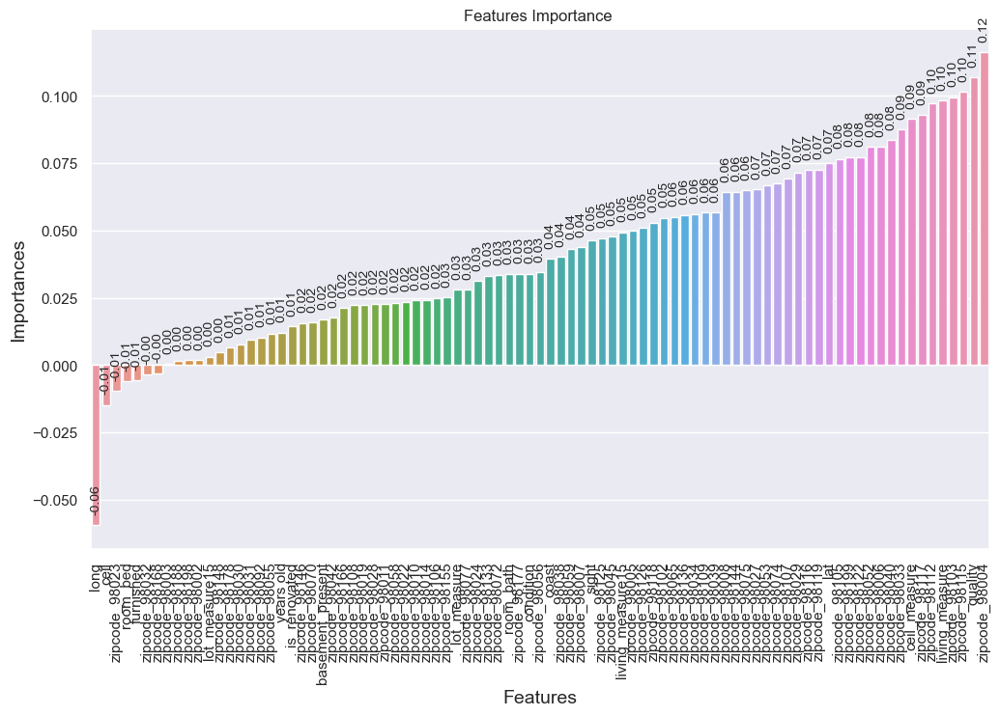

In [247]:
# Defining the plot size
plt.figure(figsize=(8, 8))
x=pd.DataFrame(coeff,columns).sort_values(by=0,ascending=True)
plt.figure(figsize=(12,7))

# Defining the values for x-axis, y-axis
# and from which dataframe the values are to be picked
plots = sns.barplot(x.index,x[0],data=x) 
 
# Iterating over the bars one-by-one
for bar in plots.patches:
   
  # Using Matplotlib's annotate function and
  # passing the coordinates where the annotation shall be done
  # x-coordinate: bar.get_x() + bar.get_width() / 2
  # y-coordinate: bar.get_height()
  # free space to be left to make graph pleasing: (0, 8)
  # ha and va stand for the horizontal and vertical alignment
    plots.annotate(format(bar.get_height(), '.2f'), 
                   (bar.get_x() + bar.get_width() / 2, 
                    bar.get_height()), ha='center', va='bottom',
                   size=10, xytext=(0, 8),
                   textcoords='offset points',rotation=90)
 
# Setting the label for x-axis
plt.xlabel("Features", size=14)
plt.xticks(rotation=90)
# Setting the label for y-axis
plt.ylabel("Importances", size=14)
 
# Setting the title for the graph
plt.title("Features Importance ")

### Linear Equation

In [248]:
# Let us write the equation of linear regression
Equation = "price= 13.04 +"
print(Equation, end=" ")
for i in range(len(X_train.columns)):
    if i ==-1:
        print(coeff[i], "+", end=" ")
    elif i != len(X_train.columns) - 1:
        print(
            coeff[i],
            "* (",
            X_train.columns[i],
            ")",
            "+",
            end="  ",
        )
    else:
        print(coeff[i], "* (", X_train.columns[i], ")")


price= 13.04 + -0.00599774 * ( room_bed ) +  0.03367578 * ( room_bath ) +  0.09818274 * ( living_measure ) +  0.02808415 * ( lot_measure ) +  -0.01481253 * ( ceil ) +  0.03953127 * ( coast ) +  0.04619736 * ( sight ) +  0.03397006 * ( condition ) +  0.10684115 * ( quality ) +  0.09140783 * ( ceil_measure ) +  0.0748381 * ( lat ) +  -0.05940879 * ( long ) +  0.04939332 * ( living_measure15 ) +  0.00305273 * ( lot_measure15 ) +  -0.00561307 * ( furnished ) +  0.01205837 * ( years old ) +  0.01427874 * ( is_renovated ) +  0.01697057 * ( basement_present ) +  0.00177847 * ( zipcode_98002 ) +  0.00033137 * ( zipcode_98003 ) +  0.11618152 * ( zipcode_98004 ) +  0.05004855 * ( zipcode_98005 ) +  0.0809448 * ( zipcode_98006 ) +  0.04373283 * ( zipcode_98007 ) +  0.06411758 * ( zipcode_98008 ) +  0.02399481 * ( zipcode_98010 ) +  0.02264355 * ( zipcode_98011 ) +  0.02428091 * ( zipcode_98014 ) +  0.02224914 * ( zipcode_98019 ) +  0.02348116 * ( zipcode_98022 ) +  -0.00962161 * ( zipcode_98023 )

## Ridge model

In [249]:


Ridge1 = Ridge(alpha=20)
Ridge1.fit(X_train, y_train)
#predicting result over test data
y_Ridge1_predtr= Ridge1.predict(X_train)
y_Ridge1_predvl= Ridge1.predict(X_test)
Ridge1.coef_
#Model score and Deduction for each Model in a DataFrame
Ridge1_trscore=r2_score(y_train,y_Ridge1_predtr)
Ridge1_trRMSE=np.sqrt(mean_squared_error(y_train, y_Ridge1_predtr))
Ridge1_trMSE=mean_squared_error(y_train, y_Ridge1_predtr)
Ridge1_trMAE=mean_absolute_error(y_train, y_Ridge1_predtr)
Ridge1_trMAPE=calculate_mape(y_train, y_Ridge1_predtr)
Ridge1_vlscore=r2_score(y_test,y_Ridge1_predvl)
Ridge1_vlRMSE=np.sqrt(mean_squared_error(y_test, y_Ridge1_predvl))
Ridge1_vlMSE=mean_squared_error(y_test, y_Ridge1_predvl)
Ridge1_vlMAE=mean_absolute_error(y_test, y_Ridge1_predvl)
Ridge1_vlMAPE=calculate_mape(y_test, y_Ridge1_predvl)
Ridge1_df=pd.DataFrame({'Method':['Linear-Reg Ridge1'],'Val Score':Ridge1_vlscore,'RMSE_vl': Ridge1_vlRMSE, 'MSE_vl': Ridge1_vlMSE, 'MAE_vl': Ridge1_vlMAE,'MAPE_vl': Ridge1_vlMAPE,'train Score':Ridge1_trscore,'RMSE_tr': Ridge1_trRMSE, 'MSE_tr': Ridge1_trMSE, 'MAE_tr': Ridge1_trMAE, 'MAPE_tr': Ridge1_trMAPE})
Ridge1_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,Linear-Reg Ridge1,0.8750,0.1850,0.0342,0.1366,1.0505,0.8810,0.1823,0.0332,0.1344,1.0322


In [250]:
print ("Ridge model:", (Ridge1.coef_))

Ridge model: [-0.00591739  0.03390936  0.09812044  0.02779525 -0.01405976  0.03971761
  0.04624676  0.03407114  0.10677524  0.09071553  0.11528704 -0.05075789
  0.04965583  0.00286554 -0.00524006  0.01284248  0.0141834   0.01713862
 -0.0006801  -0.00203521  0.10224076  0.04003744  0.06589514  0.03437061
  0.05048941  0.02089938  0.00809542  0.01243645  0.00676022  0.02250397
 -0.0119619   0.02396464  0.05202311  0.00509283  0.05822939  0.00314631
  0.00309239 -0.00667765  0.06869451  0.03302859  0.03144494  0.05059798
  0.07261822  0.01007675  0.0379684   0.05838743  0.04749727  0.00373386
  0.02290282  0.01336165  0.03094134  0.04154193  0.01318689  0.01606627
  0.04942481  0.04928798  0.01230085  0.00710689  0.04668574  0.0790888
  0.06357596  0.01427287  0.05563876  0.0141389   0.04855798  0.08419986
  0.08023415  0.06086381  0.07275119  0.03916789  0.0618889   0.06441964
  0.02794489  0.04017688  0.01176705  0.04683876  0.05183191  0.00737459
  0.00206739  0.00358276  0.01480914 -0

In [251]:
print ("Ridge model Intercept:", (Ridge1.intercept_))

Ridge model Intercept: 13.04816121438947


## Lasso model

In [252]:


Lasso1 = Lasso(alpha=0.1)
Lasso1.fit(X_train, y_train)
#predicting result over test data
y_Lasso1_predtr= Lasso1.predict(X_train)
y_Lasso1_predvl= Lasso1.predict(X_test)
Lasso1.coef_
#Model score and Deduction for each Model in a DataFrame
Lasso1_trscore=r2_score(y_train,y_Lasso1_predtr)
Lasso1_trRMSE=np.sqrt(mean_squared_error(y_train, y_Lasso1_predtr))
Lasso1_trMSE=mean_squared_error(y_train, y_Lasso1_predtr)
Lasso1_trMAE=mean_absolute_error(y_train, y_Lasso1_predtr)
Lasso1_trMAPE=calculate_mape(y_train, y_Lasso1_predtr)
Lasso1_vlscore=r2_score(y_test,y_Lasso1_predvl)
Lasso1_vlRMSE=np.sqrt(mean_squared_error(y_test, y_Lasso1_predvl))
Lasso1_vlMSE=mean_squared_error(y_test, y_Lasso1_predvl)
Lasso1_vlMAE=mean_absolute_error(y_test, y_Lasso1_predvl)
Lasso1_vlMAPE=calculate_mape(y_test, y_Lasso1_predvl)
Lasso1_df=pd.DataFrame({'Method':['Linear-Reg Lasso1'],'Val Score':Lasso1_vlscore,'RMSE_vl': Lasso1_vlRMSE, 'MSE_vl': Lasso1_vlMSE, 'MAE_vl': Lasso1_vlMAE,'MAPE_vl': Lasso1_vlMAPE,'train Score':Lasso1_trscore,'RMSE_tr': Lasso1_trRMSE, 'MSE_tr': Lasso1_trMSE, 'MAE_tr': Lasso1_trMAE, 'MAPE_tr': Lasso1_trMAPE})
Lasso1_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,Linear-Reg Lasso1,0.6352,0.3161,0.0999,0.2460,1.8839,0.6360,0.3187,0.1016,0.2490,1.9062


In [253]:
print ("Lasso model:", (Lasso1.coef_))

Lasso model: [ 0.          0.          0.14574459  0.          0.          0.
  0.0054247   0.          0.13804999  0.          0.11365913 -0.
  0.01052442  0.          0.          0.          0.          0.
 -0.         -0.          0.          0.          0.          0.
  0.          0.         -0.         -0.         -0.         -0.
 -0.          0.          0.         -0.          0.         -0.
 -0.         -0.          0.         -0.         -0.          0.
  0.         -0.         -0.          0.          0.         -0.
 -0.         -0.         -0.         -0.          0.         -0.
  0.          0.         -0.         -0.          0.          0.
  0.         -0.          0.         -0.          0.          0.
  0.          0.          0.         -0.          0.          0.
 -0.          0.         -0.          0.          0.         -0.
 -0.         -0.         -0.         -0.          0.         -0.
 -0.         -0.          0.        ]


In [254]:
print ("Lasso model Intercept:", (Lasso1.intercept_))

Lasso model Intercept: 13.04816121438947


## Support vector regressor


In [255]:
from sklearn.svm import SVR
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error, r2_score

SVR1 = SVR(gamma='auto',C=10.0, epsilon=0.2,kernel='rbf')
SVR1.fit(X_train, y_train)
y_SVR1_predtr= SVR1.predict(X_train)
y_SVR1_predvl= SVR1.predict(X_test)
#Model score and Deduction for each Model in a DataFrame
SVR1_trscore=r2_score(y_train,y_SVR1_predtr)
SVR1_trRMSE=np.sqrt(mean_squared_error(y_train, y_SVR1_predtr))
SVR1_trMSE=mean_squared_error(y_train, y_SVR1_predtr)
SVR1_trMAE=mean_absolute_error(y_train, y_SVR1_predtr)
SVR1_trMAPE=calculate_mape(y_train, y_SVR1_predtr)
SVR1_vlscore=r2_score(y_test,y_SVR1_predvl)
SVR1_vlRMSE=np.sqrt(mean_squared_error(y_test, y_SVR1_predvl))
SVR1_vlMSE=mean_squared_error(y_test, y_SVR1_predvl)
SVR1_vlMAE=mean_absolute_error(y_test, y_SVR1_predvl)
SVR1_vlMAPE=calculate_mape(y_test, y_SVR1_predvl)
SVR1_df=pd.DataFrame({'Method':['SVR1'],'Val Score':SVR1_vlscore,'RMSE_vl':SVR1_vlRMSE, 'MSE_vl': SVR1_vlMSE, 'MAE_vl': SVR1_vlMAE,'MAPE_vl': SVR1_vlMAPE,'train Score':SVR1_trscore,'RMSE_tr': SVR1_trRMSE, 'MSE_tr': SVR1_trMSE, 'MAE_tr':SVR1_trMAE, 'MAPE_tr':SVR1_trMAPE})
SVR1_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,SVR1,0.8805,0.1809,0.0327,0.1319,1.0147,0.9233,0.1463,0.0214,0.1157,0.8905


## KNN Regressor

In [256]:


from sklearn.neighbors import KNeighborsRegressor
knn1 = KNeighborsRegressor(n_neighbors=4,weights='distance')
knn1.fit(X_train, y_train)
#predicting result over test data
y_knn1_predtr= knn1.predict(X_train)
y_knn1_predvl= knn1.predict(X_test)

#Model score and Deduction for each Model in a DataFrame
knn1_trscore=r2_score(y_train,y_knn1_predtr)
knn1_trRMSE=np.sqrt(mean_squared_error(y_train, y_knn1_predtr))
knn1_trMSE=mean_squared_error(y_train, y_knn1_predtr)
knn1_trMAE=mean_absolute_error(y_train, y_knn1_predtr)
knn1_trMAPE=calculate_mape(y_train, y_knn1_predtr)
knn1_vlscore=r2_score(y_test,y_knn1_predvl)
knn1_vlRMSE=np.sqrt(mean_squared_error(y_test, y_knn1_predvl))
knn1_vlMSE=mean_squared_error(y_test, y_knn1_predvl)
knn1_vlMAE=mean_absolute_error(y_test, y_knn1_predvl)
knn1_vlMAPE=calculate_mape(y_test, y_knn1_predvl)
knn1_df=pd.DataFrame({'Method':['knn1'],'Val Score':knn1_vlscore,'RMSE_vl':knn1_vlRMSE, 'MSE_vl': knn1_vlMSE, 'MAE_vl': knn1_vlMAE,'MAPE_vl': knn1_vlMAPE,'train Score':knn1_trscore,'RMSE_tr': knn1_trRMSE, 'MSE_tr': knn1_trMSE, 'MAE_tr':knn1_trMAE,'MAPE_tr':knn1_trMAPE})
knn1_df


,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,knn1,0.8462,0.2053,0.0421,0.1465,1.1244,0.9996,0.0104,0.0001,0.0004,0.0035


## Decision Tree Regressor without parameters

In [257]:
from sklearn.tree import DecisionTreeRegressor
DT1 = DecisionTreeRegressor()
DT1.fit(X_train, y_train)
y_DT1_predtr= DT1.predict(X_train)
y_DT1_predvl= DT1.predict(X_test)
#Model score and Deduction for each Model in a DataFrame
DT1_trscore=r2_score(y_train,y_DT1_predtr)
DT1_trRMSE=np.sqrt(mean_squared_error(y_train, y_DT1_predtr))
DT1_trMSE=mean_squared_error(y_train, y_DT1_predtr)
DT1_trMAE=mean_absolute_error(y_train, y_DT1_predtr)
DT1_trMAPE=calculate_mape(y_train, y_DT1_predtr)
DT1_vlscore=r2_score(y_test,y_DT1_predvl)
DT1_vlRMSE=np.sqrt(mean_squared_error(y_test, y_DT1_predvl))
DT1_vlMSE=mean_squared_error(y_test, y_DT1_predvl)
DT1_vlMAE=mean_absolute_error(y_test, y_DT1_predvl)
DT1_vlMAPE=calculate_mape(y_test, y_DT1_predvl)
DT1_df=pd.DataFrame({'Method':['DT1'],'Val Score':DT1_vlscore,'RMSE_vl':DT1_vlRMSE, 'MSE_vl': DT1_vlMSE, 'MAE_vl': DT1_vlMAE, 'MAPE_vl': DT1_vlMAPE,'train Score':DT1_trscore,'RMSE_tr': DT1_trRMSE, 'MSE_tr': DT1_trMSE, 'MAE_tr':DT1_trMAE, 'MAPE_tr':DT1_trMAPE})

DT1_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,DT1,0.7608,0.2560,0.0655,0.1824,1.4005,0.9996,0.0104,0.0001,0.0004,0.0035


## Decision Tree Regressor with parameters

In [258]:

DT2 = DecisionTreeRegressor(random_state=100,max_depth=10,min_samples_leaf=5)
DT2.fit(X_train, y_train)
y_DT2_predtr= DT2.predict(X_train)
y_DT2_predvl= DT2.predict(X_test)
#Model score and Deduction for each Model in a DataFrame
DT2_trscore=r2_score(y_train,y_DT2_predtr)
DT2_trRMSE=np.sqrt(mean_squared_error(y_train, y_DT2_predtr))
DT2_trMSE=mean_squared_error(y_train, y_DT2_predtr)
DT2_trMAE=mean_absolute_error(y_train, y_DT2_predtr)
DT2_trMAPE=calculate_mape(y_train, y_DT2_predtr)
DT2_vlscore=r2_score(y_test,y_DT2_predvl)
DT2_vlRMSE=np.sqrt(mean_squared_error(y_test, y_DT2_predvl))
DT2_vlMSE=mean_squared_error(y_test, y_DT2_predvl)
DT2_vlMAE=mean_absolute_error(y_test, y_DT2_predvl)
DT2_vlMAPE=calculate_mape(y_test, y_DT2_predvl)
DT2_df=pd.DataFrame({'Method':['DT2'],'Val Score':DT2_vlscore,'RMSE_vl': DT2_vlRMSE, 'MSE_vl': DT2_vlMSE, 'MAE_vl': DT2_vlMAE, 'MAPE_vl': DT2_vlMAPE,'train Score':DT2_trscore,'RMSE_tr': DT2_trRMSE, 'MSE_tr': DT2_trMSE, 'MAE_tr': DT2_trMAE, 'MAPE_tr': DT2_trMAPE})
DT2_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,DT2,0.8231,0.2201,0.0484,0.1599,1.2267,0.8920,0.1736,0.0301,0.1277,0.9813


### Feature Importance

In [259]:
# Extracting the importances by sklearn 
importances_sk = DT2.feature_importances_
features = X_train.columns.tolist()
# Creating a dataframe with the feature importance by sklearn
feature_importance_sk = {}
for i, feature in enumerate(features):
    feature_importance_sk[feature] = round(importances_sk[i], 3)

print(f"Feature importance by sklearn: {feature_importance_sk}")

Feature importance by sklearn: {'room_bed': 0.0, 'room_bath': 0.001, 'living_measure': 0.19, 'lot_measure': 0.004, 'ceil': 0.0, 'coast': 0.0, 'sight': 0.01, 'condition': 0.001, 'quality': 0.391, 'ceil_measure': 0.002, 'lat': 0.312, 'long': 0.043, 'living_measure15': 0.019, 'lot_measure15': 0.007, 'furnished': 0.0, 'years old': 0.012, 'is_renovated': 0.0, 'basement_present': 0.0, 'zipcode_98002': 0.0, 'zipcode_98003': 0.0, 'zipcode_98004': 0.001, 'zipcode_98005': 0.0, 'zipcode_98006': 0.0, 'zipcode_98007': 0.0, 'zipcode_98008': 0.0, 'zipcode_98010': 0.0, 'zipcode_98011': 0.0, 'zipcode_98014': 0.0, 'zipcode_98019': 0.0, 'zipcode_98022': 0.0, 'zipcode_98023': 0.0, 'zipcode_98024': 0.0, 'zipcode_98027': 0.0, 'zipcode_98028': 0.0, 'zipcode_98029': 0.0, 'zipcode_98030': 0.0, 'zipcode_98031': 0.0, 'zipcode_98032': 0.0, 'zipcode_98033': 0.0, 'zipcode_98034': 0.0, 'zipcode_98038': 0.0, 'zipcode_98039': 0.0, 'zipcode_98040': 0.0, 'zipcode_98042': 0.0, 'zipcode_98045': 0.0, 'zipcode_98052': 0.0, 

In [260]:
cols = ['Values']
df_imp = pd.DataFrame.from_dict(feature_importance_sk, orient='index', columns=cols).sort_values(by='Values',ascending=False)

In [261]:
df_imp

,Values
quality,0.3910
lat,0.3120
living_measure,0.1900
long,0.0430
living_measure15,0.0190
years old,0.0120
sight,0.0100
lot_measure15,0.0070
lot_measure,0.0040
ceil_measure,0.0020


Text(0.5, 1.0, 'Features Importance ')

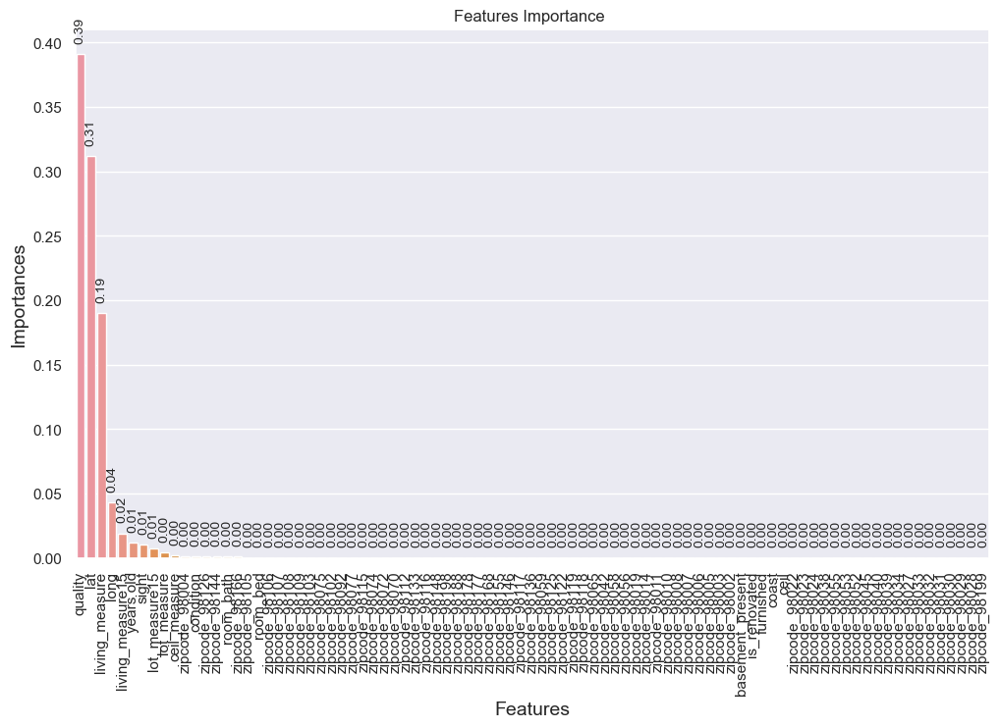

In [262]:
# Defining the plot size
plt.figure(figsize=(12,7))

# Defining the values for x-axis, y-axis
# and from which dataframe the values are to be picked
plots = sns.barplot(df_imp.index,df_imp['Values'],data=df_imp) 
 
# Iterating over the bars one-by-one
for bar in plots.patches:
   
  # Using Matplotlib's annotate function and
  # passing the coordinates where the annotation shall be done
  # x-coordinate: bar.get_x() + bar.get_width() / 2
  # y-coordinate: bar.get_height()
  # free space to be left to make graph pleasing: (0, 8)
  # ha and va stand for the horizontal and vertical alignment
    plots.annotate(format(bar.get_height(), '.2f'), 
                   (bar.get_x() + bar.get_width() / 2, 
                    bar.get_height()), ha='center', va='bottom',
                   size=10, xytext=(0, 8),
                   textcoords='offset points',rotation=90)
 
# Setting the label for x-axis
plt.xlabel("Features", size=14)
plt.xticks(rotation=90)
# Setting the label for y-axis
plt.ylabel("Importances", size=14)
 
# Setting the title for the graph
plt.title("Features Importance ")


### Getting Performance Matrix of all Models Built So far

In [263]:
Perf_df2 = pd.concat([lr_df,Ridge1_df,Lasso1_df,SVR1_df,knn1_df,DT1_df, DT2_df])

Perf_df2

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,Linear Reg Model1,0.8750,0.1850,0.0342,0.1366,1.0504,0.8811,0.1822,0.0332,0.1343,1.0316
0,Linear-Reg Ridge1,0.8750,0.1850,0.0342,0.1366,1.0505,0.8810,0.1823,0.0332,0.1344,1.0322
0,Linear-Reg Lasso1,0.6352,0.3161,0.0999,0.2460,1.8839,0.6360,0.3187,0.1016,0.2490,1.9062
0,SVR1,0.8805,0.1809,0.0327,0.1319,1.0147,0.9233,0.1463,0.0214,0.1157,0.8905
0,knn1,0.8462,0.2053,0.0421,0.1465,1.1244,0.9996,0.0104,0.0001,0.0004,0.0035
0,DT1,0.7608,0.2560,0.0655,0.1824,1.4005,0.9996,0.0104,0.0001,0.0004,0.0035
0,DT2,0.8231,0.2201,0.0484,0.1599,1.2267,0.8920,0.1736,0.0301,0.1277,0.9813


## Ensemble techniques 

## Random Forest

In [264]:
rfcl = RandomForestRegressor(random_state=1,max_depth = 10, min_samples_leaf=5,min_samples_split=5)
rfcl = rfcl.fit(X_train, y_train)
preds_train = rfcl.predict(X_train)
preds_test = rfcl.predict(X_test)
#Model score and Deduction for each Model in a DataFrame
RF_trscore=r2_score(y_train,preds_train)
RF_trRMSE=np.sqrt(mean_squared_error(y_train, preds_train))
RF_trMSE=mean_squared_error(y_train, preds_train)
RF_trMAE=mean_absolute_error(y_train, preds_train)
RF_trMAPE=calculate_mape(y_train, preds_train)
RF_vlscore=r2_score(y_test,preds_test)
RF_vlRMSE=np.sqrt(mean_squared_error(y_test, preds_test))
RF_vlMSE=mean_squared_error(y_test, preds_test)
RF_vlMAE=mean_absolute_error(y_test, preds_test)
RF_vlMAPE=calculate_mape(y_test, preds_test)
RF_df=pd.DataFrame({'Method':['Random Forest'],'Val Score':RF_vlscore,'RMSE_vl': RF_vlRMSE, 'MSE_vl': RF_vlMSE, 'MAE_vl': RF_vlMAE,'MAPE_vl': RF_vlMAPE,'train Score':RF_trscore,'RMSE_tr': RF_trRMSE, 'MSE_tr': RF_trMSE, 'MAE_tr': RF_trMAE, 'MAPE_tr': RF_trMAPE})
RF_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,Random Forest,0.8682,0.1900,0.0361,0.1369,1.0515,0.9124,0.1564,0.0245,0.1131,0.8688


### Feature Importance

## Bagging Using base estimator as Decision Tree

In [265]:

bgcl = BaggingRegressor(base_estimator=DT2, n_estimators=50,random_state=1)
#bgcl = BaggingClassifier(n_estimators=50,random_state=1)
bgcl = bgcl.fit(X_train, y_train)
preds_test = bgcl.predict(X_test)
preds_train = bgcl.predict(X_train)

#Model score and Deduction for each Model in a DataFrame
bgcl_trscore=r2_score(y_train,preds_train)
bgcl_trRMSE=np.sqrt(mean_squared_error(y_train, preds_train))
bgcl_trMSE=mean_squared_error(y_train, preds_train)
bgcl_trMAE=mean_absolute_error(y_train, preds_train)
bgcl_trMAPE=calculate_mape(y_train, preds_train)
bgcl_vlscore=r2_score(y_test,preds_test)
bgcl_vlRMSE=np.sqrt(mean_squared_error(y_test, preds_test))
bgcl_vlMSE=mean_squared_error(y_test, preds_test)
bgcl_vlMAE=mean_absolute_error(y_test, preds_test)
bgcl_vlMAPE=calculate_mape(y_test, preds_test)
bgcl_df=pd.DataFrame({'Method':['Bagging DT'],'Val Score':bgcl_vlscore,'RMSE_vl': bgcl_vlRMSE, 'MSE_vl': bgcl_vlMSE, 'MAE_vl': bgcl_vlMAE, 'MAPE_vl': bgcl_vlMAPE,'train Score':bgcl_trscore,'RMSE_tr': bgcl_trRMSE, 'MSE_tr': bgcl_trMSE, 'MAE_tr': bgcl_trMAE, 'MAPE_tr': bgcl_trMAPE})
bgcl_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,Bagging DT,0.8673,0.1906,0.0363,0.1373,1.0543,0.9117,0.1570,0.0246,0.1136,0.8728


## Bagging Using base estimator as Random Forest

In [266]:

b_rfcl = BaggingRegressor(base_estimator=rfcl, n_estimators=50,random_state=1)
#bgcl = BaggingClassifier(n_estimators=50,random_state=1)
b_rfcl = b_rfcl.fit(X_train, y_train)
preds_test = b_rfcl.predict(X_test)
preds_train = b_rfcl.predict(X_train)

#Model score and Deduction for each Model in a DataFrame
b_rfcl_trscore=r2_score(y_train,preds_train)
b_rfcl_trRMSE=np.sqrt(mean_squared_error(y_train, preds_train))
b_rfcl_trMSE=mean_squared_error(y_train, preds_train)
b_rfcl_trMAE=mean_absolute_error(y_train, preds_train)
b_rfcl_trMAPE=calculate_mape(y_train, preds_train)
b_rfcl_vlscore=r2_score(y_test,preds_test)
b_rfcl_vlRMSE=np.sqrt(mean_squared_error(y_test, preds_test))
b_rfcl_vlMSE=mean_squared_error(y_test, preds_test)
b_rfcl_vlMAE=mean_absolute_error(y_test, preds_test)
b_rfcl_vlMAPE=calculate_mape(y_test, preds_test)
b_rfcl_df=pd.DataFrame({'Method':['Bagging RF'],'Val Score':b_rfcl_vlscore,'RMSE_vl': b_rfcl_vlRMSE, 'MSE_vl': b_rfcl_vlMSE, 'MAE_vl': b_rfcl_vlMAE,'MAPE_vl': b_rfcl_vlMAPE,'train Score':b_rfcl_trscore,'RMSE_tr': b_rfcl_trRMSE, 'MSE_tr': b_rfcl_trMSE, 'MAE_tr': b_rfcl_trMAE, 'MAPE_tr': b_rfcl_trMAPE})
b_rfcl_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,Bagging RF,0.8707,0.1882,0.0354,0.1353,1.0393,0.9050,0.1628,0.0265,0.1167,0.8961


## Gradient Boosting Regressor with no Parameters

In [267]:

gbm = GradientBoostingRegressor()

gbm = gbm.fit(X_train, y_train)
preds_test = gbm.predict(X_test)
preds_train = gbm.predict(X_train)
#Model score and Deduction for each Model in a DataFrame
gbm_trscore=r2_score(y_train,preds_train)
gbm_trRMSE=np.sqrt(mean_squared_error(y_train, preds_train))
gbm_trMSE=mean_squared_error(y_train, preds_train)
gbm_trMAE=mean_absolute_error(y_train, preds_train)
gbm_trMAPE=calculate_mape(y_train, preds_train)
gbm_vlscore=r2_score(y_test,preds_test)
gbm_vlRMSE=np.sqrt(mean_squared_error(y_test, preds_test))
gbm_vlMSE=mean_squared_error(y_test, preds_test)
gbm_vlMAE=mean_absolute_error(y_test, preds_test)
gbm_vlMAPE=calculate_mape(y_test, preds_test)
gbm_df=pd.DataFrame({'Method':['Gradient Boosting'],'Val Score':gbm_vlscore,'RMSE_vl': gbm_vlRMSE, 'MSE_vl': gbm_vlMSE, 'MAE_vl': gbm_vlMAE,'MAPE_vl': gbm_vlMAPE,'train Score':gbm_trscore,'RMSE_tr': gbm_trRMSE, 'MSE_tr': gbm_trMSE, 'MAE_tr': gbm_trMAE, 'MAPE_tr': gbm_trMAPE})
gbm_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,Gradient Boosting,0.8727,0.1867,0.0349,0.1373,1.0558,0.8894,0.1757,0.0309,0.1295,0.9951


## Gradient Boosting Regressor with parameters

In [269]:
gbm2 = GradientBoostingRegressor(n_estimators=500,max_depth = 10, min_samples_leaf=10,min_samples_split=10
                        ,learning_rate=0.05,max_features='sqrt',loss='squared_error',random_state=1)

gbm2 = gbm2.fit(X_train, y_train)
preds_test = gbm2.predict(X_test)
preds_train = gbm2.predict(X_train)
#Model score and Deduction for each Model in a DataFrame
gbm2_trscore=r2_score(y_train,preds_train)
gbm2_trRMSE=np.sqrt(mean_squared_error(y_train, preds_train))
gbm2_trMSE=mean_squared_error(y_train, preds_train)
gbm2_trMAE=mean_absolute_error(y_train, preds_train)
gbm2_trMAPE=calculate_mape(y_train, preds_train)
gbm2_vlscore=r2_score(y_test,preds_test)
gbm2_vlRMSE=np.sqrt(mean_squared_error(y_test, preds_test))
gbm2_vlMSE=mean_squared_error(y_test, preds_test)
gbm2_vlMAE=mean_absolute_error(y_test, preds_test)
gbm2_vlMAPE=calculate_mape(y_test, preds_test)
gbm2_df=pd.DataFrame({'Method':['Gradient Boosting'],'Val Score':gbm2_vlscore,'RMSE_vl': gbm2_vlRMSE, 'MSE_vl': gbm2_vlMSE, 'MAE_vl': gbm2_vlMAE,'MAPE_vl': gbm2_vlMAPE,'train Score':gbm2_trscore,'RMSE_tr': gbm2_trRMSE, 'MSE_tr': gbm2_trMSE, 'MAE_tr': gbm2_trMAE, 'MAPE_tr': gbm2_trMAPE})
gbm2_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,Gradient Boosting,0.9013,0.1645,0.0270,0.1169,0.9013,0.9628,0.1020,0.0104,0.0734,0.5667


## ADA  Boosting Regressor

In [270]:

ada = AdaBoostRegressor(n_estimators=50,base_estimator=RandomForestRegressor(max_depth = 10, min_samples_leaf=5,min_samples_split=5)
                        ,learning_rate=1,loss='square',random_state=1)

ada = ada.fit(X_train, y_train)
preds_test = ada.predict(X_test)
preds_train = ada.predict(X_train)
#Model score and Deduction for each Model in a DataFrame
ada_trscore=r2_score(y_train,preds_train)
ada_trRMSE=np.sqrt(mean_squared_error(y_train, preds_train))
ada_trMSE=mean_squared_error(y_train, preds_train)
ada_trMAE=mean_absolute_error(y_train, preds_train)
ada_trMAPE=calculate_mape(y_train, preds_train)
ada_vlscore=r2_score(y_test,preds_test)
ada_vlRMSE=np.sqrt(mean_squared_error(y_test, preds_test))
ada_vlMSE=mean_squared_error(y_test, preds_test)
ada_vlMAE=mean_absolute_error(y_test, preds_test)
ada_vlMAPE=calculate_mape(y_test, preds_test)
ada_df=pd.DataFrame({'Method':['Ada Boosting'],'Val Score':ada_vlscore,'RMSE_vl': ada_vlRMSE, 'MSE_vl': ada_vlMSE, 'MAE_vl': ada_vlMAE,'MAPE_vl': ada_vlMAPE,'train Score':ada_trscore,'RMSE_tr': ada_trRMSE, 'MSE_tr': ada_trMSE, 'MAE_tr': ada_trMAE, 'MAPE_tr': ada_trMAPE})
ada_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,Ada Boosting,0.8791,0.1819,0.0331,0.1357,1.0429,0.9312,0.1386,0.0192,0.1135,0.8719


## XG  Boosting Regressor with no Parameters

In [271]:
xg_reg = XGBRegressor()

xg_reg.fit(X_train,y_train)

preds_test = xg_reg.predict(X_test)
preds_train = xg_reg.predict(X_train)

#Model score and Deduction for each Model in a DataFrame
xg_reg_trscore=r2_score(y_train,preds_train)
xg_reg_trRMSE=np.sqrt(mean_squared_error(y_train, preds_train))
xg_reg_trMSE=mean_squared_error(y_train, preds_train)
xg_reg_trMAE=mean_absolute_error(y_train, preds_train)
xg_reg_trMAPE=calculate_mape(y_train, preds_train)
xg_reg_vlscore=r2_score(y_test,preds_test)
xg_reg_vlRMSE=np.sqrt(mean_squared_error(y_test, preds_test))
xg_reg_vlMSE=mean_squared_error(y_test, preds_test)
xg_reg_vlMAE=mean_absolute_error(y_test, preds_test)
xg_reg_vlMAPE=calculate_mape(y_test, preds_test)
xg_reg_df=pd.DataFrame({'Method':['XG Boosting'],'Val Score':xg_reg_vlscore,'RMSE_vl': xg_reg_vlRMSE, 'MSE_vl': xg_reg_vlMSE, 'MAE_vl': xg_reg_vlMAE, 'MAPE_vl': xg_reg_vlMAPE,'train Score':xg_reg_trscore,'RMSE_tr': xg_reg_trRMSE, 'MSE_tr': xg_reg_trMSE, 'MAE_tr': xg_reg_trMAE, 'MAPE_tr': xg_reg_trMAPE})
xg_reg_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,XG Boosting,0.8914,0.1724,0.0297,0.1227,0.9439,0.9557,0.1112,0.0124,0.0822,0.6333


## XG  Boosting Regressor with booster as Dart

In [272]:
xg_reg2 = XGBRegressor(booster='dart',verbosity=1, nthread=4,n_estimators=500,
                      max_depth=7, learning_rate=0.07, eval_metric='rmse',
                      rate_drop=0.01,normalize_type='forest')

xg_reg2.fit(X_train,y_train)

preds_test = xg_reg2.predict(X_test)
preds_train = xg_reg2.predict(X_train)

#Model score and Deduction for each Model in a DataFrame
xg_reg2_trscore=r2_score(y_train,preds_train)
xg_reg2_trRMSE=np.sqrt(mean_squared_error(y_train, preds_train))
xg_reg2_trMSE=mean_squared_error(y_train, preds_train)
xg_reg2_trMAE=mean_absolute_error(y_train, preds_train)
xg_reg2_trMAPE=calculate_mape(y_train, preds_train)
xg_reg2_vlscore=r2_score(y_test,preds_test)
xg_reg2_vlRMSE=np.sqrt(mean_squared_error(y_test, preds_test))
xg_reg2_vlMSE=mean_squared_error(y_test, preds_test)
xg_reg2_vlMAE=mean_absolute_error(y_test, preds_test)
xg_reg2_vlMAPE=calculate_mape(y_test, preds_test)
xg_reg2_df2=pd.DataFrame({'Method':['XG Boosting with dart'],'Val Score':xg_reg2_vlscore,'RMSE_vl': xg_reg2_vlRMSE, 'MSE_vl': xg_reg2_vlMSE, 'MAE_vl': xg_reg2_vlMAE, 'MAPE_vl': xg_reg2_vlMAPE,'train Score':xg_reg2_trscore,'RMSE_tr': xg_reg2_trRMSE, 'MSE_tr': xg_reg2_trMSE, 'MAE_tr': xg_reg2_trMAE, 'MAPE_tr': xg_reg2_trMAPE})
xg_reg2_df2

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,XG Boosting with dart,0.9002,0.1653,0.0273,0.1166,0.8983,0.9711,0.0898,0.0081,0.0653,0.5043


## XG  Boosting Regressor with booster as gbtree

In [273]:
xg_reg = XGBRegressor(booster='gbtree',verbosity=1, nthread=4,n_estimators=200,
                      max_depth=5, learning_rate=0.07, eval_metric='rmse',
                      rate_drop=0.01,normalize_type='forest')

xg_reg.fit(X_train,y_train)

preds_test = xg_reg.predict(X_test)
preds_train = xg_reg.predict(X_train)

#Model score and Deduction for each Model in a DataFrame
xg_reg_trscore=r2_score(y_train,preds_train)
xg_reg_trRMSE=np.sqrt(mean_squared_error(y_train, preds_train))
xg_reg_trMSE=mean_squared_error(y_train, preds_train)
xg_reg_trMAE=mean_absolute_error(y_train, preds_train)
xg_reg_trMAPE=calculate_mape(y_train, preds_train)
xg_reg_vlscore=r2_score(y_test,preds_test)
xg_reg_vlRMSE=np.sqrt(mean_squared_error(y_test, preds_test))
xg_reg_vlMSE=mean_squared_error(y_test, preds_test)
xg_reg_vlMAE=mean_absolute_error(y_test, preds_test)
xg_reg_vlMAPE=calculate_mape(y_test, preds_test)
xg_reg_df3=pd.DataFrame({'Method':['XG Boosting with gbtree'],'Val Score':xg_reg_vlscore,'RMSE_vl': xg_reg_vlRMSE, 'MSE_vl': xg_reg_vlMSE, 'MAE_vl': xg_reg_vlMAE, 'MAPE_vl': xg_reg_vlMAPE,'train Score':xg_reg_trscore,'RMSE_tr': xg_reg_trRMSE, 'MSE_tr': xg_reg_trMSE, 'MAE_tr': xg_reg_trMAE, 'MAPE_tr': xg_reg_trMAPE})
xg_reg_df3

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,XG Boosting with gbtree,0.8948,0.1698,0.0288,0.1221,0.9400,0.9256,0.1441,0.0208,0.1055,0.8124


### Getting Performance Matrix of all Models Built So far

In [274]:
Perf_df4 = pd.concat([Perf_df2,RF_df,bgcl_df,b_rfcl_df,gbm_df,gbm2_df,ada_df, xg_reg_df,xg_reg_df2,xg_reg_df3])

Perf_df4

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,Linear Reg Model1,0.8750,0.1850,0.0342,0.1366,1.0504,0.8811,0.1822,0.0332,0.1343,1.0316
0,Linear-Reg Ridge1,0.8750,0.1850,0.0342,0.1366,1.0505,0.8810,0.1823,0.0332,0.1344,1.0322
0,Linear-Reg Lasso1,0.6352,0.3161,0.0999,0.2460,1.8839,0.6360,0.3187,0.1016,0.2490,1.9062
0,SVR1,0.8805,0.1809,0.0327,0.1319,1.0147,0.9233,0.1463,0.0214,0.1157,0.8905
0,knn1,0.8462,0.2053,0.0421,0.1465,1.1244,0.9996,0.0104,0.0001,0.0004,0.0035
0,DT1,0.7608,0.2560,0.0655,0.1824,1.4005,0.9996,0.0104,0.0001,0.0004,0.0035
0,DT2,0.8231,0.2201,0.0484,0.1599,1.2267,0.8920,0.1736,0.0301,0.1277,0.9813
0,Random Forest,0.8682,0.1900,0.0361,0.1369,1.0515,0.9124,0.1564,0.0245,0.1131,0.8688
0,Bagging DT,0.8673,0.1906,0.0363,0.1373,1.0543,0.9117,0.1570,0.0246,0.1136,0.8728
0,Bagging RF,0.8707,0.1882,0.0354,0.1353,1.0393,0.9050,0.1628,0.0265,0.1167,0.8961


## Hyper paramters Tuning of Ensemble Models 

### Ridge with Grid Search

In [275]:

params = {"alpha":[10,20,30,50,100]}
ridge = Ridge()
model1 = GridSearchCV(ridge, param_grid=params, cv = 10,)
model1.fit(X_train, y_train)

print(f"Best Hyper Parameters:\n\n{model1.best_params_}")#predicting result over test data
#Model score and Deduction for each Model in a DataFrame

model1.fit(X_train, y_train)
#predicting result over test data
best_Ridge=model1.best_estimator_
y_Ridge2_predtr= best_Ridge.predict(X_train)
y_Ridge2_predvl= best_Ridge.predict(X_test)
Ridge2_trscore=r2_score(y_train,y_Ridge2_predtr)
Ridge2_trRMSE=np.sqrt(mean_squared_error(y_train, y_Ridge2_predtr))
Ridge2_trMSE=mean_squared_error(y_train, y_Ridge2_predtr)
Ridge2_trMAE=mean_absolute_error(y_train, y_Ridge2_predtr)
Ridge2_trMAPE=calculate_mape(y_train, y_Ridge2_predtr)
Ridge2_vlscore=r2_score(y_test,y_Ridge2_predvl)
Ridge2_vlRMSE=np.sqrt(mean_squared_error(y_test, y_Ridge2_predvl))
Ridge2_vlMSE=mean_squared_error(y_test, y_Ridge2_predvl)
Ridge2_vlMAE=mean_absolute_error(y_test, y_Ridge2_predvl)
Ridge2_vlMAPE=calculate_mape(y_test, y_Ridge2_predvl)
Ridge2_df=pd.DataFrame({'Method':['Ridge with Hyper Params'],'Val Score':Ridge2_vlscore,'RMSE_vl': Ridge2_vlRMSE, 'MSE_vl': Ridge2_vlMSE, 'MAE_vl': Ridge2_vlMAE, 'MAPE_vl': Ridge2_vlMAPE,'train Score':Ridge2_trscore,'RMSE_tr': Ridge2_trRMSE, 'MSE_tr': Ridge2_trMSE, 'MAE_tr': Ridge2_trMAE, 'MAPE_tr': Ridge2_trMAPE})
Ridge2_df

Best Hyper Parameters:

{'alpha': 10}


,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,Ridge with Hyper Params,0.8750,0.1850,0.0342,0.1366,1.0502,0.8810,0.1822,0.0332,0.1343,1.0318


### Lasso with Grid Search

In [276]:

params = {"alpha":[0.1,0.2,0.5,1]}
lasso = Lasso()
model2 = GridSearchCV(lasso, param_grid=params, cv = 10)
model2.fit(X_train, y_train)
print(f"Best Hyper Parameters:\n\n{model2.best_params_}")
best_lasso=model2.best_estimator_
#predicting result over test data
y_Lasso2_predtr= best_lasso.predict(X_train)
y_Lasso2_predvl= best_lasso.predict(X_test)#Model score and Deduction for each Model in a DataFrame
Lasso2_trscore=r2_score(y_train,y_Lasso2_predtr)
Lasso2_trRMSE=np.sqrt(mean_squared_error(y_train, y_Lasso2_predtr))
Lasso2_trMSE=mean_squared_error(y_train, y_Lasso2_predtr)
Lasso2_trMAE=mean_absolute_error(y_train, y_Lasso2_predtr)
Lasso2_trMAPE=calculate_mape(y_train, y_Lasso2_predtr)
Lasso2_vlscore=r2_score(y_test,y_Lasso2_predvl)
Lasso2_vlRMSE=np.sqrt(mean_squared_error(y_test, y_Lasso2_predvl))
Lasso2_vlMSE=mean_squared_error(y_test, y_Lasso2_predvl)
Lasso2_vlMAE=mean_absolute_error(y_test, y_Lasso2_predvl)
Lasso2_vlMAPE=calculate_mape(y_test, y_Lasso2_predvl)
Lasso2_df=pd.DataFrame({'Method':['Lasso with Hyper Params'],'Val Score':Lasso2_vlscore,'RMSE_vl': Lasso2_vlRMSE, 'MSE_vl': Lasso2_vlMSE, 'MAE_vl': Lasso2_vlMAE, 'MAPE_vl': Lasso2_vlMAPE,'train Score':Lasso2_trscore,'RMSE_tr': Lasso2_trRMSE, 'MSE_tr': Lasso2_trMSE, 'MAE_tr': Lasso2_trMAE, 'MAPE_tr': Lasso2_trMAPE})
Lasso2_df

Best Hyper Parameters:

{'alpha': 0.1}


,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,Lasso with Hyper Params,0.6352,0.3161,0.0999,0.2460,1.8839,0.6360,0.3187,0.1016,0.2490,1.9062


### KNN with Grid Search

In [277]:
from sklearn.neighbors import KNeighborsRegressor

In [278]:
knn_regressor = KNeighborsRegressor()
param_grid = {
    'n_neighbors': [3, 5, 7],    # Example values for the number of neighbors
    'weights': ['uniform', 'distance'],  # Example values for the weight function
    'metric': ['euclidean', 'manhattan']  # Example values for the distance metric
}
KNN_grid_search = GridSearchCV(knn_regressor, param_grid, scoring='neg_mean_squared_error', cv=5)

KNN_grid_search.fit(X_train, y_train)

KNN_grid_search.fit(X_train, y_train)
print(f"Best Hyper Parameters:\n\n{KNN_grid_search.best_params_}")
#predicting result over test data
best_knn=KNN_grid_search.best_estimator_
y_knn2_predtr= best_knn.predict(X_train)
y_knn2_predvl= best_knn.predict(X_test)

#Model score and Deduction for each Model in a DataFrame
knn2_trscore=r2_score(y_train,y_knn2_predtr)
knn2_trRMSE=np.sqrt(mean_squared_error(y_train, y_knn2_predtr))
knn2_trMSE=mean_squared_error(y_train, y_knn2_predtr)
knn2_trMAE=mean_absolute_error(y_train, y_knn2_predtr)
knn2_trMAPE=calculate_mape(y_train, y_knn2_predtr)
knn2_vlscore=r2_score(y_test,y_knn2_predvl)
knn2_vlRMSE=np.sqrt(mean_squared_error(y_test, y_knn2_predvl))
knn2_vlMSE=mean_squared_error(y_test, y_knn2_predvl)
knn2_vlMAE=mean_absolute_error(y_test, y_knn2_predvl)
knn2_vlMAPE=calculate_mape(y_test, y_knn2_predvl)
knn2_df=pd.DataFrame({'Method':['knn grid search '],'Val Score':knn2_vlscore,'RMSE_vl':knn2_vlRMSE, 'MSE_vl': knn2_vlMSE, 'MAE_vl': knn2_vlMAE, 'MAPE_vl': knn2_vlMAPE,'train Score':knn2_trscore,'RMSE_tr': knn2_trRMSE, 'MSE_tr': knn2_trMSE, 'MAE_tr':knn2_trMAE, 'MAPE_tr':knn2_trMAPE})

knn2_df

Best Hyper Parameters:

{'metric': 'manhattan', 'n_neighbors': 7, 'weights': 'distance'}


,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,knn grid search,0.8613,0.1949,0.0380,0.1380,1.0595,0.9996,0.0104,0.0001,0.0004,0.0035


### Random Forest with Grid Search

In [279]:

rf = RandomForestRegressor()
# Number of trees in random forest
n_estimators = [50,60 ,70,80,90,100]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [2,4,6,8,10,15]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_leaf': [1, 2, 5, 10]}


rf_random = GridSearchCV(estimator = rf, param_grid = random_grid, cv = 3, verbose=2, n_jobs=20)

rf_random.fit(X_train, y_train)
print(f"Best Hyper Parameters:\n\n{rf_random.best_params_}")
best_rf=rf_random.best_estimator_
#predicting result over test data
y_rf_gscv_predtr= best_rf.predict(X_train)
y_rf_gscv_predvl= best_rf.predict(X_test)#Model score and Deduction for each Model in a DataFrame
rf_gscv_trscore=r2_score(y_train,y_rf_gscv_predtr)
rf_gscv_trRMSE=np.sqrt(mean_squared_error(y_train, y_rf_gscv_predtr))
rf_gscv_trMSE=mean_squared_error(y_train, y_rf_gscv_predtr)
rf_gscv_trMAE=mean_absolute_error(y_train, y_rf_gscv_predtr)
rf_gscv_trMAPE=calculate_mape(y_train, y_rf_gscv_predtr)
rf_gscv_vlscore=r2_score(y_test,y_rf_gscv_predvl)
rf_gscv_vlRMSE=np.sqrt(mean_squared_error(y_test, y_rf_gscv_predvl))
rf_gscv_vlMSE=mean_squared_error(y_test, y_rf_gscv_predvl)
rf_gscv_vlMAE=mean_absolute_error(y_test, y_rf_gscv_predvl)
rf_gscv_vlMAPE=calculate_mape(y_test, y_rf_gscv_predvl)
rf_gscv_df=pd.DataFrame({'Method':['RF with Hyper Params'],'Val Score':rf_gscv_vlscore,'RMSE_vl': rf_gscv_vlRMSE, 'MSE_vl': rf_gscv_vlMSE, 'MAE_vl': rf_gscv_vlMAE, 'MAPE_vl': rf_gscv_vlMAPE,'train Score':rf_gscv_trscore,'RMSE_tr': rf_gscv_trRMSE, 'MSE_tr': rf_gscv_trMSE, 'MAE_tr': rf_gscv_trMAE, 'MAPE_tr': rf_gscv_trMAPE})
rf_gscv_df


Fitting 3 folds for each of 288 candidates, totalling 864 fits
Best Hyper Parameters:

{'max_depth': 15, 'max_features': 'auto', 'min_samples_leaf': 1, 'n_estimators': 100}


,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,RF with Hyper Params,0.8812,0.1804,0.0325,0.1286,0.9886,0.9688,0.0934,0.0087,0.0689,0.5305


### XG Boost with Random Search

In [280]:
xgb = XGBRegressor()
parameters = {
              'learning_rate': [.03, 0.05, .07], 
              'max_depth': [2,5,7,8,10],
              'n_estimators': [50,100,150,200]}

xgb_random = RandomizedSearchCV(xgb,
                        parameters,
                        cv = 3,
                        n_jobs = 5,
                        verbose=1,n_iter=100)

xgb_random.fit(X_train,y_train)
print(f"Best Hyper Parameters:\n\n{xgb_random.best_params_}")
best_xgr=xgb_random.best_estimator_
#predicting result over test data
y_xgb_random_predtr= best_xgr.predict(X_train)
y_xgb_random_predvl= best_xgr.predict(X_test)#Model score and Deduction for each Model in a DataFrame
xgb_random_trscore=r2_score(y_train,y_xgb_random_predtr)
xgb_random_trRMSE=np.sqrt(mean_squared_error(y_train, y_xgb_random_predtr))
xgb_random_trMSE=mean_squared_error(y_train, y_xgb_random_predtr)
xgb_random_trMAE=mean_absolute_error(y_train, y_xgb_random_predtr)
xgb_random_trMAPE=calculate_mape(y_train, y_xgb_random_predtr)
xgb_random_vlscore=r2_score(y_test,y_xgb_random_predvl)
xgb_random_vlRMSE=np.sqrt(mean_squared_error(y_test, y_xgb_random_predvl))
xgb_random_vlMSE=mean_squared_error(y_test, y_xgb_random_predvl)
xgb_random_vlMAE=mean_absolute_error(y_test, y_xgb_random_predvl)
xgb_random_vlMAPE=calculate_mape(y_test, y_xgb_random_predvl)
xgb_random_df=pd.DataFrame({'Method':['XGB with Hyper Params Random Search '],'Val Score':xgb_random_vlscore,'RMSE_vl': xgb_random_vlRMSE, 'MSE_vl': xgb_random_vlMSE, 'MAE_vl': xgb_random_vlMAE, 'MAPE_vl': xgb_random_vlMAPE,'train Score':xgb_random_trscore,'RMSE_tr': xgb_random_trRMSE, 'MSE_tr': xgb_random_trMSE, 'MAE_tr': xgb_random_trMAE, 'MAPE_tr': xgb_random_trMAPE})
xgb_random_df


Fitting 3 folds for each of 60 candidates, totalling 180 fits
Best Hyper Parameters:

{'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.07}


,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,XGB with Hyper Params Random Search,0.8967,0.1682,0.0283,0.1192,0.9177,0.9513,0.1166,0.0136,0.0852,0.6568


### XG Boost with Grid Search

In [282]:
xgb1 = XGBRegressor()
parameters = {
              'learning_rate': [.03, 0.05, .07], 
              'max_depth': [2,5,7,8,10],
              'n_estimators': [3000,3500]}

xgb_Grid= GridSearchCV(xgb1,
                        parameters,
                        cv = 3,
                        n_jobs = 5,
                        verbose=1)

xgb_Grid.fit(X_train,y_train)
print(f"Best Hyper Parameters:\n\n{xgb_Grid.best_params_}")
best_xg=xgb_Grid.best_estimator_
#predicting result over test data
y_xgb_random_predtr= best_xg.predict(X_train)
y_xgb_random_predvl= best_xg.predict(X_test)#Model score and Deduction for each Model in a DataFrame
xgb_random_trscore=r2_score(y_train,y_xgb_random_predtr)
xgb_random_trRMSE=np.sqrt(mean_squared_error(y_train, y_xgb_random_predtr))
xgb_random_trMSE=mean_squared_error(y_train, y_xgb_random_predtr)
xgb_random_trMAE=mean_absolute_error(y_train, y_xgb_random_predtr)
xgb_random_trMAPE=calculate_mape(y_train, y_xgb_random_predtr)
xgb_random_vlscore=r2_score(y_test,y_xgb_random_predvl)
xgb_random_vlRMSE=np.sqrt(mean_squared_error(y_test, y_xgb_random_predvl))
xgb_random_vlMSE=mean_squared_error(y_test, y_xgb_random_predvl)
xgb_random_vlMAE=mean_absolute_error(y_test, y_xgb_random_predvl)
xgb_random_vlMAPE=calculate_mape(y_test, y_xgb_random_predvl)
xgb_gridCV_df=pd.DataFrame({'Method':['XGB with Hyper Params Grid Search '],'Val Score':xgb_random_vlscore,'RMSE_vl': xgb_random_vlRMSE, 'MSE_vl': xgb_random_vlMSE, 'MAE_vl': xgb_random_vlMAE, 'MAPE_vl': xgb_random_vlMAPE,'train Score':xgb_random_trscore,'RMSE_tr': xgb_random_trRMSE, 'MSE_tr': xgb_random_trMSE, 'MAE_tr': xgb_random_trMAE, 'MAPE_tr': xgb_random_trMAPE})
xgb_gridCV_df


Fitting 3 folds for each of 30 candidates, totalling 90 fits
Best Hyper Parameters:

{'learning_rate': 0.07, 'max_depth': 2, 'n_estimators': 3000}


,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,XGB with Hyper Params Grid Search,0.9000,0.1655,0.0274,0.1185,0.9131,0.9253,0.1444,0.0208,0.1051,0.8093


### Gradient Boost with Grid Search

In [ ]:
gb2 = GradientBoostingRegressor()
param_grid = {
  'max_depth':[2,4,6,8,10],
 'max_features': ['auto','sqrt'],
 'learning_rate': [0.05,0.1,0.2],
 'min_samples_leaf': [4,10,20],
 'min_samples_split': [5,10],
 'n_estimators': [150,200],
 }

gb_gridCV = GridSearchCV(gb2,
                        param_grid,
                        cv = 3,
                        n_jobs = 2,
                        verbose=1)

gb_gridCV.fit(X_train,y_train)
print(f"Best Hyper Parameters:\n\n{gb_gridCV.best_params_}")
best_gb=gb_gridCV.best_estimator_
#predicting result over test data
y_gb_gridCV_predtr= best_gb.predict(X_train)
y_gb_gridCV_predvl= best_gb.predict(X_test)
#Model score and Deduction for each Model in a DataFrame
gb_gridCV_trscore=r2_score(y_train,y_gb_gridCV_predtr)
gb_gridCV_trRMSE=np.sqrt(mean_squared_error(y_train, y_gb_gridCV_predtr))
gb_gridCV_trMSE=mean_squared_error(y_train, y_gb_gridCV_predtr)
gb_gridCV_trMAE=mean_absolute_error(y_train, y_gb_gridCV_predtr)
gb_gridCV_trMAPE=calculate_mape(y_train, y_gb_gridCV_predtr)
gb_gridCV_vlscore=r2_score(y_test,y_gb_gridCV_predvl)
gb_gridCV_vlRMSE=np.sqrt(mean_squared_error(y_test, y_gb_gridCV_predvl))
gb_gridCV_vlMSE=mean_squared_error(y_test, y_gb_gridCV_predvl)
gb_gridCV_vlMAE=mean_absolute_error(y_test, y_gb_gridCV_predvl)
gb_gridCV_vlMAPE=calculate_mape(y_test, y_gb_gridCV_predvl)
gb_gridCV_df=pd.DataFrame({'Method':['GB with Hyper Params Grid Search '],'Val Score':gb_gridCV_vlscore,'RMSE_vl': gb_gridCV_vlRMSE, 'MSE_vl': gb_gridCV_vlMSE, 'MAE_vl': gb_gridCV_vlMAE, 'MAPE_vl': gb_gridCV_vlMAPE,'train Score':gb_gridCV_trscore,'RMSE_tr': gb_gridCV_trRMSE, 'MSE_tr': gb_gridCV_trMSE,'MAE_tr': gb_gridCV_trMAE, 'MAPE_tr': gb_gridCV_trMAPE})
gb_gridCV_df

In [283]:
gb2 = GradientBoostingRegressor()
param_grid = {
  'max_depth':[10,15],
 'max_features': ['auto','sqrt'],
 'learning_rate': [0.05,0.1],
 'min_samples_leaf': [10,20],
 'min_samples_split': [10,15],
 'n_estimators': [250,500,1000],
 }

gb_gridCV = GridSearchCV(gb2,
                        param_grid,
                        cv = 3,
                        n_jobs = 2,
                        verbose=1)

gb_gridCV.fit(X_train,y_train)
print(f"Best Hyper Parameters:\n\n{gb_gridCV.best_params_}")
best_gb=gb_gridCV.best_estimator_
#predicting result over test data
y_gb_gridCV_predtr= best_gb.predict(X_train)
y_gb_gridCV_predvl= best_gb.predict(X_test)
#Model score and Deduction for each Model in a DataFrame
gb_gridCV_trscore=r2_score(y_train,y_gb_gridCV_predtr)
gb_gridCV_trRMSE=np.sqrt(mean_squared_error(y_train, y_gb_gridCV_predtr))
gb_gridCV_trMSE=mean_squared_error(y_train, y_gb_gridCV_predtr)
gb_gridCV_trMAE=mean_absolute_error(y_train, y_gb_gridCV_predtr)
gb_gridCV_trMAPE=calculate_mape(y_train, y_gb_gridCV_predtr)
gb_gridCV_vlscore=r2_score(y_test,y_gb_gridCV_predvl)
gb_gridCV_vlRMSE=np.sqrt(mean_squared_error(y_test, y_gb_gridCV_predvl))
gb_gridCV_vlMSE=mean_squared_error(y_test, y_gb_gridCV_predvl)
gb_gridCV_vlMAE=mean_absolute_error(y_test, y_gb_gridCV_predvl)
gb_gridCV_vlMAPE=calculate_mape(y_test, y_gb_gridCV_predvl)
gb_gridCV_df=pd.DataFrame({'Method':['GB with Hyper Params Grid Search '],'Val Score':gb_gridCV_vlscore,'RMSE_vl': gb_gridCV_vlRMSE, 'MSE_vl': gb_gridCV_vlMSE, 'MAE_vl': gb_gridCV_vlMAE, 'MAPE_vl': gb_gridCV_vlMAPE,'train Score':gb_gridCV_trscore,'RMSE_tr': gb_gridCV_trRMSE, 'MSE_tr': gb_gridCV_trMSE,'MAE_tr': gb_gridCV_trMAE, 'MAPE_tr': gb_gridCV_trMAPE})
gb_gridCV_df

Fitting 3 folds for each of 96 candidates, totalling 288 fits
Best Hyper Parameters:

{'learning_rate': 0.05, 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 20, 'min_samples_split': 10, 'n_estimators': 500}


,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,GB with Hyper Params Grid Search,0.9011,0.1646,0.0271,0.1172,0.9029,0.9514,0.1165,0.0136,0.0837,0.6453


## Performance of All Models

In [284]:
Perf_df_final = pd.concat([Perf_df4,Ridge2_df,Lasso2_df,rf_gscv_df,xgb_random_df,xgb_gridCV_df,knn2_df,gb_gridCV_df])

Perf_df_final

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,Linear Reg Model1,0.8750,0.1850,0.0342,0.1366,1.0504,0.8811,0.1822,0.0332,0.1343,1.0316
0,Linear-Reg Ridge1,0.8750,0.1850,0.0342,0.1366,1.0505,0.8810,0.1823,0.0332,0.1344,1.0322
0,Linear-Reg Lasso1,0.6352,0.3161,0.0999,0.2460,1.8839,0.6360,0.3187,0.1016,0.2490,1.9062
0,SVR1,0.8805,0.1809,0.0327,0.1319,1.0147,0.9233,0.1463,0.0214,0.1157,0.8905
0,knn1,0.8462,0.2053,0.0421,0.1465,1.1244,0.9996,0.0104,0.0001,0.0004,0.0035
0,DT1,0.7608,0.2560,0.0655,0.1824,1.4005,0.9996,0.0104,0.0001,0.0004,0.0035
0,DT2,0.8231,0.2201,0.0484,0.1599,1.2267,0.8920,0.1736,0.0301,0.1277,0.9813
0,Random Forest,0.8682,0.1900,0.0361,0.1369,1.0515,0.9124,0.1564,0.0245,0.1131,0.8688
0,Bagging DT,0.8673,0.1906,0.0363,0.1373,1.0543,0.9117,0.1570,0.0246,0.1136,0.8728
0,Bagging RF,0.8707,0.1882,0.0354,0.1353,1.0393,0.9050,0.1628,0.0265,0.1167,0.8961


##  Feature Importance from GBoost

In [233]:
gbm2 = GradientBoostingRegressor(n_estimators=500,max_depth = 10, min_samples_leaf=10,min_samples_split=10
                        ,learning_rate=0.05,max_features='sqrt',loss='squared_error',random_state=1)

gbm2 = gbm2.fit(X_train, y_train)
preds_test = gbm2.predict(X_test)
preds_train = gbm2.predict(X_train)
#Model score and Deduction for each Model in a DataFrame
gbm2_trscore=r2_score(y_train,preds_train)
gbm2_trRMSE=np.sqrt(mean_squared_error(y_train, preds_train))
gbm2_trMSE=mean_squared_error(y_train, preds_train)
gbm2_trMAE=mean_absolute_error(y_train, preds_train)
gbm2_trMAPE=calculate_mape(y_train, preds_train)
gbm2_vlscore=r2_score(y_test,preds_test)
gbm2_vlRMSE=np.sqrt(mean_squared_error(y_test, preds_test))
gbm2_vlMSE=mean_squared_error(y_test, preds_test)
gbm2_vlMAE=mean_absolute_error(y_test, preds_test)
gbm2_vlMAPE=calculate_mape(y_test, preds_test)
gbm2_df=pd.DataFrame({'Method':['Gradient Boosting'],'Val Score':gbm2_vlscore,'RMSE_vl': gbm2_vlRMSE, 'MSE_vl': gbm2_vlMSE, 'MAE_vl': gbm2_vlMAE,'MAPE_vl': gbm2_vlMAPE,'train Score':gbm2_trscore,'RMSE_tr': gbm2_trRMSE, 'MSE_tr': gbm2_trMSE, 'MAE_tr': gbm2_trMAE, 'MAPE_tr': gbm2_trMAPE})
gbm2_df

,Method,Val Score,RMSE_vl,MSE_vl,MAE_vl,MAPE_vl,train Score,RMSE_tr,MSE_tr,MAE_tr,MAPE_tr
0,Gradient Boosting,0.9013,0.1645,0.0270,0.1169,0.9013,0.9628,0.1020,0.0104,0.0734,0.5667


Feature Importance:
lat: 0.23852162934383087
living_measure: 0.12803994882327138
furnished: 0.08173688302352482
living_measure15: 0.07218585841567297
quality: 0.0698175458791319
room_bath: 0.06129341825553753
ceil_measure: 0.059164676496001135
long: 0.028954200980196885
sight: 0.028121360445749904
ceil: 0.02420173250224748
years old: 0.023107257955964414
lot_measure15: 0.022644031737268738
lot_measure: 0.021125768570293555
zipcode_98004: 0.019193965121722577
room_bed: 0.018573788059247417
basement_present: 0.01585538344252049
coast: 0.00994949318106099
condition: 0.008135787062000242
zipcode_98040: 0.007671554275075574
zipcode_98023: 0.005891207265191623
zipcode_98112: 0.005357857992785851
zipcode_98039: 0.003969889698201477
zipcode_98033: 0.0030991655066400256
zipcode_98042: 0.0023158185846725537
is_renovated: 0.0019832888065800364
zipcode_98106: 0.0019602455563530875
zipcode_98115: 0.001905074864051109
zipcode_98117: 0.001772146405113917
zipcode_98168: 0.001643222197912823
zipcode_98

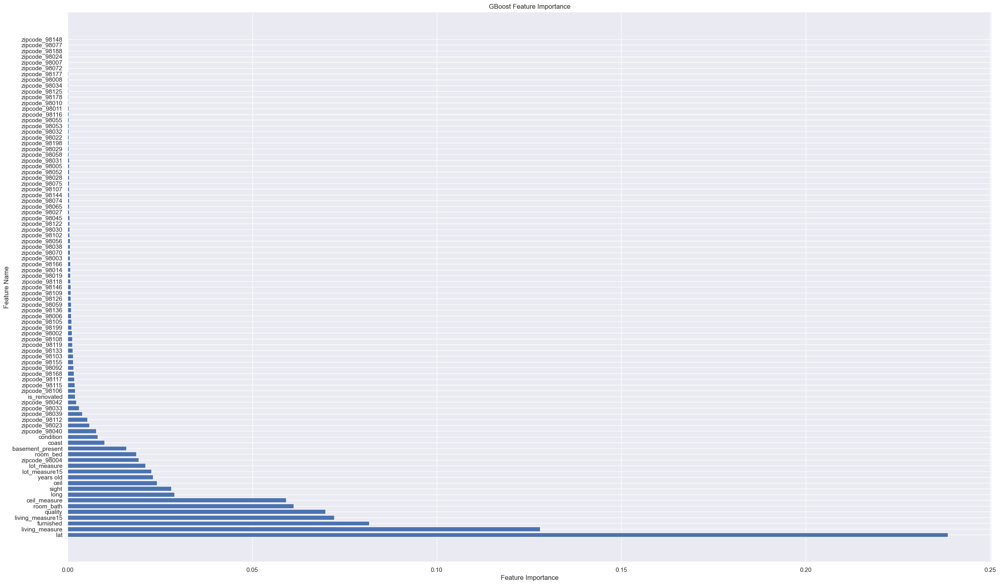

In [285]:
# Assuming gb_model is your trained GBoost model

# Get feature importance scores
feature_importance = gbm2.feature_importances_

# Get feature names
feature_names = gbm2.feature_names_in_

# Create a dictionary with feature names and their importance scores
feature_importance_dict = dict(zip(feature_names, feature_importance))

# Sort features by importance
sorted_feature_importance = sorted(feature_importance_dict.items(), key=lambda x: x[1], reverse=True)

# Print or visualize the feature importance
print("Feature Importance:")
for feature, importance in sorted_feature_importance:
    print(f"{feature}: {importance}")

# Plotting the feature importance
plt.figure(figsize=(30,18))
plt.barh(*zip(*sorted_feature_importance))
plt.xlabel('Feature Importance')
plt.ylabel('Feature Name')
plt.title('GBoost Feature Importance')
plt.show()

In [286]:
diff = abs(np.exp(y_test) - np.exp(preds_test))

compare_actual = pd.DataFrame({'Test Data': np.exp(y_test), 'Predicted Price' : np.exp(preds_test), 'Difference' : diff})
compare_actual = compare_actual.astype(float)
compare_actual.head(10)

,Test Data,Predicted Price,Difference
0,"390,000.0000","393,991.1562","3,991.1563"
1,"290,000.0000","396,361.2500","106,361.2500"
2,"455,000.0000","522,223.8125","67,223.8125"
3,"524,000.0000","607,344.0625","83,344.0625"
4,"295,000.0000","298,710.2188","3,710.2187"
5,"594,000.0000","550,512.0625","43,487.9375"
6,"660,000.0000","644,337.8125","15,662.1875"
7,"272,500.0000","302,549.4062","30,049.4062"
8,"95,000.0000","192,421.2656","97,421.2656"
9,"411,500.0000","330,597.6250","80,902.3750"


In [287]:
diff = abs((y_test) - (preds_test))

compare_actual = pd.DataFrame({'Test Data': (y_test), 'Predicted Price' : (preds_test), 'Difference' : diff})
compare_actual = compare_actual.astype(float)
compare_actual.head(10)

,Test Data,Predicted Price,Difference
0,12.8739,12.8841,0.0102
1,12.5776,12.8901,0.3124
2,13.0281,13.1659,0.1378
3,13.1692,13.3169,0.1476
4,12.5947,12.6072,0.0125
5,13.2946,13.2186,0.0760
6,13.4000,13.3760,0.0240
7,12.5154,12.6200,0.1046
8,11.4616,12.1674,0.7058
9,12.9276,12.7087,0.2189
